<a href="https://colab.research.google.com/github/siriwatsc-debug/ProjectDADS5001/blob/main/DADS5001_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Subject : DADS5001 - Tools and Programing
# Project : Pandas/Numpy
# Topic : EStudy the factors to occur the eartquake
# Team members : Siriwat/Sahaphum/Kridsada

# Analysis for insight and Story Telling
#: Global --> Local (Thailand) --> Risk Area --> Impact/Damage
# Overall explanation                                       Dong - DONE
# Thai sensors station                                      Dong - DONE
# Plates movements : Indian plate affected to Thailand      Dong - DONE


# Questions
# 1.แผ่นดินไหวเกิดขึ้นบ่อยที่สุดในช่วงปี/เดือน ?                        DROP
# 2.จังหวัดหรือภูมิภาคใดของไทยที่มีแผ่นดินไหวเกิดขึ้นบ่อยที่สุด?
#   2.1 Overall  by Region                                  Tiger : Bar x1 Chart - DONE
#   2.2 By Region and Magnitude                             Dong  : Map x5 - DONE
#   2.3 By Province : Top x5                                Tiger : Bar - DONE
#
#   By Depth / Phase ?                                      Tiger
# 3.ค่าขนาดแผ่นดินไหว (Magnitude) เฉลีย่ในแต่ละภูมิภาคเป็นอย่างไร? --> Should be Max
#   3.1 Average max                                         Tiger
# 4.ข้อมูลแผ่นดินไหวของไทยเมื่อเทียบกับประเทศในภูมิภาคเอเชียตะวันออกเฉียงใต้เป็นอย่างไร
#   4.1 Comparison : Frequency/Event/Mag by Country         Tiger/Dong - DONE
# 5.Disaster impact of EQ in thailand เป็นอย่างไร             Film

# Add
# : Risk Area (Top 5 province) and Non-Risk Area (Top 5 province), Mag occured > 0 and > 5
# : Depth and Phase related to risk area ? High : Depth / Phase , High Risk ?                 DROP ?
# : Station and Max count of --> From Paper : Sensor Orientation of the TMD Seismic Network (Thailand) from P-Wave Particle Motions (2009-2022)
#     https://earthquake.tmd.go.th/documents/file/Supplementary_Info_PatinyaPornsopin2022.pdf

# Next plan : Prediction but Data is huge and require Geo Knowledge on EQ parameters.


# PATH : Config

### Install Packet

In [ ]:
# install the required packages for map
!pip install cartopy folium
!pip install openpyxl
!pip install Pillow
!pip install mplcursors


### Import Library

In [ ]:

import sys
import pandas as pd
import numpy as np
import IPython
from IPython.display import display, Markdown, Latex, HTML, IFrame, JSON, Code, Image, YouTubeVideo, clear_output

import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from PIL import Image
from google.colab import drive

from pathlib import WindowsPath
import matplotlib.patches as patches

from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

import requests
from io import BytesIO

import warnings



### Load RAW File and Rename Column

In [ ]:
# Load datasets from Github :

# Raw file #

url1 = "https://github.com/siriwatsc-debug/ProjectDADS5001/raw/main/DATA_Earthquake_Master.xlsx"
url2 = "https://github.com/siriwatsc-debug/ProjectDADS5001/raw/main/ActiveFault-Plates.xlsx"
url3 = "https://github.com/siriwatsc-debug/ProjectDADS5001/raw/main/disaster_extracted.xlsx"

df_eq = pd.read_excel(url1 ,engine="openpyxl")
df = pd.read_excel(url1 ,engine="openpyxl")
df_pl = pd.read_excel(url2 , sheet_name="73 sensors EQ",engine="openpyxl")
df_dis = pd.read_excel(url3,sheet_name="Disaster_Extracted" ,engine="openpyxl")


# Pic #

url_img = "https://github.com/siriwatsc-debug/ProjectDADS5001/raw/main/Wiki_Earth_plates.png"
response = requests.get(url_img)
img = Image.open(BytesIO(response.content))


url_img1 = "https://github.com/siriwatsc-debug/ProjectDADS5001/raw/main/IndianPlate.png"
response = requests.get(url_img1)
img1 = Image.open(BytesIO(response.content))


url_img2 = "https://raw.githubusercontent.com/siriwatsc-debug/ProjectDADS5001/main/Thai_Fault_EU_Indian_plate.png"
response = requests.get(url_img2)
img2 = Image.open(BytesIO(response.content))


url_img3 = "https://raw.githubusercontent.com/siriwatsc-debug/ProjectDADS5001/main/Himalaya.gif"
response = requests.get(url_img3)
img3 = Image.open(BytesIO(response.content))



df_eq = df_eq.rename(columns={'No.':'no', 'REF. ID':'refid', 'DATE-TIME UTC':'dtutc','DATE_THAI':'date','YEAR':'year', 'MONTH' : 'month', 'DAY' : 'day',
                              'TIME THAI':'time', 'LAT.':'lat', 'LONG.':'long','MAG.':'mag',
                              'DEPTH.':'depth', 'PHASE.':'phase', 'REGION_NANE_THAI':'region_th','SUB_DISTINCT':'subdistrict', 'DISTINCT':'district',
                              'PROVINCE':'province', 'COUNTRY':'country', 'REGION':'region'}) # default: inplace=False





# INTRODUCTION

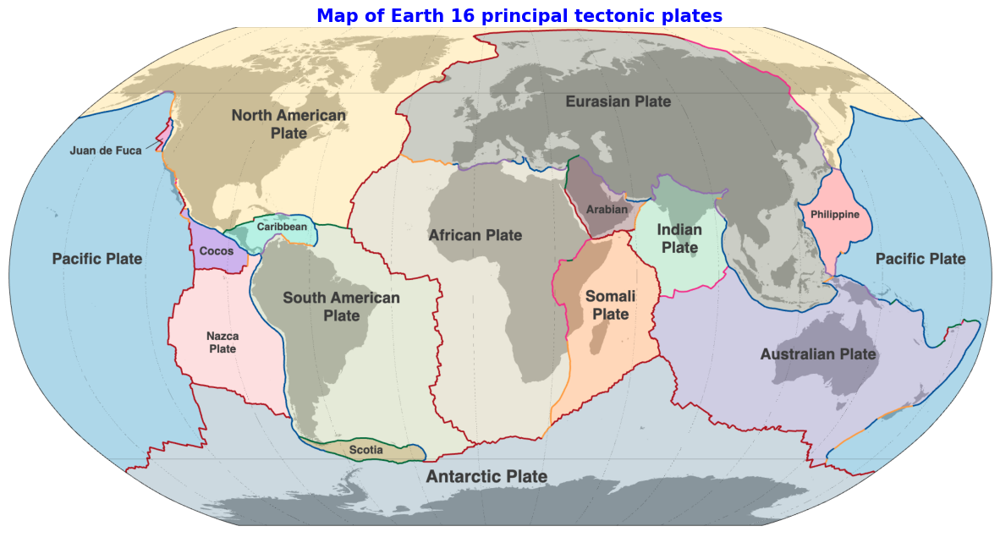

# แผนที่ : แผ่นเปลือกโลกหลัก 16 แผ่น
(Map of Earth's 16 principal tectonic plates)
## <font color=Green>ที่มา : wiki pedia (https://en.wikipedia.org/wiki/List_of_tectonic_plates)</font>


In [ ]:
# Add image 16 principal plates in the world

plt.figure(figsize=(15,10))
plt.imshow(img)
plt.text(600, -10, 'Map of Earth 16 principal tectonic plates', fontsize = 15, fontweight='bold', color='blue')
plt.axis('off')
plt.show()

s = """# แผนที่ : แผ่นเปลือกโลกหลัก 16 แผ่น
(Map of Earth's 16 principal tectonic plates)
## <font color=Green>ที่มา : wiki pedia (https://en.wikipedia.org/wiki/List_of_tectonic_plates)</font>
"""

display( Markdown(s) )

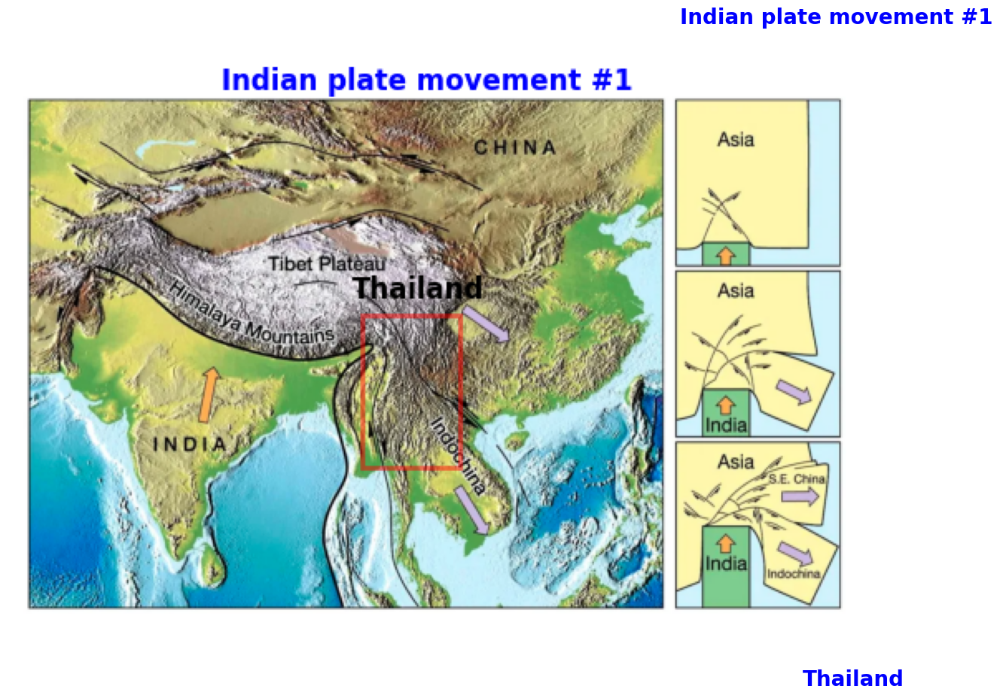

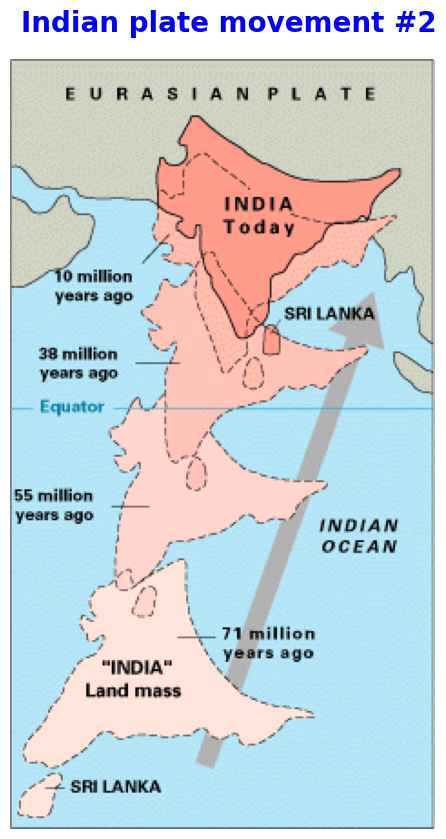

# แผ่นเปลือกโลกที่เคลื่อนตัวใกล้บริเวณประเทศไทย
## <font color=Green>ที่มา : wiki pedia (https://www.mitrearth.org/4-232-earthquake-thailand)</font>
### ขนาดพื้นที่ และ การเคลื่อนตัว
- Approximate area	11,900,000 km2 (4,600,000 sq mi)
- Movement:	North-east
- Speed1	26–36 mm/a (1.0–1.4 in/year)



In [ ]:
# Add Plate movement : Eurasia and Indian



fig, ax = plt.subplots(figsize=(15 , 10))
ax.imshow(img2)
ax.axis('off')
ax.text(500, -20, 'Indian plate movement #1', fontsize = 20, fontweight='bold', color='blue', ha='center', va='center')

# highlight rectangle to Thailand
x = 450
y = 400
width = 120
height = 220
highlight = patches.Rectangle( (x,y-10), width, height, linewidth=5, edgecolor='red', facecolor='none', alpha=0.5)
ax.add_patch(highlight)
ax.text(x+60, y-20, 'Thailand', fontsize = 20, fontweight='bold',  color='blue', ha='center', va='center')


# Add Plate movement : Indian

fig, ax = plt.subplots(figsize=(15 , 10))

ax.imshow(img3)
ax.axis('off')

# highlight rectangle to Thailand
x = 750
y = 270
width = 120
height = 270

# Add Indian plate movement
ax.text(120, -20, 'Indian plate movement #2', fontsize = 20, fontweight='bold', color='blue', ha='center', va='center')
plt.show()

# Add explanation for Indian plate movement
s = """# แผ่นเปลือกโลกที่เคลื่อนตัวใกล้บริเวณประเทศไทย
## <font color=Green>ที่มา : wiki pedia (https://www.mitrearth.org/4-232-earthquake-thailand)</font>
### ขนาดพื้นที่ และ การเคลื่อนตัว
- Approximate area	11,900,000 km2 (4,600,000 sq mi)
- Movement:	North-east
- Speed1	26–36 mm/a (1.0–1.4 in/year)

"""
display( Markdown(s) )


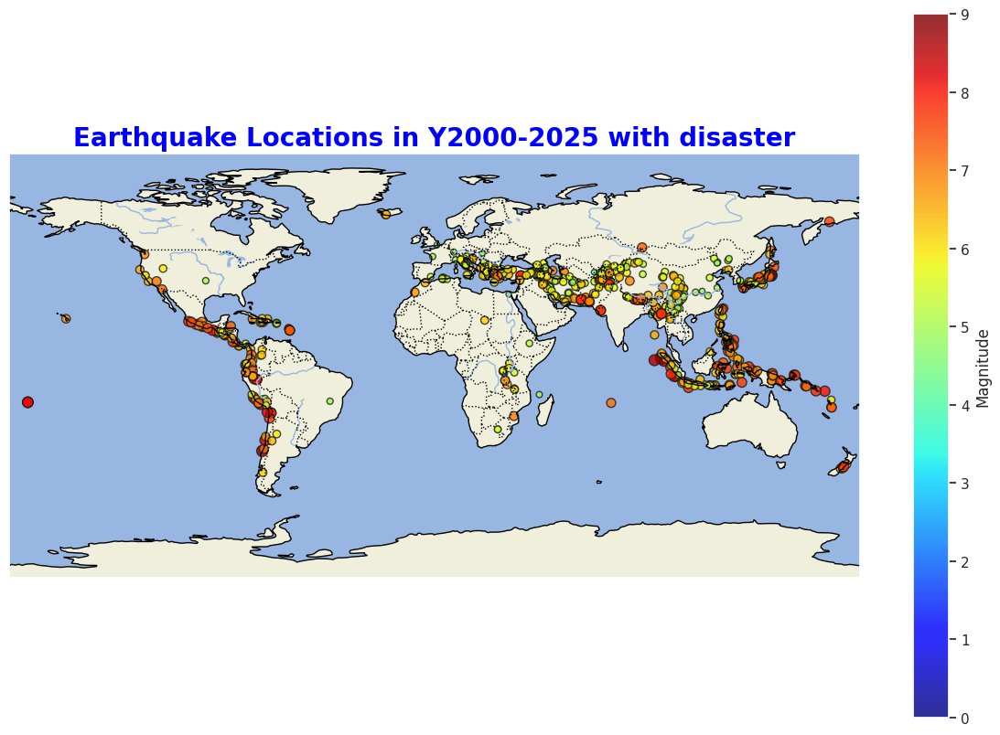

# Global : Earthquake with disasters
## <font color=Green>ที่มา :  https://www.emdat.be </font>



In [ ]:
# Overall Earth Quake Global with Disaster

# Set Data Frame : Disaster
#df = df_dis
#print(df.columns)

# Rename existing columns ID
df2 = df_dis.rename(columns={'DisNo.':'DisNo', 'Classification Key':'classKey',
                             'Disaster Type':'distype','Disaster Subtype':'dissubtype',
                             'Country':'country', 'Subregion':'subreg', 'Associated Types':'assotype',
                             'Magnitude':'mag', 'Latitude':'lat', 'Longitude':'long',  'Start Year':'styear',
                             'Start Month':'stmonth',
                             'Start Day':'stday', 'End Year':'endyear','End Month':'endmonth', 'End Day':'endday',
                             'Total Deaths':'totaldeaths', 'No. Injured':'injure','No. Affected':'affected',
                             'No. Homeless':'homeless', 'Total Affected':'totalaffected',
                             'Reconstruction Costs (\'000 US$)':'recon_cost',
                             'Reconstruction Costs, Adjusted (\'000 US$)':'recon_cost_adj',
                             'Insured Damage (\'000 US$)':'insuredamage',
                             'Insured Damage, Adjusted (\'000 US$)':'insuredamage_adj',
                             'Total Damage (\'000 US$)':'totaldamage',
                             'Total Damage, Adjusted (\'000 US$)' : 'totaldamage_adj',
                             'Entry Date':'entrydate', 'Last Update':'lastupdate'}) # default: inplace=False

#df2.info()

# column: 'Latitude', 'Longitude', 'Magnitude'
lat = df2["lat"]
lon = df2["long"]
mag = df2["mag"]

# Plot map
fig = plt.figure(figsize=(15, 10))
ax = plt.axes(projection=ccrs.PlateCarree())

# Add borders
#ax.add_feature(cfeature.STATES)
ax.add_feature(cfeature.LAKES)
ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.RIVERS)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=":")

# Set Frame to plot for Global
ax.set_extent([-180, 180, -180, 180], crs=ccrs.PlateCarree())

# plot EQ location by lat and long
sc = ax.scatter(
    lon, lat,
    c=mag, s=mag**2,   # ขนาดจุด ∝ magnitude
    cmap="jet", alpha=0.8,
    vmin=0, vmax=9.0,
    edgecolor="k", transform=ccrs.PlateCarree()
)

# colorbar
plt.colorbar(sc, ax=ax, label="Magnitude")
#plt.text(-10, -10, 'Earthquake Locations with Magnitude (2000-2025) with disaster', fontsize = 15, fontweight='bold', color='blue')
plt.title("Earthquake Locations in Y2000-2025 with disaster",fontsize = 20, fontweight='bold', color='blue', loc = 'center')
plt.show()


s = """# Global : Earthquake with disasters
## <font color=Green>ที่มา :  https://www.emdat.be </font>

"""

warnings.filterwarnings("ignore", category=UserWarning)

display( Markdown(s) )

# PATH I : Overview of Earthquakes

### == Annual Earthquake Event Counts (2007–2025) ==

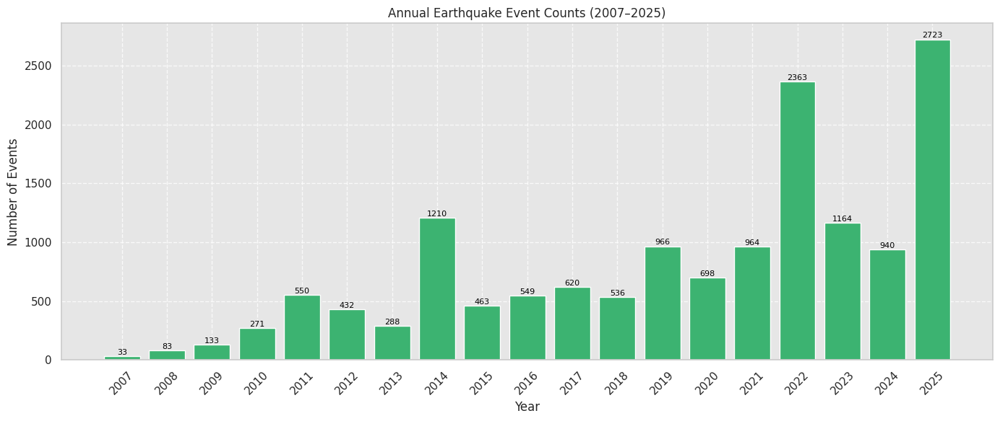

In [ ]:
# คำนวณค่า MAG เฉลี่ยและสูงสุดต่อปี
mag_mean_by_year = df.groupby(df['year'].astype(int))['mag'].mean()
mag_max_by_year = df.groupby(df['year'].astype(int))['mag'].max()

# เตรียมข้อมูล
year_counts = df['year'].astype(int).value_counts().sort_index()
years = mag_mean_by_year.index.astype(str)
counts = year_counts.values

# สร้าง Figure และ Axes
fig, ax = plt.subplots(figsize=(14, 6))

# พล็อตกราฟแท่ง
bars = ax.bar(years, counts, color='mediumseagreen')

# พื้นหลังสีเทาอ่อน
ax.set_facecolor('#e6e6e6')

# เพิ่มตัวเลขบนยอดแท่ง
for bar in bars:
    height = bar.get_height()
    ax.text(
        bar.get_x() + bar.get_width() / 2,
        height + 0.5,                      # ขยับขึ้นเล็กน้อย
        f'{int(height)}',                  # แสดงเป็นจำนวนเต็ม
        ha='center', va='bottom',
        fontsize=8, color='black'
    )

# ปรับแต่งเพิ่มเติม
ax.set_title('Annual Earthquake Event Counts (2007–2025)')
ax.set_xlabel('Year')
ax.set_ylabel('Number of Events')
ax.tick_params(axis='x', rotation=45)
ax.grid(True, color='white', linestyle='--', linewidth=1, axis='both', alpha=0.8)

plt.tight_layout()
plt.show()


### == Top 10 Countries by Earthquake Frequency (2007–2025) ==

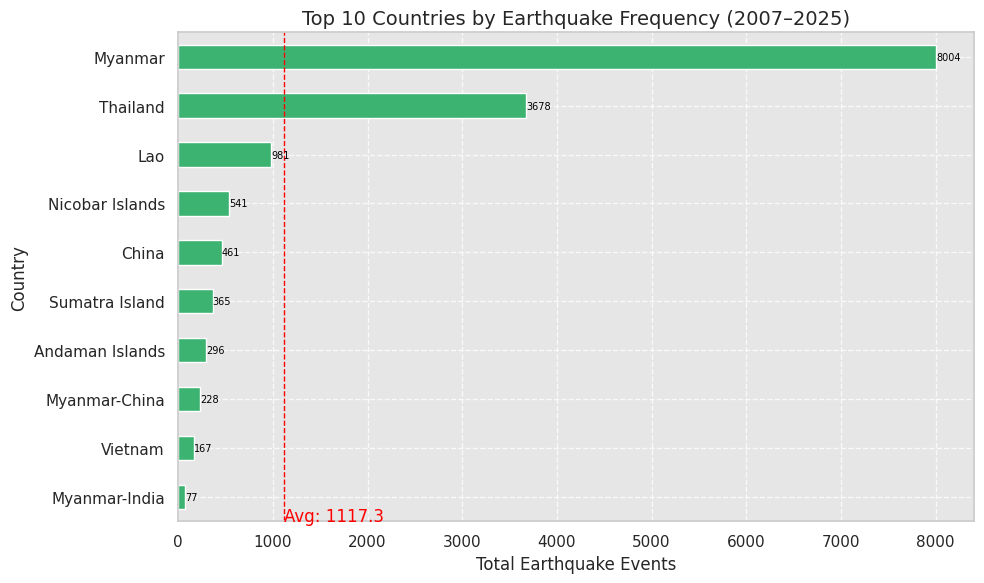

In [ ]:
# แปลง YEAR เป็นตัวเลข แล้วกรองค่า missing
df['year'] = pd.to_numeric(df['year'], errors='coerce')
df = df.dropna(subset=['year', 'country'])

# Filter

# กรองเฉพาะประเทศที่ไม่ใช่ไทย
df_foreign = df[df['country'].str.strip().str.lower() != 'thailand']

# นับจำนวนเหตุการณ์ต่อประเทศ
country_counts = df_foreign['country'].value_counts().nlargest(10).sort_values()


# เส้นค่าเฉลี่ย
mean_value = country_counts.mean()

# นับจำนวนเหตุการณ์ต่อประเทศ
country_counts = df['country'].value_counts().nlargest(10).sort_values()

# ใช้สีเดียวกันทั้งหมด
colors = ['mediumseagreen'] * len(country_counts)

# สร้างกราฟด้วย plt.subplots() เพื่อควบคุมพื้นหลัง
fig, ax = plt.subplots(figsize=(10, 6))

country_counts.plot(kind='barh', color=colors, ax=ax)

# ตั้งค่าพื้นหลังสีเทาอ่อน
ax.set_facecolor('#e6e6e6')  # สีเทาอ่อนแบบในภาพก่อนหน้า

# ตัวเลข
for i, (country, count) in enumerate(country_counts.items()):
    ax.text(count + 1, i, str(count), va='center', fontsize=7, color='black')


# ปรับข้อความและกริด
ax.set_title('Top 10 Countries by Earthquake Frequency (2007–2025)', fontsize=14)
ax.set_xlabel('Total Earthquake Events')
ax.set_ylabel('Country')
ax.grid(True, color='white', linestyle='--', linewidth=1, axis='both', alpha=0.8)

ax.axvline(mean_value, color='red', linestyle='--', linewidth=1)
ax.text(mean_value + 1, -0.5, f'Avg: {mean_value:.1f}', color='red')


plt.tight_layout()
plt.show()

### == Individual Earthquake Magnitudes per Year (2007–2025) ==

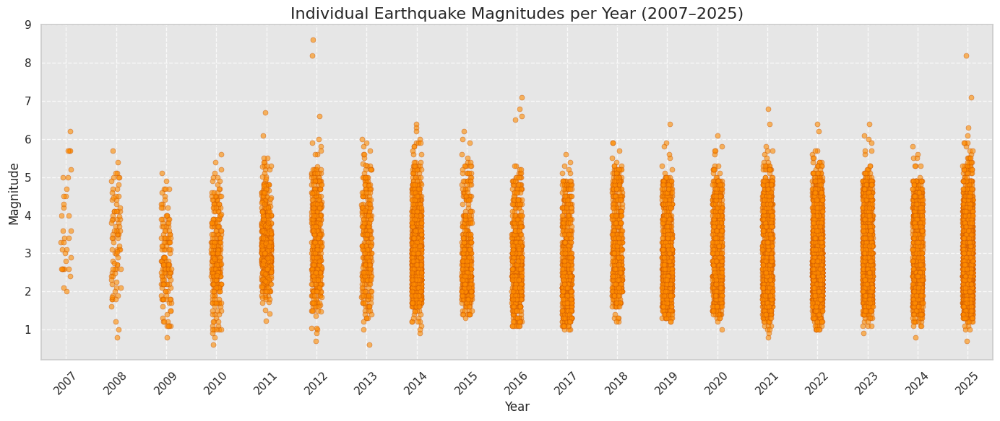

In [ ]:
## ปรับ ปี เป็น INT
df['year'] = df['year'].astype(int)

# สร้างกราฟด้วย plt.subplots()
fig, ax = plt.subplots(figsize=(14, 6))

# พล็อต Strip Plot ลงใน ax
sns.stripplot(
    data=df,
    x='year',
    y='mag',
    alpha=0.6,
    jitter=True,
    color='darkorange',
    edgecolor='#cc5500',
    linewidth=0.5,
    ax=ax
)

# ปรับพื้นหลังให้คล้ายภาพตัวอย่าง
ax.set_facecolor('#e6e6e6')  # สีเทาอ่อน
ax.grid(True, color='white', linestyle='--', linewidth=1, axis='both', alpha=0.8)

# ปรับแกนและข้อความ
ax.set_title('Individual Earthquake Magnitudes per Year (2007–2025)', fontsize=16)
ax.set_xlabel('Year')
ax.set_ylabel('Magnitude')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45)

plt.tight_layout()
plt.show()


### == Annual Mean and Maximum Earthquake Magnitudes (2007–2025) ==

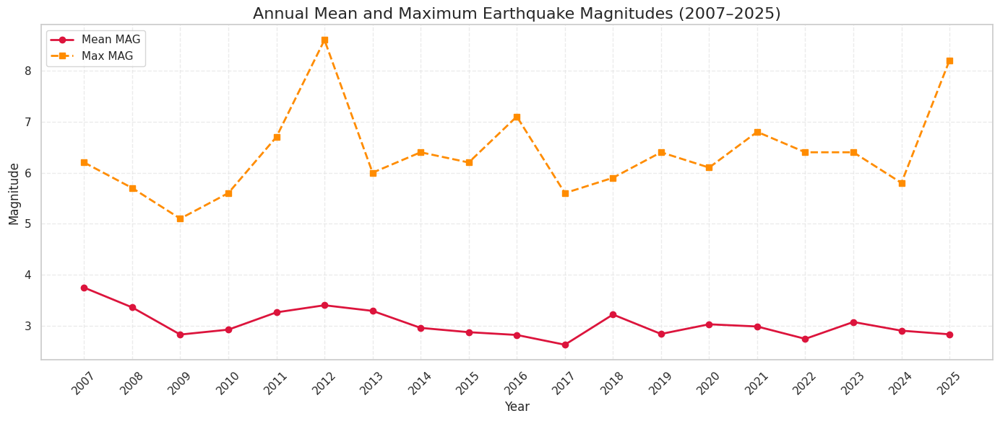

In [ ]:
# คำนวณค่า MAG เฉลี่ยและสูงสุดต่อปี
mag_mean_by_year = df.groupby(df['year'].astype(int))['mag'].mean()
mag_max_by_year = df.groupby(df['year'].astype(int))['mag'].max()

# เตรียมข้อมูล
years = mag_mean_by_year.index.astype(str)
mag_means = mag_mean_by_year.values
mag_maxs = mag_max_by_year.reindex(mag_mean_by_year.index).values

# สร้าง Figure และ Axes
fig, ax = plt.subplots(figsize=(14, 6))

# พื้นหลังสีเทาอ่อน
#ax.set_facecolor('#e6e6e6')

# พล็อตเส้นค่าเฉลี่ยและสูงสุด
ax.plot(years, mag_means, color='crimson', marker='o', linewidth=2, label='Mean MAG')
ax.plot(years, mag_maxs, color='darkorange', marker='s', linewidth=2, linestyle='--', label='Max MAG')

# ปรับแต่งแกนและกริด
ax.set_title('Annual Mean and Maximum Earthquake Magnitudes (2007–2025)', fontsize=16)
ax.set_xlabel('Year')
ax.set_ylabel('Magnitude')
ax.tick_params(axis='x', rotation=45)
ax.grid(True, color='#e6e6e6', linestyle='--', linewidth=1, axis='both', alpha=0.8)

# เพิ่ม legend
ax.legend(loc='upper left')

plt.tight_layout()
plt.show()


### == Maximum Earthquake Magnitude by Region and Year ==

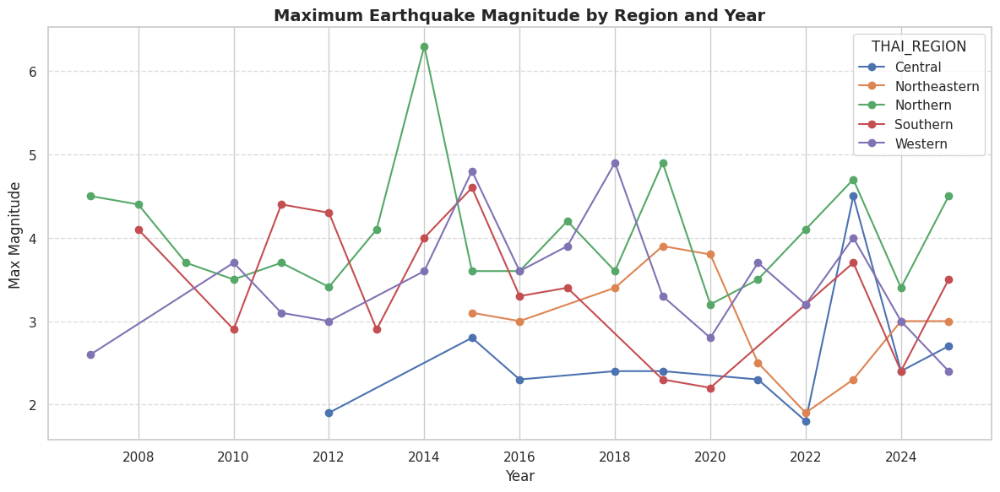

In [ ]:
fig, ax = plt.subplots(figsize=(12,6))
for region, data in df_grouped.groupby('region'):
    if pd.notna(region):
        data_plot = data.dropna(subset=['year','mag']).copy()
        data_plot['year'] = data_plot['year'].astype(int)
        ax.plot(data_plot['year'], data_plot['mag'], marker='o', linestyle='-', label=region)

ax.set_xlabel('Year', fontsize=12)
ax.set_ylabel('Max Magnitude', fontsize=12)
ax.set_title('Maximum Earthquake Magnitude by Region and Year', fontsize=14, fontweight='bold')
ax.legend(title='THAI_REGION')
ax.xaxis.set_major_locator(plt.MaxNLocator(integer=True))  # แกน x เป็น int
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


# PATH II : Earthquakes in Thailand

### Number of Earthquake Events by Province and per Year in Thailand (2007–2025)

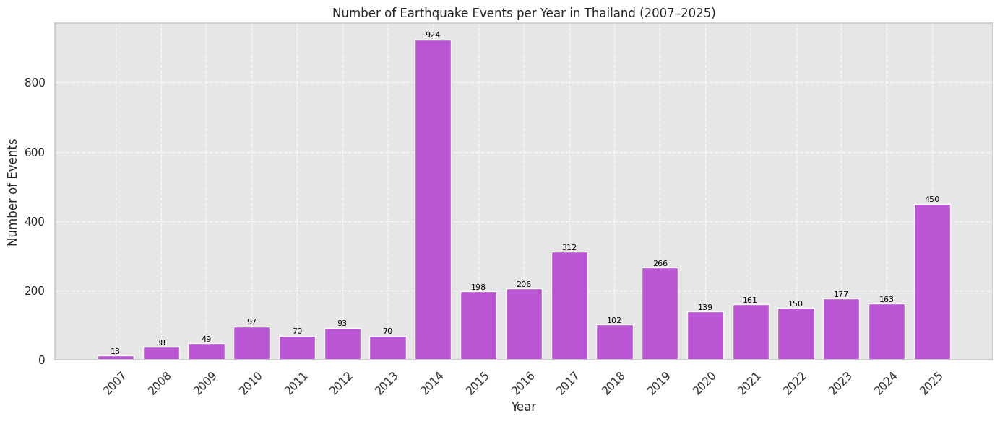

In [ ]:
# กรองข้อมูล Thailand และแปลงปีเป็น int
df_th = df[df['country'] == 'Thailand'].copy()
df_th['year'] = df_th['year'].astype(int)

# นับจำนวนเหตุการณ์ต่อปี
year_counts = df_th.groupby('year').size()
years = year_counts.index.astype(str)
counts = year_counts.values

# สร้าง Figure และ Axes
fig, ax = plt.subplots(figsize=(14, 6))

# กำหนดสีแท่ง
colors = ["mediumorchid"]
bars = ax.bar(years, counts, color=colors * (len(years)//2 + 1))

# พื้นหลังสีเทาอ่อน
ax.set_facecolor('#e6e6e6')

# เพิ่มตัวเลขบนยอดแท่ง
for bar in bars:
    height = bar.get_height()
    ax.text(
        bar.get_x() + bar.get_width() / 2,
        height + 0.5,
        f'{int(height)}',
        ha='center', va='bottom',
        fontsize=8, color='black'
    )

# ปรับแต่งเพิ่มเติม
ax.set_title('Number of Earthquake Events per Year in Thailand (2007–2025)')
ax.set_xlabel('Year')
ax.set_ylabel('Number of Events')
ax.tick_params(axis='x', rotation=45)
ax.grid(True, color='white', linestyle='--', linewidth=1, axis='both', alpha=0.8)

plt.tight_layout()
plt.show()


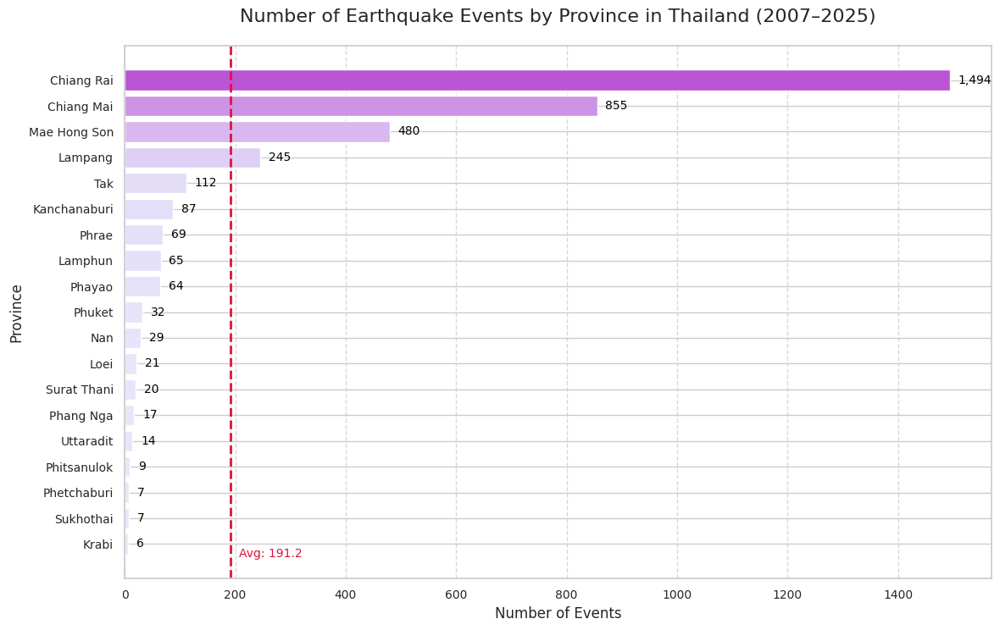

In [ ]:
# เตรียมข้อมูล
province_counts = df[df['country'] == 'Thailand']['province'].value_counts()
province_counts = province_counts[province_counts > 5].sort_values(ascending=True)

# สร้าง colormap ไล่เฉดสีจากม่วงอ่อนถึง mediumorchid
custom_cmap = mcolors.LinearSegmentedColormap.from_list("orchid_gradient", ["lavender", "mediumorchid"])

# Normalize ค่าจำนวนเหตุการณ์เพื่อใช้กับ colormap
norm = plt.Normalize(province_counts.min(), province_counts.max())
colors = custom_cmap(norm(province_counts.values))

# ปรับขนาดกราฟตามจำนวนจังหวัด
height = 0.4 * len(province_counts)
fig, ax = plt.subplots(figsize=(12, height))

# พล็อตกราฟแท่งแนวนอน
bars = ax.barh(province_counts.index, province_counts.values, color=colors)

# เพิ่มตัวเลขที่ปลายแท่ง
for bar in bars:
    width = bar.get_width()
    ax.text(width + province_counts.max()*0.01, bar.get_y() + bar.get_height() / 2,
            f'{int(width):,}',
            va='center', ha='left',
            fontsize=10, color='black')

# เพิ่มเส้นแดงแนวตั้งแสดงค่าเฉลี่ย
mean_value = province_counts.mean()
ax.axvline(mean_value, color='crimson', linestyle='--', linewidth=2)
ax.text(mean_value + province_counts.max()*0.01, -0.5,
        f'Avg: {mean_value:.1f}', color='crimson', fontsize=10)

# ปรับพื้นหลังและกริด
ax.set_facecolor('white')
ax.grid(True, axis='x', linestyle='--', color='gray', alpha=0.3)

# ปรับแกนและข้อความ
ax.set_title('Number of Earthquake Events by Province in Thailand (2007–2025)', fontsize=16, pad=20)
ax.set_xlabel('Number of Events')
ax.set_ylabel('Province')
ax.tick_params(axis='x', labelsize=10)
ax.tick_params(axis='y', labelsize=10)

plt.tight_layout()
plt.show()

### Individual Earthquake Magnitudes per Year in Thailand (2007–2025)

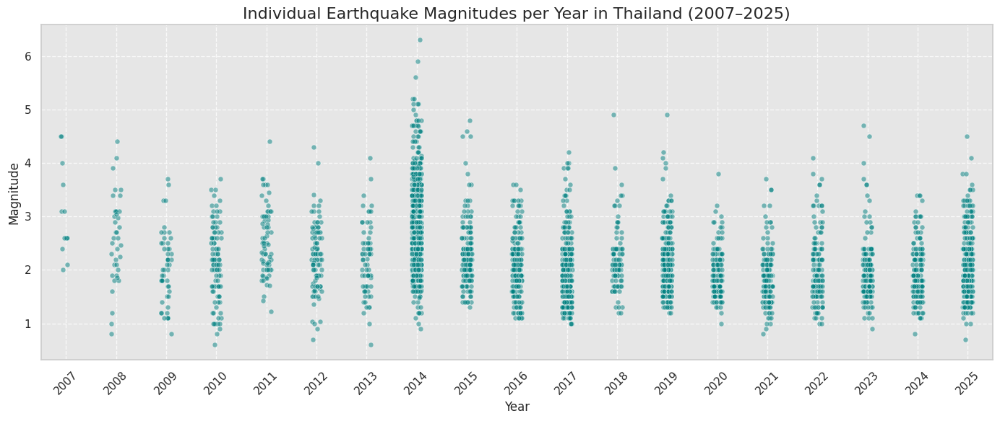

In [ ]:
# กรองเฉพาะประเทศไทย
df_thai = df[df['country'] == 'Thailand'].copy()

# แปลง YEAR เป็นตัวเลขจำนวนเต็ม แล้วกรองค่า missing
df_thai['year'] = pd.to_numeric(df_thai['year'], errors='coerce').astype('Int64')
df_thai = df_thai.dropna(subset=['year', 'mag'])

# สร้าง Figure และ Axes
fig, ax = plt.subplots(figsize=(14, 6))

# พล็อต Strip Plot
sns.stripplot(
    data=df_thai,
    x='year',
    y='mag',
    alpha=0.5,
    jitter=True,
    color='teal',
    edgecolor='white',
    linewidth=0.5,
    ax=ax
)

# ปรับพื้นหลังและกริด
ax.set_facecolor('#e6e6e6')
ax.grid(True, color='white', linestyle='--', linewidth=1, axis='both', alpha=0.8)

# ปรับแกนและข้อความ
ax.set_title('Individual Earthquake Magnitudes per Year in Thailand (2007–2025)', fontsize=16)
ax.set_xlabel('Year')
ax.set_ylabel('Magnitude')
ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

### Number of Earthquake Events by Region in Thailand (2007–2025)

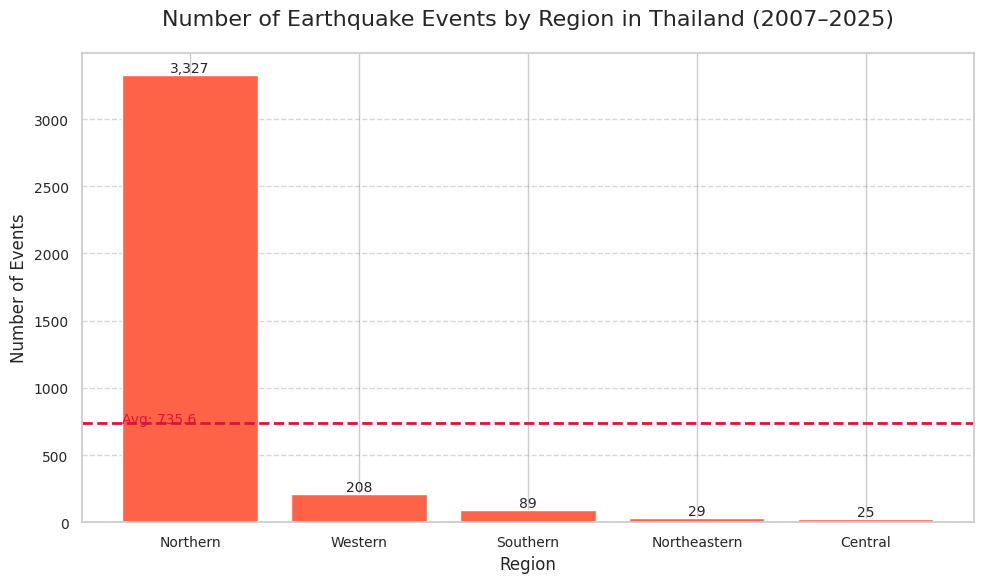

In [ ]:
fig, ax = plt.subplots(figsize=(10, 6))
bars = ax.bar(region_counts.index, region_counts.values, color='tomato')

# เพิ่มตัวเลขบนยอดแท่ง
for bar in bars:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2, height + 1,
            f'{int(height):,}', ha='center', va='bottom', fontsize=10)

# เส้นเฉลี่ยแนวนอน
mean_value = region_counts.mean()
ax.axhline(mean_value, color='crimson', linestyle='--', linewidth=2)
ax.text(-0.4, mean_value + 1, f'Avg: {mean_value:.1f}', color='crimson', fontsize=10)

# ปรับพื้นหลังและกริด
ax.set_facecolor('white')
ax.grid(True, axis='y', linestyle='--', color='gray', alpha=0.3)

# ปรับข้อความ
ax.set_title('Number of Earthquake Events by Region in Thailand (2007–2025)', fontsize=16, pad=20)
ax.set_xlabel('Region')
ax.set_ylabel('Number of Events')
ax.tick_params(axis='x', labelsize=10)
ax.tick_params(axis='y', labelsize=10)

plt.tight_layout()
plt.show()

### Number of Earthquake Events by Province in Northern Thailand (2007–2025)

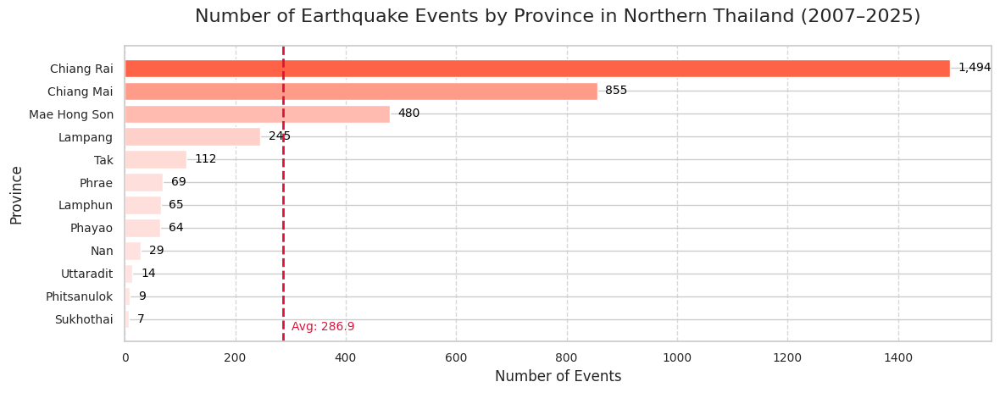

In [ ]:
# รายชื่อจังหวัดในภาคเหนือ
northern_provinces = [
    'Chiang Rai', 'Chiang Mai', 'Lampang', 'Lamphun', 'Phayao', 'Phrae', 'Nan',
    'Mae Hong Son', 'Tak', 'Uttaradit', 'Sukhothai', 'Kamphaeng Phet', 'Phitsanulok',
    'Phichit', 'Nakhon Sawan', 'Phetchabun'
]

# กรองข้อมูลเฉพาะจังหวัดในภาคเหนือ
province_counts = df[df['country'] == 'Thailand']['province'].value_counts()
province_counts = province_counts[province_counts.index.isin(northern_provinces)]
province_counts = province_counts[province_counts > 5].sort_values(ascending=True)

# สร้าง colormap ไล่เฉดสีจากชมพูอ่อนถึง tomato
custom_cmap = mcolors.LinearSegmentedColormap.from_list("tomato_gradient", ["mistyrose", "tomato"])
norm = plt.Normalize(province_counts.min(), province_counts.max())
colors = custom_cmap(norm(province_counts.values))

# ปรับขนาดกราฟตามจำนวนจังหวัด
height = 0.4 * len(province_counts)
fig, ax = plt.subplots(figsize=(12, height))

# พล็อตกราฟแท่งแนวนอน
bars = ax.barh(province_counts.index, province_counts.values, color=colors)

# เพิ่มตัวเลขที่ปลายแท่ง
for bar in bars:
    width = bar.get_width()
    ax.text(width + province_counts.max()*0.01, bar.get_y() + bar.get_height() / 2,
            f'{int(width):,}',
            va='center', ha='left',
            fontsize=10, color='black')

# เพิ่มเส้นเฉลี่ยแนวตั้ง
mean_value = province_counts.mean()
ax.axvline(mean_value, color='crimson', linestyle='--', linewidth=2)
ax.text(mean_value + province_counts.max()*0.01, -0.5,
        f'Avg: {mean_value:.1f}', color='crimson', fontsize=10)

# ปรับพื้นหลังและกริด
ax.set_facecolor('white')
ax.grid(True, axis='x', linestyle='--', color='gray', alpha=0.3)

# ปรับแกนและข้อความ
ax.set_title('Number of Earthquake Events by Province in Northern Thailand (2007–2025)', fontsize=16, pad=20)
ax.set_xlabel('Number of Events')
ax.set_ylabel('Province')
ax.tick_params(axis='x', labelsize=10)
ax.tick_params(axis='y', labelsize=10)

plt.tight_layout()
plt.show()

### Overall Magnitude by range VS Areas around Thailand

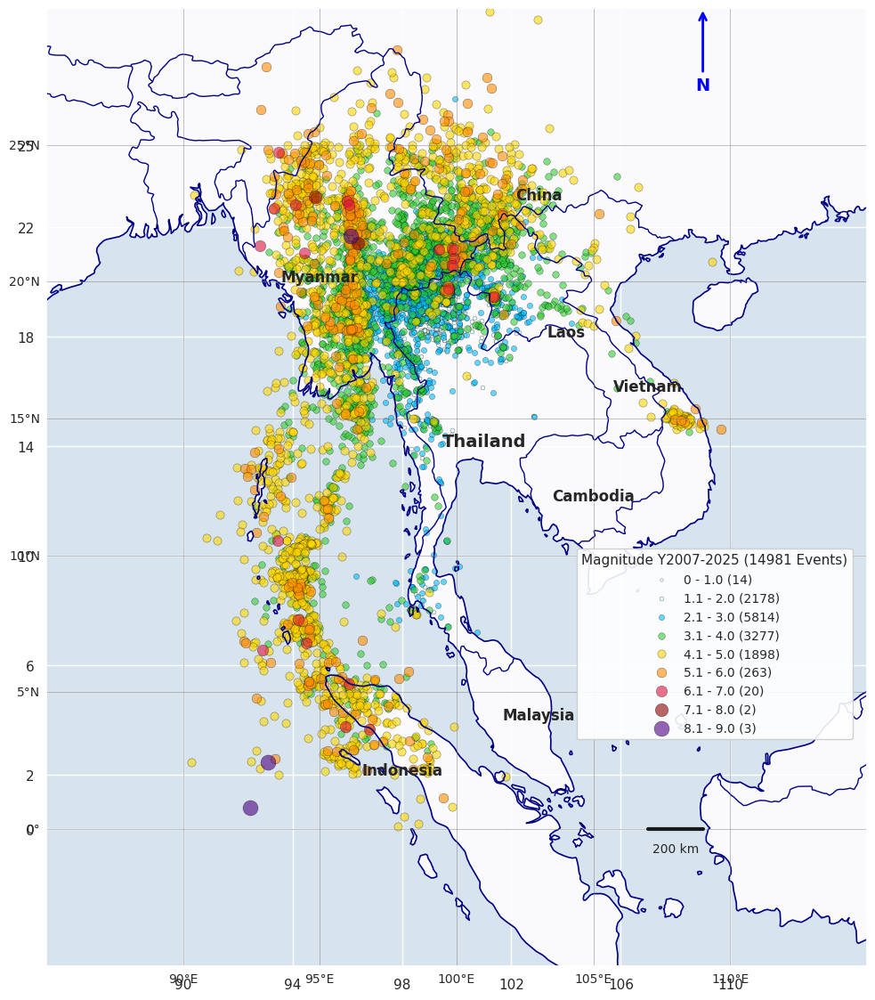

# Local : Earthquake in Thailand and nearby
## <font color=Green>ที่มา : กองเฝ้าระวังแผ่นดินไหว (https://earthquake.tmd.go.th)</font>



In [ ]:
# Plot : Overall Magnitude by range VS Areas around Thailand

# Load data EQ
df = df_eq.copy()

# Pick : lat, long and magnitude
lat_all = df["lat"].values
lon_all = df["long"].values
mag_all = df["mag"].values

# Frame position in Map (SEA region)
mask = (lat_all >= 0) & (lat_all <= 30) & (lon_all >= 90) & (lon_all <= 115)
lat_filtered = lat_all[mask]
lon_filtered = lon_all[mask]
mag_filtered = mag_all[mask]

# Create Map
fig = plt.figure(figsize=(10, 15))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax.set_extent([85, 115, -5, 30], crs=ccrs.PlateCarree())

# Add Geo features
ax.add_feature(cfeature.COASTLINE, linewidth=1.2, color='navy')
ax.add_feature(cfeature.BORDERS, linewidth=1.0, color='navy')
ax.add_feature(cfeature.LAND, color='white', alpha=0.8)
ax.add_feature(cfeature.OCEAN, color='lightblue', alpha=0.3)

# Create colormap and size mapping
colors_map = {
    (0, 1.0):   ('white', 3),           # ขาว
    (1.1, 2.0): ('lightcyan', 6),       # ฟ้าอ่อนมาก
    (2.1, 3.0): ('deepskyblue', 10),    # ฟ้า
    (3.1, 4.0): ('limegreen', 15),      # เขียว
    (4.1, 5.0): ('gold', 22),           # ทอง
    (5.1, 6.0): ('darkorange', 30),     # ส้มเข้ม
    (6.1, 7.0): ('crimson', 40),        # แดงเข้ม
    (7.1, 8.0): ('darkred', 55),        # แดงเข้มมาก
    (8.1, 9.0): ('indigo', 75)          # น้ำเงินเข้ม
}

# Put EQ Mag in each lat and long
for (min_mag, max_mag), (color, size) in colors_map.items():
    mask_mag = (mag_filtered >= min_mag) & (mag_filtered < max_mag)
    if np.any(mask_mag):
        count = np.sum(mask_mag)
        ax.scatter(lon_filtered[mask_mag], lat_filtered[mask_mag],
                   c=color, s=size*2, alpha=0.6,
                   edgecolor='black', linewidth=0.3,
                   transform=ccrs.PlateCarree(),
                   label=f'{min_mag} - {max_mag} ({count})')

# Gridlines
gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.7)
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 10}
gl.ylabel_style = {'size': 10}
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
ax.set_xticks([90, 94, 98, 102, 106, 110], crs=ccrs.PlateCarree())
ax.set_yticks([0, 2, 6, 10, 14, 18, 22, 25], crs=ccrs.PlateCarree())

# Label Country
ax.text(95, 20, 'Myanmar', fontsize=12, ha='center', fontweight='bold')
ax.text(103, 23, 'China', fontsize=12, ha='center', fontweight='bold')
ax.text(104, 18, 'Laos', fontsize=12, ha='center', fontweight='bold')
ax.text(101, 14, 'Thailand', fontsize=14, ha='center', fontweight='bold')
ax.text(107, 16, 'Vietnam', fontsize=12, ha='center', fontweight='bold')
ax.text(105, 12, 'Cambodia', fontsize=12, ha='center', fontweight='bold')
ax.text(103, 4, 'Malaysia', fontsize=12, ha='center', fontweight='bold')
ax.text(98, 2, 'Indonesia', fontsize=12, ha='center', fontweight='bold')

# Legend
legend = ax.legend(title=f'Magnitude Y2007-2025 ({len(mag_filtered)} Events)',
                   loc='lower right', fontsize=10, title_fontsize=11,
                   bbox_to_anchor=(0.99, 0.23))
legend.get_frame().set_facecolor('white')
legend.get_frame().set_alpha(0.9)

# Scale bar
scale_lon = 107
scale_lat = 0
ax.plot([scale_lon, scale_lon+2], [scale_lat, scale_lat], 'k-', lw=3,
        transform=ccrs.PlateCarree())
ax.text(scale_lon+1, scale_lat-0.5, '200 km',
        ha='center', va='top', fontsize=10,
        transform=ccrs.PlateCarree())

# North arrow
ax.annotate('N', xy=(109, 30), xytext=(109, 27),
            arrowprops=dict(arrowstyle='->', lw=2, color ='blue'),
            fontsize=14, ha='center', fontweight='bold', color ='blue',
            transform=ccrs.PlateCarree())

plt.tight_layout()
plt.show()

s = """# Local : Earthquake in Thailand and nearby
## <font color=Green>ที่มา : กองเฝ้าระวังแผ่นดินไหว (https://earthquake.tmd.go.th)</font>

"""

warnings.filterwarnings("ignore", category=UserWarning)

display( Markdown(s) )

### Overall Magnitude by range VS Areas around Thailand

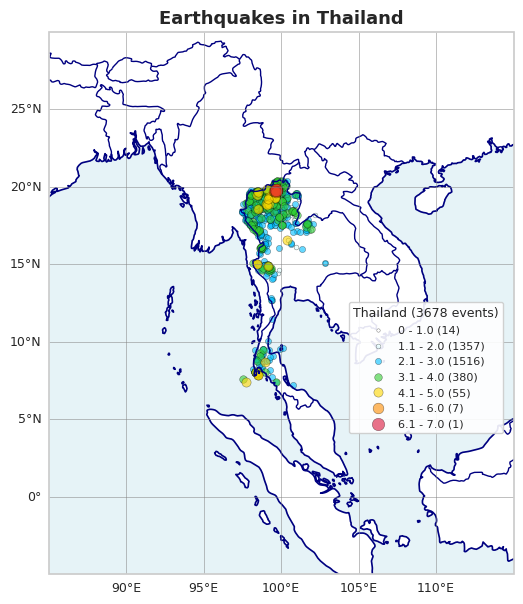

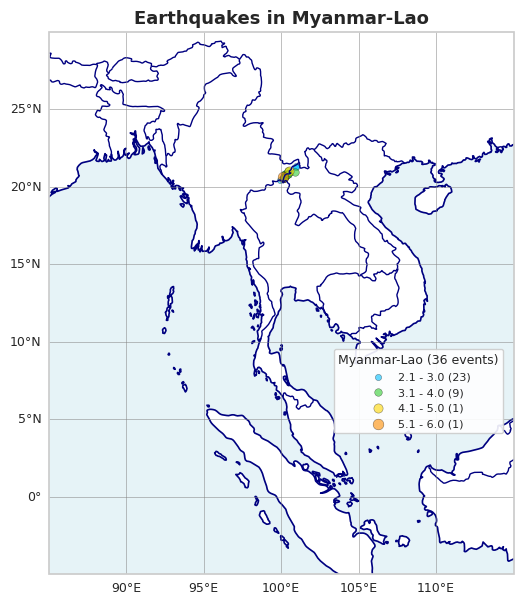

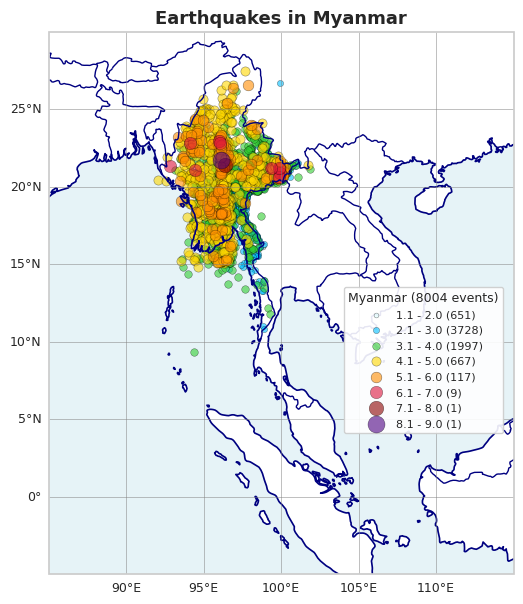

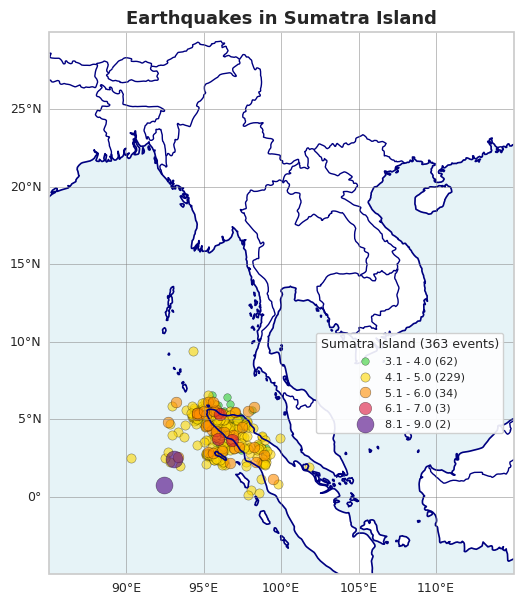

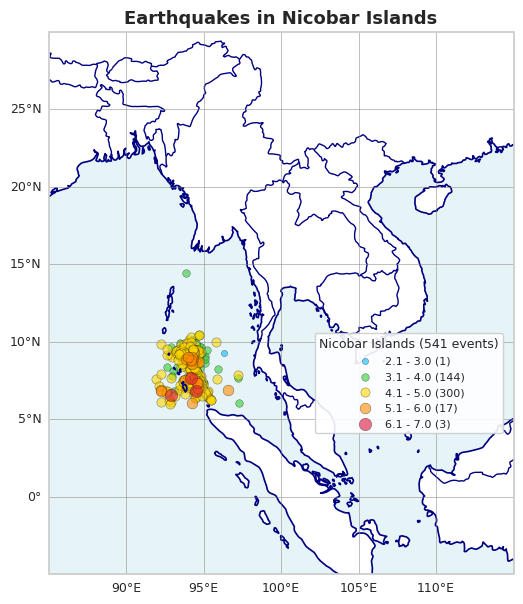

...

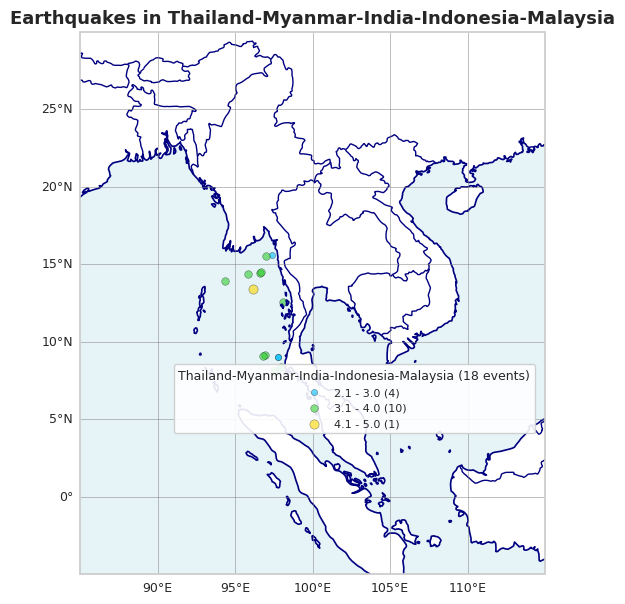

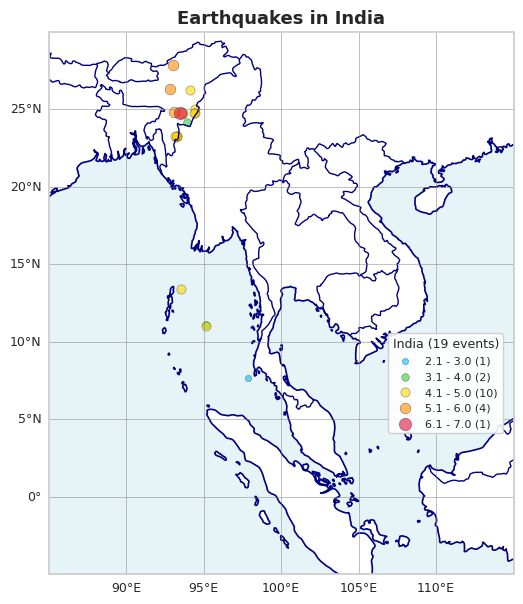

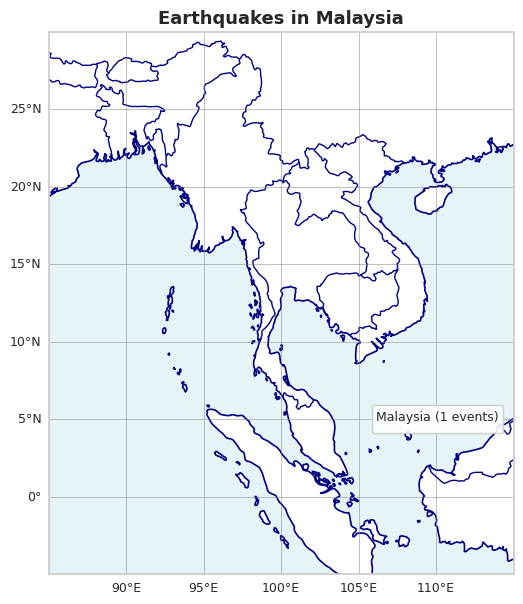

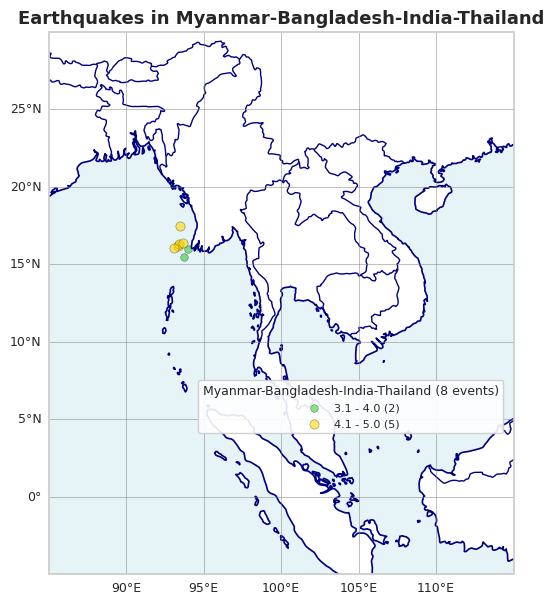

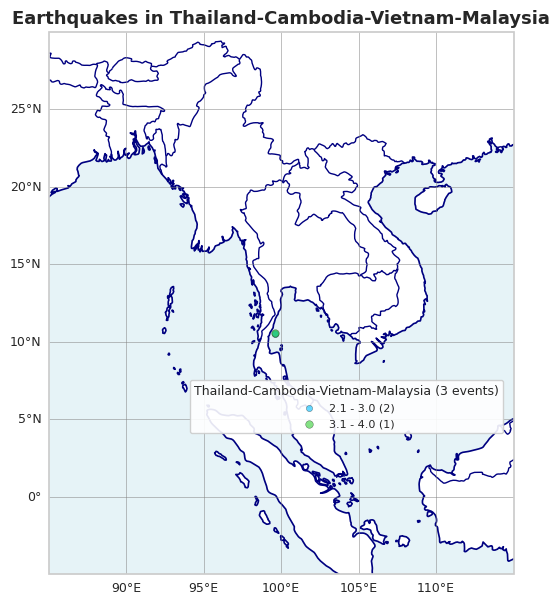

In [ ]:
# Plot : Overall Magnitude by Country VS Areas around Thailand

df = df_eq.copy()
#df.info()

# === Drop NaN in Country ===
df = df_eq.dropna(subset=["country"])

# === Function plot per Country ===
def plot_country(country_name, df_country):
    lat_all = df_country["lat"].values
    lon_all = df_country["long"].values
    mag_all = df_country["mag"].values

    # Filter in SEA
    mask = (lat_all >= 0) & (lat_all <= 30) & (lon_all >= 90) & (lon_all <= 115)
    lat_filtered = lat_all[mask]
    lon_filtered = lon_all[mask]
    mag_filtered = mag_all[mask]

    # Create Map
    fig = plt.figure(figsize=(6, 8))
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
    #ax.set_extent([95, 110, 0, 25], crs=ccrs.PlateCarree())

    ax.set_extent([85, 115, -5, 30], crs=ccrs.PlateCarree())

    # Add Geo features
    ax.add_feature(cfeature.COASTLINE, linewidth=1.2, color='navy')
    ax.add_feature(cfeature.BORDERS, linewidth=1.0, color='navy')
    ax.add_feature(cfeature.LAND, color='white', alpha=0.8)
    ax.add_feature(cfeature.OCEAN, color='lightblue', alpha=0.3)

    # Colormap magnitude
    colors_map = {
        (0, 1.0):   ('white', 3),
        (1.1, 2.0): ('lightcyan', 6),
        (2.1, 3.0): ('deepskyblue', 10),
        (3.1, 4.0): ('limegreen', 15),
        (4.1, 5.0): ('gold', 22),
        (5.1, 6.0): ('darkorange', 30),
        (6.1, 7.0): ('crimson', 40),
        (7.1, 8.0): ('darkred', 55),
        (8.1, 9.0): ('indigo', 75)
    }

    # Scatter points
    for (min_mag, max_mag), (color, size) in colors_map.items():
        mask_mag = (mag_filtered >= min_mag) & (mag_filtered < max_mag)
        #print( len(mag_filtered))
        if np.any(mask_mag):
            count = np.sum(mask_mag)
            ax.scatter(lon_filtered[mask_mag], lat_filtered[mask_mag],
                       c=color, s=size*2, alpha=0.6,
                       edgecolor='black', linewidth=0.3,
                       transform=ccrs.PlateCarree(),
                       label=f'{min_mag} - {max_mag} ({count})')

    # Gridlines
    gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.7)
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 9}
    gl.ylabel_style = {'size': 9}
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER

    # Legend
    legend = ax.legend(title=f'{country_name} ({len(mag_filtered)} events)',
                       loc='lower right', fontsize=8, title_fontsize=9,
                       bbox_to_anchor=(0.99, 0.25))
    legend.get_frame().set_facecolor('white')
    legend.get_frame().set_alpha(0.9)

    ax.set_title(f"Earthquakes in {country_name}", fontsize=13, fontweight='bold')
    plt.show()


# === Loop plot per country ===
countries = df["country"].unique()

for country in countries:
    df_country = df[df["country"] == country]
    plot_country(country, df_country)


### Diff Detail Regions : North, East, West, South, Central  in Thailand

/usr/local/lib/python3.12/dist-packages/cartopy/io/__init__.py:242: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/10m_physical/ne_10m_land.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/usr/local/lib/python3.12/dist-packages/cartopy/io/__init__.py:242: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/10m_physical/ne_10m_ocean.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


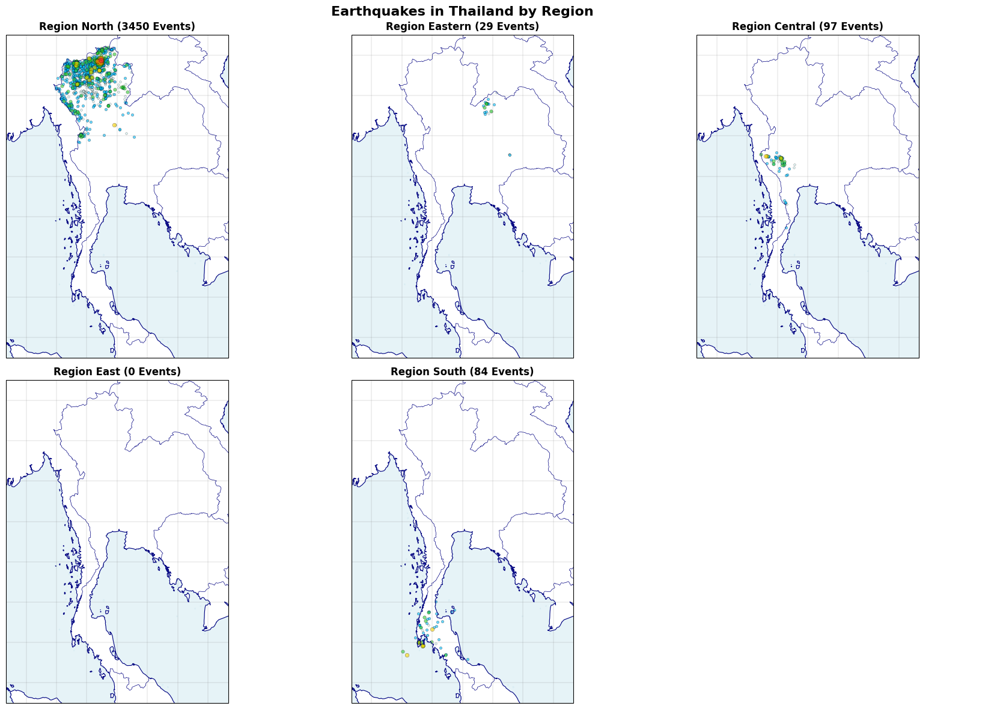

In [ ]:
# Plot : By region --> Issue NO events


import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import pandas as pd
import numpy as np

# -------------------------------
# 1. Load data
# -------------------------------
df = df_eq.copy()
#df = df_eq
# -------------------------------
# 2. Mapping จังหวัด → ภูมิภาค
# -------------------------------
'''
region_map = {
    "เหนือ": ["เชียงใหม่","เชียงราย","ลำพูน","ลำปาง","แพร่","น่าน","พะเยา","แม่ฮ่องสอน","ตาก","อุตรดิตถ์","พิษณุโลก","สุโขทัย","เพชรบูรณ์","กำแพงเพชร","พิจิตร"],
    "อีสาน": ["เลย","หนองคาย","บึงกาฬ","นครพนม","สกลนคร","อุดรธานี","หนองบัวลำภู","ขอนแก่น","มหาสารคาม","ร้อยเอ็ด","กาฬสินธุ์","มุกดาหาร","ยโสธร","อำนาจเจริญ","นครราชสีมา","บุรีรัมย์","สุรินทร์","ศรีสะเกษ","อุบลราชธานี","ชัยภูมิ"],
    "กลาง": ["กรุงเทพมหานคร","นนทบุรี","ปทุมธานี","สมุทรปราการ","พระนครศรีอยุธยา","สระบุรี","ลพบุรี","อ่างทอง","ชัยนาท","นครสวรรค์","สิงห์บุรี","อุทัยธานี","กาญจนบุรี","สุพรรณบุรี","ราชบุรี","สมุทรสาคร","สมุทรสงคราม","นครปฐม","เพชรบุรี","ประจวบคีรีขันธ์"],
    "ตะวันออก": ["ชลบุรี","ระยอง","จันทบุรี","ตราด","ปราจีนบุรี","สระแก้ว","นครนายก"],
    "ใต้": ["ชุมพร","ระนอง","สุราษฎร์ธานี","นครศรีธรรมราช","พังงา","ภูเก็ต","กระบี่","ตรัง","พัทลุง","สงขลา","สตูล","ปัตตานี","ยะลา","นราธิวาส"]
}

'''

region_map = {
    "North": [
        "Chiang Mai","Chiang Rai","Lamphun","Lampang","Phrae","Nan","Phayao",
        "Mae Hong Son","Tak","Uttaradit","Phitsanulok","Sukhothai","Phetchabun",
        "Kamphaeng Phet","Phichit"
    ],
    "Eastern": [
        "Loei","Nong Khai","Bueng Kan","Nakhon Phanom","Sakon Nakhon","Udon Thani",
        "Nong Bua Lam Phu","Khon Kaen","Maha Sarakham","Roi Et","Kalasin","Mukdahan",
        "Yasothon","Amnat Charoen","Nakhon Ratchasima","Buri Ram","Surin",
        "Si Sa Ket","Ubon Ratchathani","Chaiyaphum"
    ],
    "Central": [
        "Bangkok","Nonthaburi","Pathum Thani","Samut Prakan","Phra Nakhon Si Ayutthaya",
        "Saraburi","Lopburi","Ang Thong","Chai Nat","Nakhon Sawan","Sing Buri",
        "Uthai Thani","Kanchanaburi","Suphan Buri","Ratchaburi","Samut Sakhon",
        "Samut Songkhram","Nakhon Pathom","Phetchaburi","Prachuap Khiri Khan"
    ],
    "East": [
        "Chon Buri","Rayong","Chanthaburi","Trat","Prachin Buri","Sa Kaeo","Nakhon Nayok"
    ],
    "South": [
        "Chumphon","Ranong","Surat Thani","Nakhon Si Thammarat","Phang Nga","Phuket",
        "Krabi","Trang","Phatthalung","Songkhla","Satun","Pattani","Yala","Narathiwat"
    ]
}





# -------------------------------
# 3. Color map for magnitude
# -------------------------------
colors_map = {
    (0, 1.0):   ('white', 3),
    (1.1, 2.0): ('lightcyan', 6),
    (2.1, 3.0): ('deepskyblue', 10),
    (3.1, 4.0): ('limegreen', 15),
    (4.1, 5.0): ('gold', 22),
    (5.1, 6.0): ('darkorange', 30),
    (6.1, 7.0): ('crimson', 40),
    (7.1, 8.0): ('darkred', 55),
    (8.1, 9.0): ('indigo', 75)
}

# -------------------------------
# 4. Plot แยก 5 ภูมิภาค
# -------------------------------
fig, axes = plt.subplots(2, 3, figsize=(18, 12),
                         subplot_kw={'projection': ccrs.PlateCarree()})
axes = axes.flatten()

for i, (region, provinces) in enumerate(region_map.items()):
    ax = axes[i]

    # filter by จังหวัดใน region นี้
    df_r = df[df["province"].isin(provinces)]
    #df_r = df[df["province"].isin(region_map)]
    lat_all = df_r["lat"].values
    lon_all = df_r["long"].values
    mag_all = df_r["mag"].values

    # set extent
    ax.set_extent([95, 106, 5, 21], crs=ccrs.PlateCarree())

    # add geo features
    ax.add_feature(cfeature.COASTLINE, linewidth=0.8, color='navy')
    ax.add_feature(cfeature.BORDERS, linewidth=0.5, color='navy')
    ax.add_feature(cfeature.LAND, color='white', alpha=0.8)
    ax.add_feature(cfeature.OCEAN, color='lightblue', alpha=0.3)

    # plot scatter per magnitude range
    for (min_mag, max_mag), (color, size) in colors_map.items():
        mask_mag = (mag_all >= min_mag) & (mag_all < max_mag)
        if np.any(mask_mag):
            ax.scatter(lon_all[mask_mag], lat_all[mask_mag],
                       c=color, s=size, alpha=0.6,
                       edgecolor='black', linewidth=0.3,
                       transform=ccrs.PlateCarree())

    # gridlines
    gl = ax.gridlines(draw_labels=False, linewidth=0.3, color='gray', alpha=0.6)
    ax.set_title(f"Region {region} ({len(df_r)} Events)", fontsize=12, fontweight='bold')

# ปิด subplot ว่าง
axes[-1].axis('off')

plt.suptitle("Earthquakes in Thailand by Region", fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()


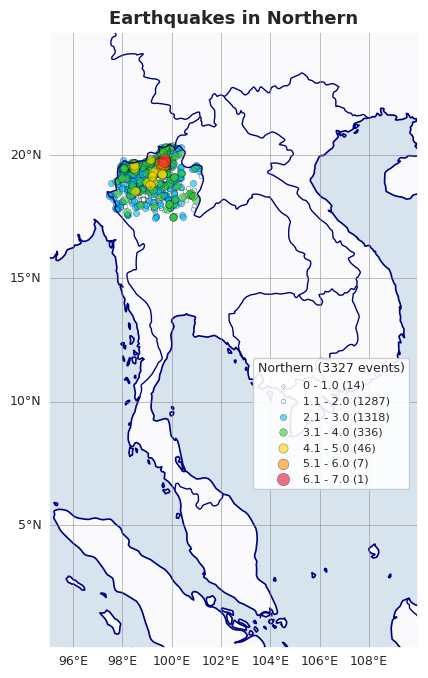

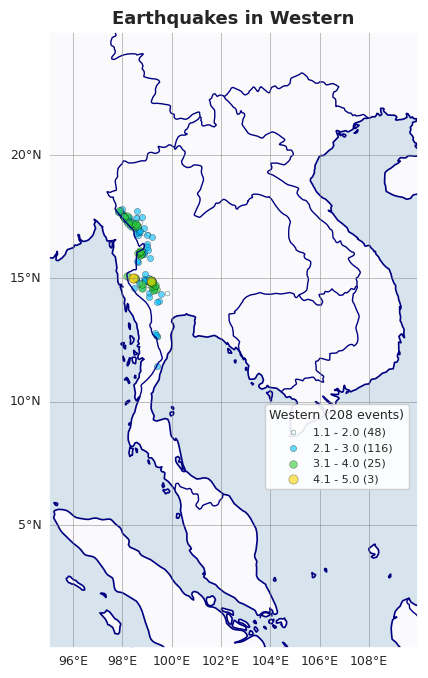

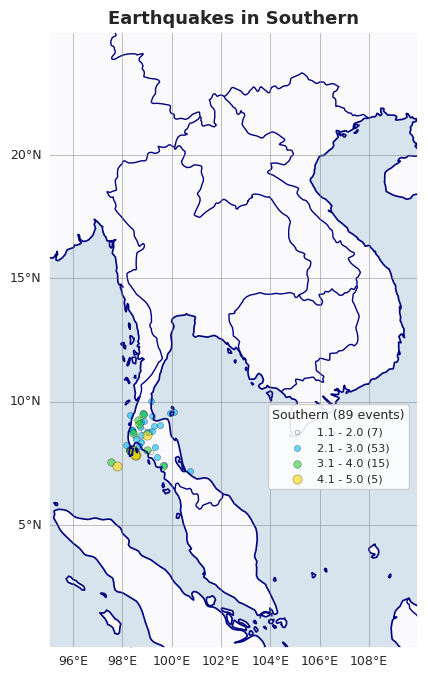

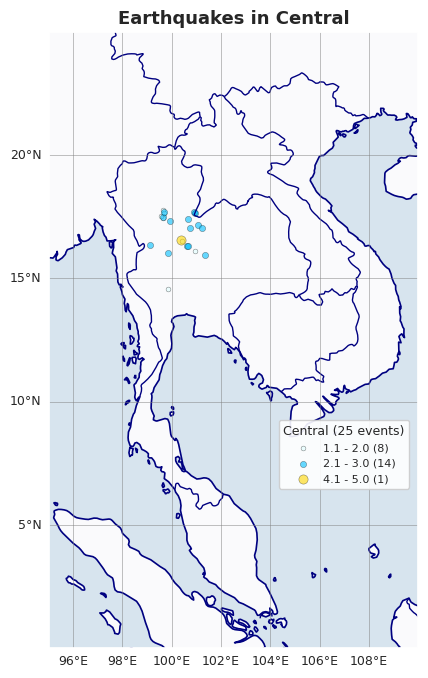

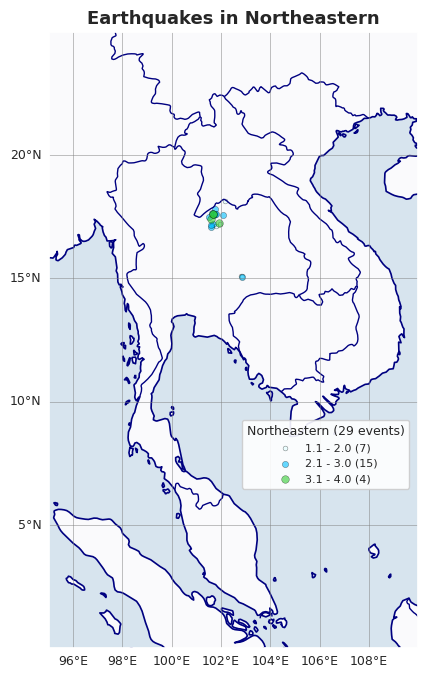

In [ ]:
# Plot by Regions : North, East, West, South, Central - DONE

import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import numpy as np


df = df_eq.copy()
# === Function plot per region ===
def plot_region(region_name, df_region):
    lat_all = df_region["lat"].values
    lon_all = df_region["long"].values
    mag_all = df_region["mag"].values

    # Filter in SEA
    mask = (lat_all >= 0) & (lat_all <= 30) & (lon_all >= 90) & (lon_all <= 115)
    lat_filtered = lat_all[mask]
    lon_filtered = lon_all[mask]
    mag_filtered = mag_all[mask]

    # Create Map
    #fig = plt.figure(figsize=(8, 10))
    fig = plt.figure(figsize=(6, 8))
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
    ax.set_extent([95, 110, 0, 25], crs=ccrs.PlateCarree())

    # Add Geo features
    ax.add_feature(cfeature.COASTLINE, linewidth=1.2, color='navy')
    ax.add_feature(cfeature.BORDERS, linewidth=1.0, color='navy')
    ax.add_feature(cfeature.LAND, color='white', alpha=0.8)
    ax.add_feature(cfeature.OCEAN, color='lightblue', alpha=0.3)

    # Colormap magnitude
    colors_map = {
        (0, 1.0):   ('white', 3),
        (1.1, 2.0): ('lightcyan', 6),
        (2.1, 3.0): ('deepskyblue', 10),
        (3.1, 4.0): ('limegreen', 15),
        (4.1, 5.0): ('gold', 22),
        (5.1, 6.0): ('darkorange', 30),
        (6.1, 7.0): ('crimson', 40),
        (7.1, 8.0): ('darkred', 55),
        (8.1, 9.0): ('indigo', 75)
    }

    # Scatter points
    for (min_mag, max_mag), (color, size) in colors_map.items():
        mask_mag = (mag_filtered >= min_mag) & (mag_filtered < max_mag)
        if np.any(mask_mag):
            count = np.sum(mask_mag)
            ax.scatter(lon_filtered[mask_mag], lat_filtered[mask_mag],
                       c=color, s=size*2, alpha=0.6,
                       edgecolor='black', linewidth=0.3,
                       transform=ccrs.PlateCarree(),
                       label=f'{min_mag} - {max_mag} ({count})')

    # Gridlines
    gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.7)
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 9}
    gl.ylabel_style = {'size': 9}
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER

    # Legend
    legend = ax.legend(title=f'{region_name} ({len(mag_filtered)} events)',
                       loc='lower right', fontsize=8, title_fontsize=9,
                       bbox_to_anchor=(0.99, 0.25))
    legend.get_frame().set_facecolor('white')
    legend.get_frame().set_alpha(0.9)

    ax.set_title(f"Earthquakes in {region_name}", fontsize=13, fontweight='bold')
    plt.show()

# === Drop NaN in Region ===
df_eq = df_eq.dropna(subset=["region"])


# === Loop plot per region ===
regions = df_eq["region"].unique()

for reg in regions:
    df_region = df_eq[df_eq["region"] == reg]
    plot_region(reg, df_region)


### Earthquake Distribution in Thailand by Region

=== การแบ่งข้อมูลตามภูมิภาค ===
region
North      3450
Central      97
South        84
Eastern      29
Unknown      18
Name: count, dtype: int64
จำนวนข้อมูลรวม: 3678

Region North: 3450 events
Region Eastern: 29 events
Region Central: 97 events
Region East: 0 events
Region South: 84 events


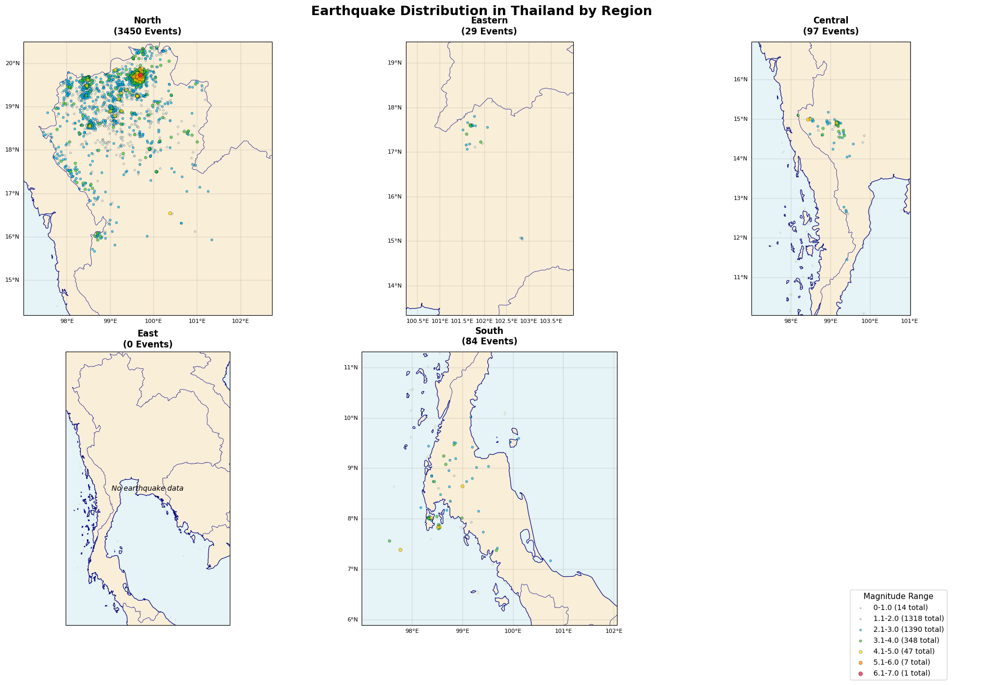


=== สถิติสรุป ===
North:
  - จำนวนแผ่นดินไหว: 3450
  - Magnitude เฉลี่ย: 2.22
  - Magnitude สูงสุด: 6.30
  - จังหวัดที่มีข้อมูล: ['Chiang Mai' 'Chiang Rai' 'Phayao' 'Lamphun' 'Lampang' 'Mae Hong Son'
 'Phrae' 'Tak' 'Uttaradit' 'Nan' 'Phitsanulok' 'Phetchabun'
 'Kamphaeng Phet' 'Sukhothai' 'Phichit']

Eastern:
  - จำนวนแผ่นดินไหว: 29
  - Magnitude เฉลี่ย: 2.51
  - Magnitude สูงสุด: 3.90
  - จังหวัดที่มีข้อมูล: ['Loei' 'Nakhon Ratchasima' 'Nong Khai' 'Buri Ram' 'Nong Bua Lam Phu']

Central:
  - จำนวนแผ่นดินไหว: 97
  - Magnitude เฉลี่ย: 2.48
  - Magnitude สูงสุด: 4.90
  - จังหวัดที่มีข้อมูล: ['Kanchanaburi' 'Suphan Buri' 'Uthai Thani' 'Prachuap Khiri Khan'
 'Phetchaburi']

South:
  - จำนวนแผ่นดินไหว: 84
  - Magnitude เฉลี่ย: 2.67
  - Magnitude สูงสุด: 4.60
  - จังหวัดที่มีข้อมูล: ['Krabi' 'Surat Thani' 'Phuket' 'Trang' 'Phang Nga' 'Ranong'
 'Nakhon Si Thammarat' 'Chumphon' 'Songkhla']



In [ ]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import pandas as pd
import numpy as np

# -------------------------------
# 1. Load data (สมมติว่า df_eq มีอยู่แล้ว)
# -------------------------------
# df = df_eq.copy()  # ใช้เมื่อมีข้อมูลจริง

# สร้างข้อมูลตัวอย่างสำหรับการทดสอบ

df = df_eq.copy()

# -------------------------------
# 2. แก้ไข Mapping จังหวัด → ภูมิภาค
# -------------------------------
region_map = {
    "North": [
        "Chiang Mai","Chiang Rai","Lamphun","Lampang","Phrae","Nan","Phayao",
        "Mae Hong Son","Tak","Uttaradit","Phitsanulok","Sukhothai","Phetchabun",
        "Kamphaeng Phet","Phichit"
    ],
    "Eastern": [
        "Loei","Nong Khai","Bueng Kan","Nakhon Phanom","Sakon Nakhon","Udon Thani",
        "Nong Bua Lam Phu","Khon Kaen","Maha Sarakham","Roi Et","Kalasin","Mukdahan",
        "Yasothon","Amnat Charoen","Nakhon Ratchasima","Buri Ram","Surin",
        "Si Sa Ket","Ubon Ratchathani","Chaiyaphum"
    ],
    "Central": [
        "Bangkok","Nonthaburi","Pathum Thani","Samut Prakan","Phra Nakhon Si Ayutthaya",
        "Saraburi","Lopburi","Ang Thong","Chai Nat","Nakhon Sawan","Sing Buri",
        "Uthai Thani","Kanchanaburi","Suphan Buri","Ratchaburi","Samut Sakhon",
        "Samut Songkhram","Nakhon Pathom","Phetchaburi","Prachuap Khiri Khan"
    ],
    "East": [
        "Chon Buri","Rayong","Chanthaburi","Trat","Prachin Buri","Sa Kaeo","Nakhon Nayok"
    ],
    "South": [
        "Chumphon","Ranong","Surat Thani","Nakhon Si Thammarat","Phang Nga","Phuket",
        "Krabi","Trang","Phatthalung","Songkhla","Satun","Pattani","Yala","Narathiwat"
    ]
}

# -------------------------------
# 3. แก้ไข Color map for magnitude
# -------------------------------
colors_map = {
    (0, 1.0):   ('lightgray', 3),      # แก้ไขจาก white เป็น lightgray เพื่อมองเห็นได้
    (1.1, 2.0): ('lightcyan', 6),
    (2.1, 3.0): ('deepskyblue', 10),
    (3.1, 4.0): ('limegreen', 15),
    (4.1, 5.0): ('gold', 22),
    (5.1, 6.0): ('darkorange', 30),
    (6.1, 7.0): ('crimson', 40),
    (7.1, 8.0): ('darkred', 55),
    (8.1, 9.0): ('indigo', 75)
}

# -------------------------------
# 4. เพิ่มฟังก์ชันสำหรับจัดกลุ่มจังหวัดตามภูมิภาค
# -------------------------------
def assign_region(province):
    """กำหนดภูมิภาคให้จังหวัด"""
    for region, provinces in region_map.items():
        if province in provinces:
            return region
    return "Unknown"  # สำหรับจังหวัดที่ไม่อยู่ในรายการ

# เพิ่มคอลัมน์ region
df['region'] = df['province'].apply(assign_region)

# ตรวจสอบการแบ่งภูมิภาค
print("=== การแบ่งข้อมูลตามภูมิภาค ===")
region_counts = df['region'].value_counts()
print(region_counts)
print(f"จำนวนข้อมูลรวม: {len(df)}")
print()

# -------------------------------
# 5. แก้ไข subplot layout และการ plot
# -------------------------------
n_regions = len(region_map)
fig, axes = plt.subplots(2, 3, figsize=(20, 14),
                         subplot_kw={'projection': ccrs.PlateCarree()})
axes = axes.flatten()

# สร้าง legend elements
legend_elements = []

for i, (region, provinces) in enumerate(region_map.items()):
    ax = axes[i]

    # Filter ข้อมูลตามภูมิภาค
    df_r = df[df["region"] == region]  # แก้ไข: ใช้ region แทน provinces

    print(f"Region {region}: {len(df_r)} events")

    if len(df_r) == 0:
        # ถ้าไม่มีข้อมูล ให้แสดงแผนที่เปล่า
        ax.set_extent([97, 106, 5.5, 20.5], crs=ccrs.PlateCarree())
        ax.add_feature(cfeature.COASTLINE, linewidth=0.8, color='navy')
        ax.add_feature(cfeature.BORDERS, linewidth=0.5, color='navy')
        ax.add_feature(cfeature.LAND, color='wheat', alpha=0.5)
        ax.add_feature(cfeature.OCEAN, color='lightblue', alpha=0.3)
        ax.set_title(f"{region}\n(0 Events)", fontsize=12, fontweight='bold')
        ax.text(0.5, 0.5, 'No earthquake data', transform=ax.transAxes,
                ha='center', va='center', fontsize=10, style='italic')
        continue

    lat_all = df_r["lat"].values
    lon_all = df_r["long"].values
    mag_all = df_r["mag"].values

    # กำหนดขอบเขตให้เหมาะสมกับข้อมูล
    if len(lat_all) > 0:
        lat_margin = (lat_all.max() - lat_all.min()) * 0.1 + 1
        lon_margin = (lon_all.max() - lon_all.min()) * 0.1 + 1
        ax.set_extent([
            max(97, lon_all.min() - lon_margin),
            min(106, lon_all.max() + lon_margin),
            max(5.5, lat_all.min() - lat_margin),
            min(20.5, lat_all.max() + lat_margin)
        ], crs=ccrs.PlateCarree())
    else:
        ax.set_extent([97, 106, 5.5, 20.5], crs=ccrs.PlateCarree())

    # เพิ่ม geographic features
    ax.add_feature(cfeature.COASTLINE, linewidth=0.8, color='navy')
    ax.add_feature(cfeature.BORDERS, linewidth=0.5, color='navy')
    ax.add_feature(cfeature.LAND, color='wheat', alpha=0.5)
    ax.add_feature(cfeature.OCEAN, color='lightblue', alpha=0.3)

    # Plot scatter ตาม magnitude range
    region_legend_added = False
    for (min_mag, max_mag), (color, size) in colors_map.items():
        mask_mag = (mag_all >= min_mag) & (mag_all < max_mag)
        count = np.sum(mask_mag)

        if count > 0:
            scatter = ax.scatter(lon_all[mask_mag], lat_all[mask_mag],
                               c=color, s=size, alpha=0.7,
                               edgecolor='black', linewidth=0.3,
                               transform=ccrs.PlateCarree())

            # เพิ่ม legend element เฉพาะครั้งแรก
            if i == 0:  # เพิ่ม legend เฉพาะ subplot แรก
                legend_elements.append(
                    plt.scatter([], [], c=color, s=size*0.8, alpha=0.7,
                               edgecolor='black', linewidth=0.3,
                               label=f'{min_mag}-{max_mag} ({count} total)')
                )

    # เพิ่ม gridlines
    gl = ax.gridlines(draw_labels=True, linewidth=0.3, color='gray', alpha=0.6)
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 8}
    gl.ylabel_style = {'size': 8}

    # ปรับ title
    ax.set_title(f"{region}\n({len(df_r)} Events)",
                fontsize=12, fontweight='bold', pad=10)

# ปิด subplot ที่เหลือ
for j in range(i+1, len(axes)):
    axes[j].axis('off')

# เพิ่ม overall legend
if legend_elements:
    fig.legend(handles=legend_elements,
              title='Magnitude Range',
              loc='lower right',
              bbox_to_anchor=(0.95, 0.02),
              fontsize=10,
              title_fontsize=11)

plt.suptitle("Earthquake Distribution in Thailand by Region",
             fontsize=18, fontweight='bold', y=0.95)
plt.tight_layout()
plt.subplots_adjust(top=0.90, bottom=0.1)
plt.show()

# -------------------------------
# 6. สรุปสstatistics
# -------------------------------
print("\n=== สถิติสรุป ===")
for region in region_map.keys():
    region_data = df[df['region'] == region]
    if len(region_data) > 0:
        print(f"{region}:")
        print(f"  - จำนวนแผ่นดินไหว: {len(region_data)}")
        print(f"  - Magnitude เฉลี่ย: {region_data['mag'].mean():.2f}")
        print(f"  - Magnitude สูงสุด: {region_data['mag'].max():.2f}")
        print(f"  - จังหวัดที่มีข้อมูล: {region_data['province'].unique()}")
        print()

### Earthquake Events Impacting Thailand

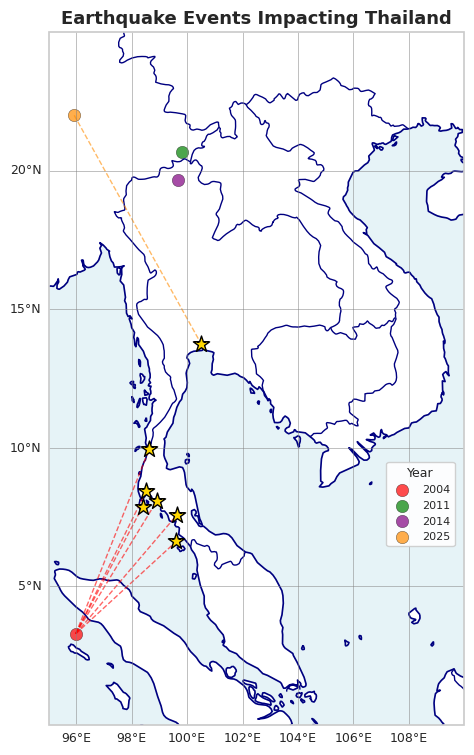

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import numpy as np
import mplcursors

# =========================
# โหลดไฟล์ Excel
# =========================
url = "https://github.com/siriwatsc-debug/ProjectDADS5001/raw/main/disaster_emdat_film_2.xlsx"
df = pd.read_excel(url, sheet_name="Data_Earthquake")

# =========================
# Filter: Thailand + Earthquake
# =========================
df_eq = df[(df['Country']=='Thailand') & (df['disaster type']=='Earthquake')].copy()
df_eq = df_eq.dropna(subset=['region'])

# =========================
# จุดเป้าหมายแต่ละสี (ไม่มีเชียงรายแล้ว)
# =========================
targets_map = {
    'darkorange': [(13.7563, 100.5018)],  # Bangkok
    'red': [  # ภาคใต้ 6 จังหวัด
        (8.0863, 98.9063),   # Krabi
        (8.4500, 98.5250),   # Phangnga
        (7.8804, 98.3923),   # Phuket
        (9.9583, 98.6342),   # Ranong
        (6.6231, 99.6060),   # Satun
        (7.5667, 99.6167)    # Trang
    ]
}

# =========================
# ฟังก์ชัน Interactive Map per Region with colored lines
# =========================
def plot_region_interactive_lines(region_name, df_region):
    lat_all = df_region['latitude'].values
    lon_all = df_region['longitude'].values
    year_all = df_region['Start_Year'].values
    disno_all = df_region['disno.'].values
    mag_all = df_region['magnitude'].values
    mmi_all = df_region['mmi'].values
    deaths_all = df_region['Total_Deaths'].values
    damage_all = df_region['Total_Damage'].values

    mask = (lat_all >= 0) & (lat_all <= 30) & (lon_all >= 90) & (lon_all <= 115)
    lat_filtered = lat_all[mask]
    lon_filtered = lon_all[mask]
    year_filtered = year_all[mask]
    disno_filtered = disno_all[mask]
    mag_filtered = mag_all[mask]
    mmi_filtered = mmi_all[mask]
    deaths_filtered = deaths_all[mask]
    damage_filtered = damage_all[mask]

    # สีตาม 4 ปีแรก
    unique_years = sorted(np.unique(year_filtered))[:4]
    colors = ['red','green','purple','darkorange']
    color_map = {y:c for y,c in zip(unique_years, colors)}

    fig = plt.figure(figsize=(7,9))
    ax = fig.add_subplot(1,1,1,projection=ccrs.PlateCarree())
    ax.set_extent([95,110,0,25], ccrs.PlateCarree())

    # Add geo features
    ax.add_feature(cfeature.COASTLINE, linewidth=1.2, color='navy')
    ax.add_feature(cfeature.BORDERS, linewidth=1.0, color='navy')
    ax.add_feature(cfeature.LAND, color='white', alpha=0.8)
    ax.add_feature(cfeature.OCEAN, color='lightblue', alpha=0.3)

    # =========================
    # วาด scatter จุดเป้าหมาย (Bangkok + ภาคใต้) เท่านั้น
    # =========================
    for color, targets in targets_map.items():
        for lat_t, lon_t in targets:
            ax.scatter(lon_t, lat_t, c='gold', s=150, marker='*', edgecolor='black',
                       transform=ccrs.PlateCarree(), zorder=5)

    # =========================
    # วาด scatter เหตุการณ์จริง + เส้นไปยังเป้าหมาย
    # =========================
    scatter_points = []
    for y in unique_years:
        mask_year = year_filtered == y
        sc = ax.scatter(lon_filtered[mask_year], lat_filtered[mask_year],
                        c=color_map[y], s=80, alpha=0.7,
                        transform=ccrs.PlateCarree(),
                        edgecolor='black', linewidth=0.3,
                        label=f'{y}')
        scatter_points.append(sc)

        # วาดเส้นจากเหตุการณ์ไปยัง target (เฉพาะ Bangkok + ภาคใต้)
        color = color_map[y]
        if color not in targets_map:
            continue
        for lon_pt, lat_pt in zip(lon_filtered[mask_year], lat_filtered[mask_year]):
            for lat_t, lon_t in targets_map[color]:
                ax.plot([lon_pt, lon_t], [lat_pt, lat_t],
                        color=color, linestyle='--', linewidth=1,
                        transform=ccrs.PlateCarree(), alpha=0.6)

    # Gridlines
    gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.7)
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size':9}
    gl.ylabel_style = {'size':9}
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER

    # Legend
    legend = ax.legend(title=f'Year', loc='lower right', fontsize=8, title_fontsize=9,
                       bbox_to_anchor=(0.99,0.25))
    legend.get_frame().set_facecolor('white')
    legend.get_frame().set_alpha(0.9)

    ax.set_title(f"Earthquake Events Impacting Thailand", fontsize=13, fontweight='bold')

    # =========================
    # Interactive hover
    # =========================
    cursor = mplcursors.cursor(scatter_points, hover=True)
    @cursor.connect("add")
    def on_add(sel):
        index = sel.target.index
        sel.annotation.set_text(
            f"Disno: {disno_filtered[index]}\n"
            f"Year: {year_filtered[index]}\n"
            f"Magnitude: {mag_filtered[index]}\n"
            f"MMI: {mmi_filtered[index]}\n"
            f"Deaths: {deaths_filtered[index]}\n"
            f"Damage: {damage_filtered[index]}"
        )
        sel.annotation.get_bbox_patch().set(alpha=0.8, facecolor='yellow')

    plt.show()

# =========================
# Loop per region
# =========================
regions = df_eq['region'].unique()
for reg in regions:
    df_region = df_eq[df_eq['region']==reg]
    plot_region_interactive_lines(reg, df_region)


### Thailand Earthquake

In [ ]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go

# =========================
# โหลดไฟล์ Excel
# =========================
url = "https://github.com/siriwatsc-debug/ProjectDADS5001/raw/main/disaster_emdat_film_2.xlsx"
df = pd.read_excel(url, sheet_name="Data_Earthquake")

# =========================
# Filter Thailand + Earthquake
# =========================
df_eq = df[(df['Country']=='Thailand') & (df['disaster type']=='Earthquake')].copy()
df_eq = df_eq.dropna(subset=['magnitude','depth','Total_Damage','mmi'])


# แปลงคอลัมน์เป็นตัวเลข
numeric_cols = ['Total_Deaths','Total_Affected','Total_Damage','magnitude','mmi','depth']
for col in numeric_cols:
    df_eq[col] = pd.to_numeric(df_eq[col], errors='coerce').fillna(0)

# แทนค่า Total_Damage ที่เป็น 0 เพื่อให้ Bubble แสดง
df_eq['Total_Damage'] = df_eq['Total_Damage'].replace(0,1)

# =========================
# Bubble Chart: Bubble size = Total Damage, Color = Magnitude
# =========================
fig_bubble = px.scatter(
    df_eq,
    x='Start_Year',
    y='Total_Damage',
    size='Total_Damage',
    color='magnitude',
    color_continuous_scale=['#90ee90','#ff6961'],  # สีสว่าง: เขียว → แดง
    hover_data=['disno.','magnitude','depth','Total_Deaths','Total_Affected','mmi'],
    size_max=60,
    title='Thailand Earthquake: Damage vs Year'
)

# =========================
# Highlight เหตุการณ์สำคัญ
# =========================
important_events = ['2004-12-26-PHL', '2011-03-24-THA']  # ตัวอย่าง Disno สำหรับสึนามิ/เชียงราย
df_important = df_eq[df_eq['disno.'].isin(important_events)]
for _, row in df_important.iterrows():
    fig_bubble.add_annotation(
        text=f"{row['disno.']}",
        x=row['Start_Year'],
        y=row['Total_Damage'],
        showarrow=True,
        arrowhead=2,
        arrowcolor='red',
        font=dict(color='red', size=12)
    )

fig_bubble.show()

# =========================
# สร้าง Interactive Table
# =========================
# เลือกคอลัมน์สำคัญ
df_table = df_eq[['disno.', 'Start_Year', 'magnitude', 'mmi', 'depth', 'Total_Damage', 'Total_Deaths', 'Total_Affected']]
df_table = df_table.sort_values(by='Total_Damage', ascending=True)

fig_table = go.Figure(data=[go.Table(
    header=dict(values=list(df_table.columns),
                fill_color='lightblue',
                align='center'),
    cells=dict(values=[df_table[col] for col in df_table.columns],
               fill_color='lavender',
               align='center'))
])

fig_table.update_layout(width=1850, height=600, title='Thailand Earthquake Data Table')
fig_table.show()


### Total Damage by Region

In [ ]:

# 2) โหลดข้อมูลจาก GitHub
# ===============================
url = "https://github.com/siriwatsc-debug/ProjectDADS5001/raw/main/disaster_emdat_film_2.xlsx"
df = pd.read_excel(url, sheet_name="Data_Earthquake")


# ===============================
# 3) ตรวจสอบและเลือกคอลัมน์ที่ใช้
# ===============================
# แปลง Start_Year เป็น int
df['Start_Year'] = df['Start_Year'].astype(int)

# ตรวจสอบว่ามีคอลัมน์ Total_Damage หรือไม่
# สมมติว่าชื่อคอลัมน์คือ 'Total_Damage'
# ถ้าไฟล์จริงชื่ออื่น ให้แก้เป็น df['ชื่อคอลัมน์จริง']
df['Total_Damage'] = df['Total_Damage']

# ===============================
# 4) SEA countries
# ===============================
sea_countries = [
    "Brunei", "Cambodia", "Indonesia", "Laos", "Malaysia",
    "Myanmar", "Philippines", "Singapore", "Thailand", "Vietnam", "Timor-Leste"
]

# ===============================
# 5) สรุปความเสียหายต่อปี
# ===============================
global_damage = df.groupby('Start_Year')['Total_Damage'].sum().rename('Global_Damage')
sea_damage = df[df['Country'].isin(sea_countries)].groupby('Start_Year')['Total_Damage'].sum().rename('SEA_Damage')
th_damage = df[df['Country']=='Thailand'].groupby('Start_Year')['Total_Damage'].sum().rename('Thailand_Damage')

summary = pd.concat([global_damage, sea_damage, th_damage], axis=1).fillna(0).reset_index()

# ===============================
# 6) คำนวณสัดส่วน
# ===============================
summary['SEA_to_Global'] = summary['SEA_Damage'] / summary['Global_Damage']
summary['TH_to_SEA'] = summary['Thailand_Damage'] / summary['SEA_Damage'].replace(0,1)
summary['TH_to_Global'] = summary['Thailand_Damage'] / summary['Global_Damage']

# สำหรับ 100% Stacked
summary['Other_World_pct'] = (summary['Global_Damage'] - summary['SEA_Damage']) / summary['Global_Damage']
summary['SEA_ex_Thailand_pct'] = (summary['SEA_Damage'] - summary['Thailand_Damage']) / summary['Global_Damage']
summary['Thailand_pct'] = summary['Thailand_Damage'] / summary['Global_Damage']



# ===============================
# 7) Stacked Bar Chart (จำนวนจริง)
# ===============================
fig_bar = go.Figure()
fig_bar.add_trace(go.Bar(
    x=summary['Start_Year'],
    y=summary['Global_Damage'] - summary['SEA_Damage'],
    name='Other World',
    marker_color='lightblue'
))
fig_bar.add_trace(go.Bar(
    x=summary['Start_Year'],
    y=summary['SEA_Damage'] - summary['Thailand_Damage'],
    name='SEA excluding Thailand',
    marker_color='orange'
))
fig_bar.add_trace(go.Bar(
    x=summary['Start_Year'],
    y=summary['Thailand_Damage'],
    name='Thailand',
    marker_color='red'
))
fig_bar.update_layout(
    barmode='stack',
    title='Total Damage by Region',
    xaxis=dict(title='Year', tickmode='linear', dtick=1),
    yaxis=dict(title='Total Damage (U.S.Dolar)'),
    legend_title='Region'
)
fig_bar.show()

# ===============================
# สร้างตารางสรุปตัวเลข
# ===============================
summary_table = summary.copy()

# เพิ่มคอลัมน์ Other World
summary_table['Other_World'] = summary_table['Global_Damage'] - summary_table['SEA_Damage']

# ===============================
# แปลงตัวเลขเป็น string ใส่ลูกน้ำ
# ===============================
summary_table_display_formatted = summary_table_display.copy()
for col in ['Global_Damage', 'SEA_Damage', 'Thailand_Damage', 'Other_World']:
    summary_table_display_formatted[col] = summary_table_display_formatted[col].apply(lambda x: f"{int(x):,}")

# ===============================
# สร้าง Plotly Table
# ===============================
fig_summary = go.Figure(data=[go.Table(
    header=dict(values=['Start_Year','Global_Damage (U.S.Dolar)','SEA_Damage (U.S.Dolar)',
                        'Thailand_Damage (U.S.Dolar)','Other_World (U.S.Dolar)'],
                fill_color='lightblue',
                align='center'),
    cells=dict(values=[summary_table_display_formatted[col] for col in summary_table_display_formatted.columns],
               fill_color='lavender',
               align='center'))
])

fig_summary.update_layout(width=1850, height=800, title='Summary of Total Damage by Region')
fig_summary.show()

# OTHER

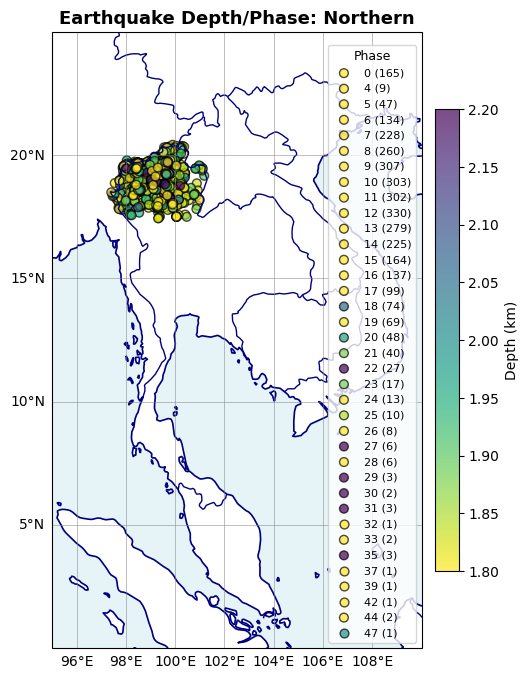

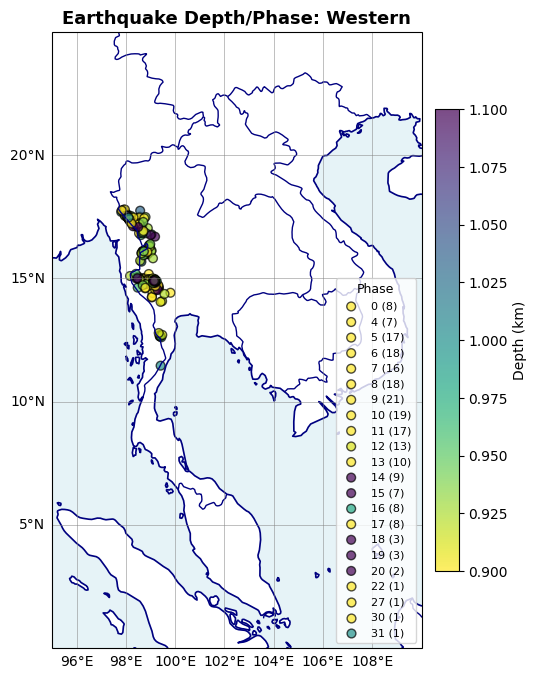

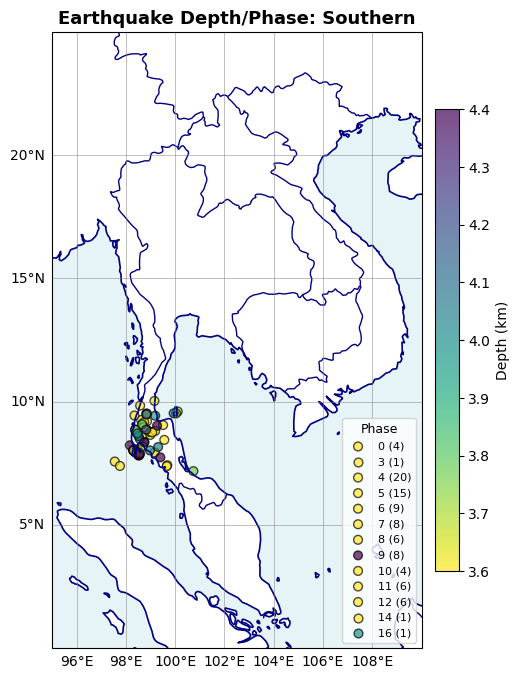

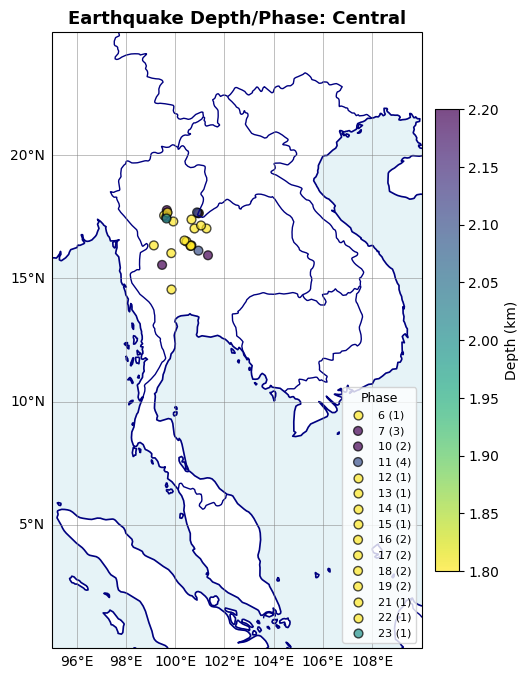

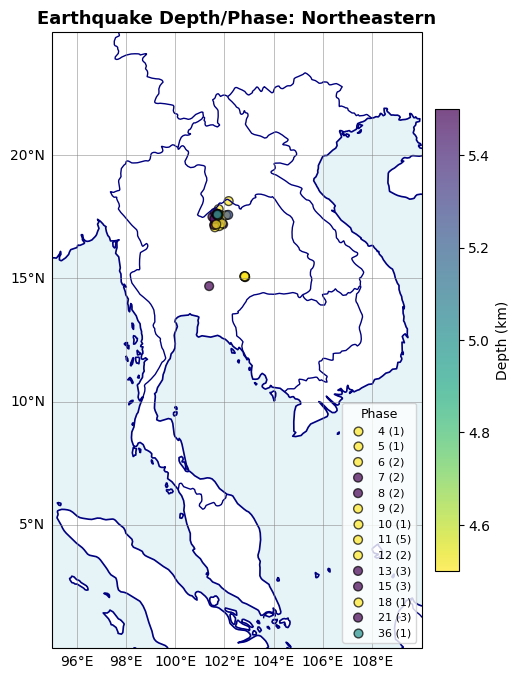

In [ ]:
# Plot Depth and Phase by Regions - Need to check bubble sizes of depth and phase - Require Geo Knowledge

df = df_eq.copy()

def plot_region_depth_phase(region_name, df_region):
    lat_all = df_region["lat"].values
    lon_all = df_region["long"].values
    depth_all = df_region["depth"].values       # ความลึก
    phase_all = df_region["phase"].values       # Phase

    mask = (lat_all >= 0) & (lat_all <= 30) & (lon_all >= 90) & (lon_all <= 115)
    lat_filtered = lat_all[mask]
    lon_filtered = lon_all[mask]
    depth_filtered = depth_all[mask]
    phase_filtered = phase_all[mask]

    fig = plt.figure(figsize=(6, 8))
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
    ax.set_extent([95, 110, 0, 25], crs=ccrs.PlateCarree())

    ax.add_feature(cfeature.COASTLINE, linewidth=1.2, color='navy')
    ax.add_feature(cfeature.BORDERS, linewidth=1.0, color='navy')
    ax.add_feature(cfeature.LAND, color='white', alpha=0.8)
    ax.add_feature(cfeature.OCEAN, color='lightblue', alpha=0.3)

    # ตัวอย่าง phase marker map
    phase_marker = {"P": "o", "S": "^", "L": "s"}  # กำหนดตาม phase มี o, ^, s

    unique_phases = np.unique(phase_filtered)
    for phase in unique_phases:
        phase_mask = (phase_filtered == phase)
        if np.any(phase_mask):
            scatter = ax.scatter(
                lon_filtered[phase_mask],
                lat_filtered[phase_mask],
                c=depth_filtered[phase_mask],   # ให้ colormap แสดงความลึก
                cmap='viridis_r',               # colormap สำหรับ depth
                s=40,
                alpha=0.7,
                marker=phase_marker.get(phase, 'o'),
                edgecolor='black',
                transform=ccrs.PlateCarree(),
                label=f"{phase} ({np.sum(phase_mask)})"
            )

    gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.7)
    gl.top_labels = False; gl.right_labels = False
    ax.set_title(f"Earthquake Depth/Phase: {region_name}", fontsize=13, fontweight='bold')

    # เพิ่ม colorbar สำหรับ depth
    cb = plt.colorbar(scatter, ax=ax, orientation='vertical', label='Depth (km)', shrink=0.75, pad=0.03)
    ax.legend(title="Phase", loc='lower right', fontsize=8, title_fontsize=9)
    plt.show()


# === Drop NaN in Region ===
df_eq = df_eq.dropna(subset=["region"])


# === Loop plot per region ===
regions = df_eq["region"].unique()

for reg in regions:
    df_region = df_eq[df_eq["region"] == reg]
    #plot_region(reg, df_region)
    plot_region_depth_phase(reg, df_region)


Total Thailand events (2007-2025): 3747
Top 5 provinces:
       province  count
0    Chiang Rai   1494
1    Chiang Mai    855
2  Mae Hong Son    480
3       Lampang    245
4           Tak    112
Number of zero-event provinces: 43
['Amnat Charoen', 'Ang Thong', 'Bangkok', 'Bueng Kan', 'Buri Ram', 'Chachoengsao', 'Chai Nat', 'Chaiyaphum', 'Chanthaburi', 'Chiang Mai', 'Chiang Rai', 'Chon Buri', 'Chumphon', 'Kalasin', 'Kamphaeng Phet', 'Kanchanaburi', 'Khon Kaen', 'Krabi', 'Lampang', 'Lamphun', 'Loei', 'Lop Buri', 'Mae Hong Son', 'Maha Sarakham', 'Mukdahan', 'Nakhon Nayok', 'Nakhon Pathom', 'Nakhon Phanom', 'Nakhon Ratchasima', 'Nakhon Sawan', 'Nakhon Si Thammarat', 'Nan', 'Narathiwat', 'Nong Bua Lam Phu', 'Nong Khai', 'Nonthaburi', 'Pathum Thani', 'Pattani', 'Phang Nga', 'Phatthalung', 'Phayao', 'Phetchabun', 'Phetchaburi', 'Phichit', 'Phitsanulok', 'Phra Nakhon Si Ayutthaya', 'Phrae', 'Phuket', 'Prachin Buri', 'Prachuap Khiri Khan', 'Ranong', 'Ratchaburi', 'Rayong', 'Roi Et', 'Sa Kaeo', 

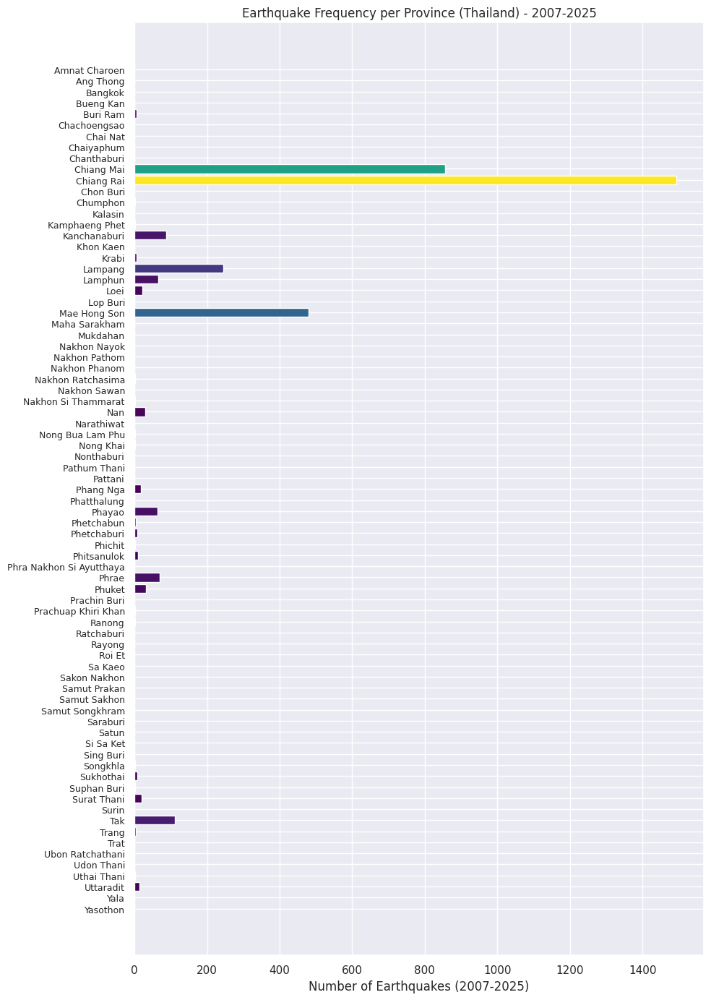

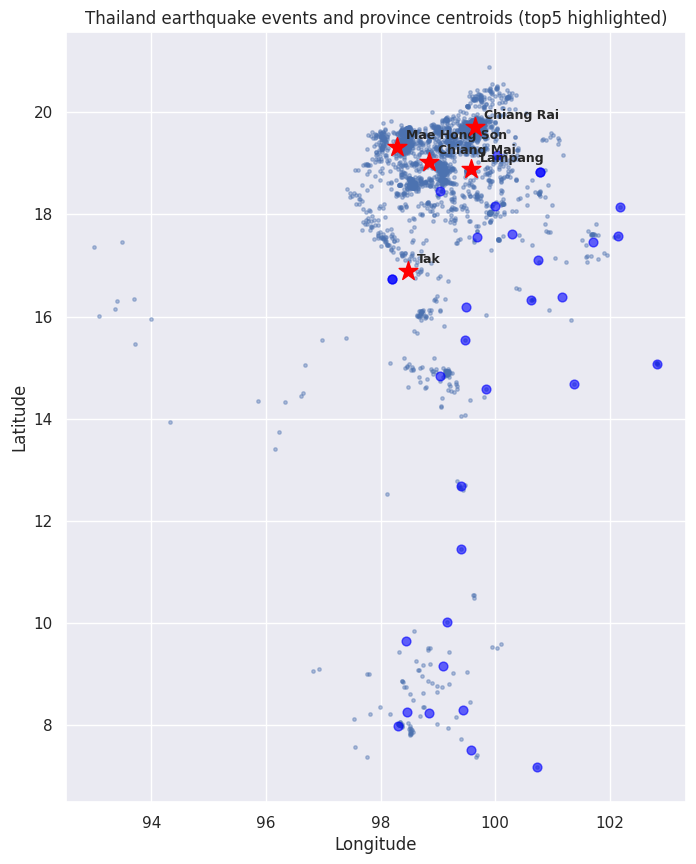

In [ ]:
# Plot : top 5 provinces occured EQ

import pandas as pd, numpy as np, matplotlib.pyplot as plt, os

df = df_eq.copy()


# --- tidy column names & detect columns ---
df.columns = [c.strip() for c in df.columns]
col_map = {c.lower(): c for c in df.columns}
date_col = next((c for c in df.columns if 'date' in c.lower() and 'thai' not in c.lower()), None)
lat_col = col_map.get('lat.') or col_map.get('lat')
lon_col = col_map.get('long.') or col_map.get('long')
prov_col = col_map.get('province')
mag_col = col_map.get('mag.') or col_map.get('mag')
country_col = col_map.get('country')

# --- parse date and extract year ---
df[date_col] = pd.to_datetime(df[date_col], errors='coerce')
df['YEAR2'] = df[date_col].dt.year

# --- normalization ---
df[prov_col] = df[prov_col].astype(str).str.strip()
df[country_col] = df[country_col].astype(str).str.strip()
df[lat_col] = pd.to_numeric(df[lat_col], errors='coerce')
df[lon_col] = pd.to_numeric(df[lon_col], errors='coerce')

# --- filter rows: COUNTRY contains 'Thailand' (to catch border labels) and YEAR between 2007-2025 ---
mask_th = df[country_col].str.contains('Thailand', na=False) & df['YEAR2'].between(2007, 2025)
df_th = df[mask_th].copy()

# --- counts per province (2007-2025) ---
counts_prov = df_th[prov_col].value_counts().rename_axis('province').reset_index(name='count')
counts_prov = counts_prov.sort_values('count', ascending=False)
counts_prov['province_norm'] = counts_prov['province'].str.title().str.strip()

# --- standard province list (Thai provinces, English names) ---
thai_provinces = [
"Bangkok","Samut Prakan","Nonthaburi","Pathum Thani","Phra Nakhon Si Ayutthaya","Ang Thong","Lop Buri","Sing Buri","Chai Nat",
"Saraburi","Nakhon Nayok","Sukhothai","Phitsanulok","Phetchabun","Kamphaeng Phet","Tak","Uthai Thani","Nakhon Sawan","Uttaradit","Phrae",
"Nan","Lamphun","Lampang","Mae Hong Son","Chiang Mai","Chiang Rai","Phayao","Nakhon Ratchasima","Buri Ram","Surin","Si Sa Ket","Ubon Ratchathani",
"Chaiyaphum","Khon Kaen","Maha Sarakham","Roi Et","Kalasin","Sakon Nakhon","Nakhon Phanom","Mukdahan","Yasothon","Nong Khai","Bueng Kan","Loei",
"Nong Bua Lam Phu","Prachin Buri","Chachoengsao","Chon Buri","Rayong","Trat","Chanthaburi","Prachuap Khiri Khan","Ratchaburi","Kanchanaburi",
"Suphan Buri","Samut Songkhram","Samut Sakhon","Nakhon Pathom","Phetchaburi","Phang Nga","Phuket","Krabi",
"Surat Thani","Nakhon Si Thammarat","Phatthalung","Songkhla","Satun","Trang","Pattani","Yala","Narathiwat",
"Amnat Charoen","Chumphon","Phichit","Ranong","Sa Kaeo","Udon Thani"
]
thai_provinces = list(dict.fromkeys([p.title() for p in thai_provinces]))

# --- observed / zero-event provinces ---
observed = set(counts_prov['province_norm'].unique())
all_provs = set([p.title() for p in thai_provinces])
zero_event_provs = sorted(list(all_provs - observed))

# --- top5 ---
top5 = counts_prov.head(5).copy()
top5['province_norm'] = top5['province'].str.title().str.strip()

# --- show & save outputs ---
print("Total Thailand events (2007-2025):", len(df_th))
print("Top 5 provinces:")
print(top5[['province','count']])
print("Number of zero-event provinces:", len(zero_event_provs))

outdir = "/mnt/data/earthquake_analysis_outputs"
os.makedirs(outdir, exist_ok=True)
counts_prov.to_csv(os.path.join(outdir, "counts_by_province_2007_2025.csv"), index=False)
top5.to_csv(os.path.join(outdir, "top5_provinces.csv"), index=False)
pd.DataFrame({'province': zero_event_provs}).to_csv(os.path.join(outdir, "zero_event_provinces.csv"), index=False)

# --- Plot: horizontal bar heatmap-like ---
prov_list = sorted(list(all_provs))
counts_map = {row['province_norm']: int(row['count']) for _,row in counts_prov.iterrows()}
counts_all = [counts_map.get(p, 0) for p in prov_list]
print(prov_list)
print(counts_all)

fig, ax = plt.subplots(figsize=(10,14))
y_pos = np.arange(len(prov_list))
bars = ax.barh(y_pos, counts_all)
ax.set_yticks(y_pos)
ax.set_yticklabels(prov_list, fontsize=9)
ax.invert_yaxis()
ax.set_xlabel('Number of Earthquakes (2007-2025)')
ax.set_title('Earthquake Frequency per Province (Thailand) - 2007-2025')
cmax = max(counts_all) if counts_all else 1
for i, b in enumerate(bars):
    b.set_facecolor(plt.cm.viridis(counts_all[i]/cmax if cmax>0 else 0))
plt.tight_layout()
plt.show()

# --- Simple scatter map (lon/lat) and highlight top5 centroids ---
centroids = df_th.groupby(prov_col).agg({lat_col:'mean', lon_col:'mean'}).reset_index()
centroids['province_norm'] = centroids[prov_col].str.title().str.strip()
centroids = centroids.merge(counts_prov[['province_norm','count']], on='province_norm', how='left').fillna(0)

plt.figure(figsize=(8,10))
if len(df_th)>0:
    plt.scatter(df_th[lon_col], df_th[lat_col], s=6, alpha=0.4, label='events')
for _, row in centroids.iterrows():
    prov = row['province_norm']
    if prov in top5['province_norm'].values:
        plt.scatter(row[lon_col], row[lat_col], s=200, marker='*', color='red', zorder=5)
        plt.text(row[lon_col]+0.15, row[lat_col]+0.15, prov, fontsize=9, weight='bold')
    else:
        plt.scatter(row[lon_col], row[lat_col], s=40, marker='o', color='blue', alpha=0.6)
plt.xlabel('Longitude'); plt.ylabel('Latitude')
plt.title('Thailand earthquake events and province centroids (top5 highlighted)')
plt.show()


In [ ]:
# Scope to Thailand



fig, ax = plt.subplots(figsize=(15 , 10))
ax.imshow(img1)

#plt.figure(figsize=(15,10))
ax.axis('off')

# highlight rectangle to Thailand
x = 760
y = 350
width = 120
height = 190
highlight = patches.Rectangle( (x,y), width, height, linewidth=4, edgecolor='blue', facecolor='none', alpha=0.7)
#highlight = patches.Rectangle( (x,y), width, height, linewidth=2, edgecolor='red', facecolor='green', alpha=0.3)

ax.add_patch(highlight)
ax.text(x+70, y-30, 'Thailand', fontsize = 20, fontweight='bold', color='blue', ha='center', va='center')

# Add Indian plate
ax.text(x-270, y+50, 'Indian plate', fontsize = 20, fontweight='bold', color='black', ha='center', va='center')
ax.text(500, -20, 'Plates around Thailand and movement', fontsize = 20, fontweight='bold', color='blue', ha='center', va='center')
plt.show()


# Add explanation for Indian plate movement
s = """# แผ่นเปลือกโลกบริเวณประเทศไทย และ ข้อมูลการเคลื่อนตัว
## <font color=Green>ที่มา : wiki pedia (https://en.wikipedia.org/wiki/Indian_plate)</font>
### ขนาดพื้นที่ และ การเคลื่อนตัว
- Approximate area	11,900,000 km2 (4,600,000 sq mi)
- Movement:	North-east
- Speed1	26–36 mm/a (1.0–1.4 in/year)

"""
display( Markdown(s) )


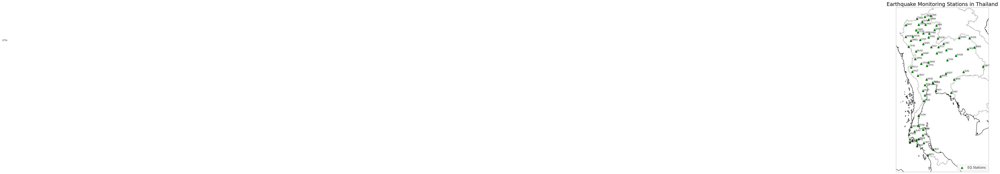

# สถานีตรวจวัดแผ่นดินไหว สถานีหลัก 73 แห่ง ครอบคลุมพื้นที่ในประเทศไทย
(Sensor Orientation of the TMD Seismic Network)
## <font color=Green>ที่มา : กองเฝ้าระวังแผ่นดินไหว (https://earthquake.tmd.go.th/stations.html) </font>



In [ ]:
# Display EQ station in Thailand - DONE

df = df_pl

# Map
fig = plt.figure(figsize=(5,8))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([97, 106, 5, 21])  # Thai location

# Add line
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.COASTLINE)

# Plot EQ stations by lat and long
plt.scatter(df['Long'], df['Lat'],
            c='Green', marker='^', s=50, label="EQ Stations",
            transform=ccrs.PlateCarree())

# Add station code
for i, row in df.iterrows():
    plt.text(row['Long']+0.1, row['Lat']+0.0, row['Station code'],
             fontsize=7, transform=ccrs.PlateCarree())

plt.tight_layout(pad=10)
plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
# Legend + Title
plt.legend(loc="lower right")
plt.title("Earthquake Monitoring Stations in Thailand", fontsize=18, color = 'black')

plt.show()

s = """# สถานีตรวจวัดแผ่นดินไหว สถานีหลัก 73 แห่ง ครอบคลุมพื้นที่ในประเทศไทย
(Sensor Orientation of the TMD Seismic Network)
## <font color=Green>ที่มา : กองเฝ้าระวังแผ่นดินไหว (https://earthquake.tmd.go.th/stations.html) </font>

"""

warnings.filterwarnings("ignore", category=UserWarning)

display( Markdown(s) )

Index(['no', 'refid', 'dtutc', 'date', 'year', 'month', 'day', 'time', 'lat',
       'long', 'mag', 'MAG_RANGE', 'MAG_RANGE_DES', 'depth', 'phase',
       'region_th', 'subdistrict', 'district', 'province', 'country', 'region',
       'REGION_NAME_ENG', 'DETAIL'],
      dtype='object')


/usr/local/lib/python3.12/dist-packages/cartopy/io/__init__.py:242: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/50m_physical/ne_50m_lakes.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


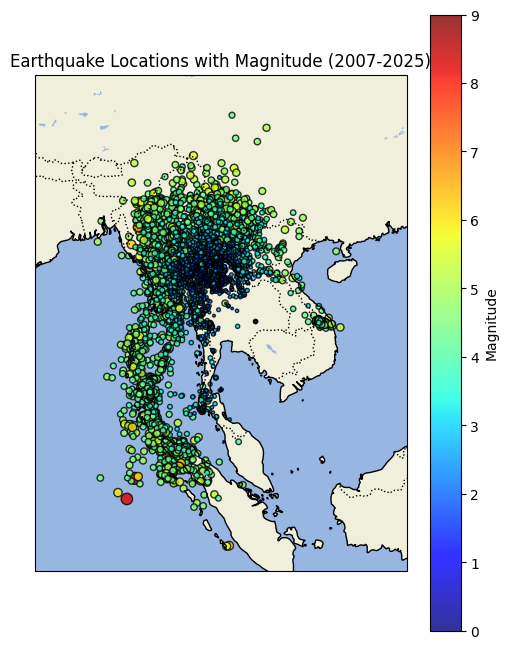

# Local : Earthquake in Thailand and nearby
## <font color=Green>ที่มา : กองเฝ้าระวังแผ่นดินไหว (https://earthquake.tmd.go.th)</font>



In [ ]:
# Overall Earth Quake in South East Asia / South China

import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Set Data Frame : Earth Quake
df = df_eq.copy()
print(df.columns)

# column: 'Latitude', 'Longitude', 'Magnitude'
lat = df["lat"]
lon = df["long"]
mag = df["mag"]

# Plot map
fig = plt.figure(figsize=(6, 8))
ax = plt.axes(projection=ccrs.PlateCarree())

# Add borders
#ax.add_feature(cfeature.STATES)
ax.add_feature(cfeature.LAKES)
ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.OCEAN)
#ax.add_feature(cfeature.RIVERS)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=":")

# Set Frame to plot
#ax.set_extent([90, 110, 0, 30], crs=ccrs.PlateCarree())

ax.set_extent([85, 115, -5, 35], crs=ccrs.PlateCarree())

# plot EQ location by lat and long
sc = ax.scatter(
    lon, lat,
    c=mag, s=mag**2,   # ขนาดจุด ∝ magnitude
    cmap="jet", alpha=0.8,
    vmin=0, vmax=9.0,
    edgecolor="k", transform=ccrs.PlateCarree()
)

# colorbar
plt.colorbar(sc, ax=ax, label="Magnitude")

plt.title("Earthquake Locations with Magnitude (2007-2025)")
plt.show()

s = """# Local : Earthquake in Thailand and nearby
## <font color=Green>ที่มา : กองเฝ้าระวังแผ่นดินไหว (https://earthquake.tmd.go.th)</font>

"""



display( Markdown(s) )




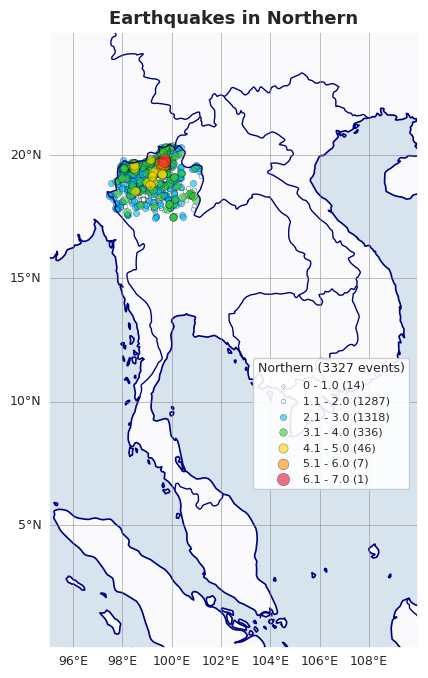

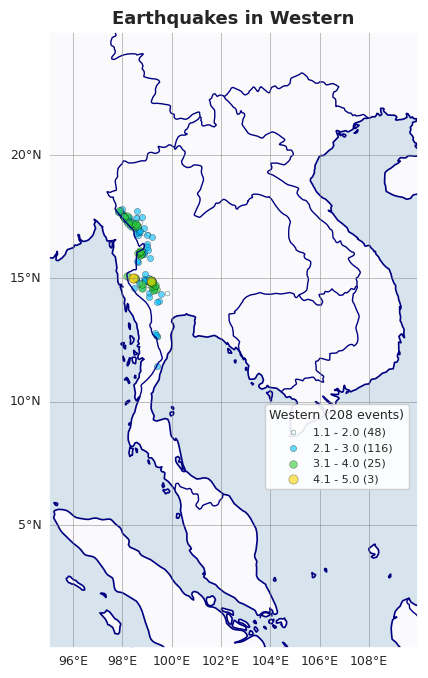

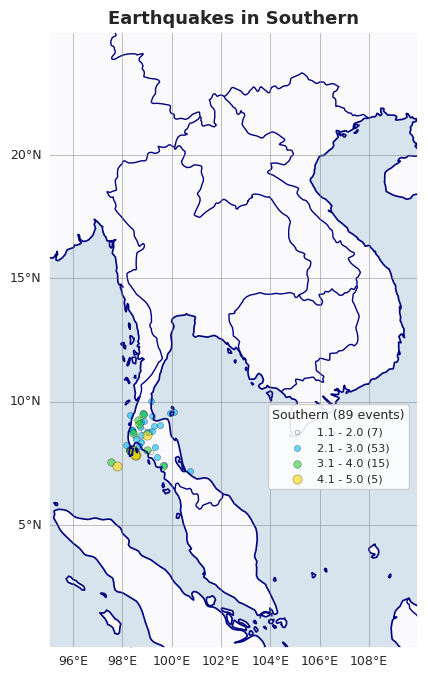

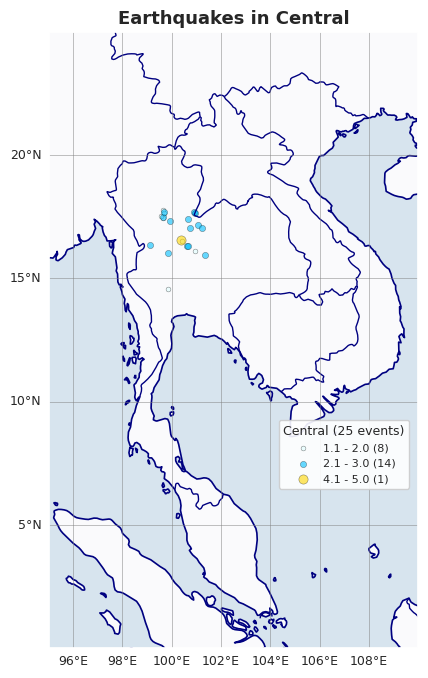

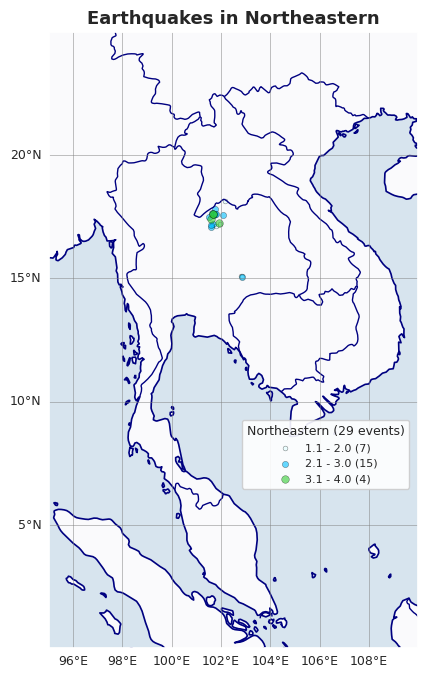

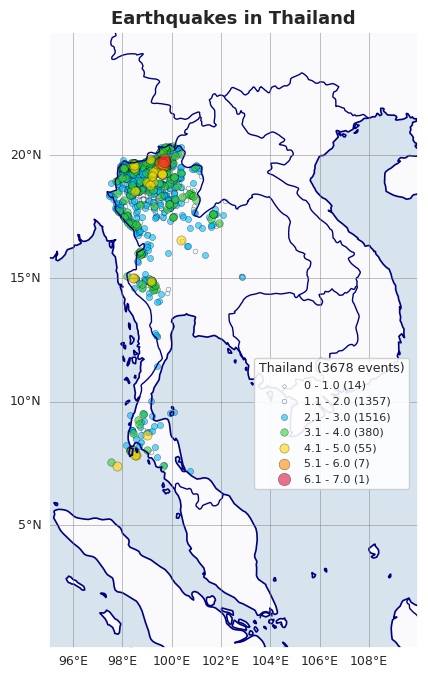

In [ ]:
# Plot by Country : In progress

import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import numpy as np


df = df_eq.copy()
# === Function plot per region ===
def plot_region(region_name, df_region):
    lat_all = df_region["lat"].values
    lon_all = df_region["long"].values
    mag_all = df_region["mag"].values

    # Filter in SEA
    mask = (lat_all >= 0) & (lat_all <= 30) & (lon_all >= 90) & (lon_all <= 115)
    lat_filtered = lat_all[mask]
    lon_filtered = lon_all[mask]
    mag_filtered = mag_all[mask]

    # Create Map
    #fig = plt.figure(figsize=(8, 10))
    fig = plt.figure(figsize=(6, 8))
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
    ax.set_extent([95, 110, 0, 25], crs=ccrs.PlateCarree())

    # Add Geo features
    ax.add_feature(cfeature.COASTLINE, linewidth=1.2, color='navy')
    ax.add_feature(cfeature.BORDERS, linewidth=1.0, color='navy')
    ax.add_feature(cfeature.LAND, color='white', alpha=0.8)
    ax.add_feature(cfeature.OCEAN, color='lightblue', alpha=0.3)

    # Colormap magnitude
    colors_map = {
        (0, 1.0):   ('white', 3),
        (1.1, 2.0): ('lightcyan', 6),
        (2.1, 3.0): ('deepskyblue', 10),
        (3.1, 4.0): ('limegreen', 15),
        (4.1, 5.0): ('gold', 22),
        (5.1, 6.0): ('darkorange', 30),
        (6.1, 7.0): ('crimson', 40),
        (7.1, 8.0): ('darkred', 55),
        (8.1, 9.0): ('indigo', 75)
    }

    # Scatter points
    for (min_mag, max_mag), (color, size) in colors_map.items():
        mask_mag = (mag_filtered >= min_mag) & (mag_filtered < max_mag)
        if np.any(mask_mag):
            count = np.sum(mask_mag)
            ax.scatter(lon_filtered[mask_mag], lat_filtered[mask_mag],
                       c=color, s=size*2, alpha=0.6,
                       edgecolor='black', linewidth=0.3,
                       transform=ccrs.PlateCarree(),
                       label=f'{min_mag} - {max_mag} ({count})')

    # Gridlines
    gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.7)
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 9}
    gl.ylabel_style = {'size': 9}
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER

    # Legend
    legend = ax.legend(title=f'{region_name} ({len(mag_filtered)} events)',
                       loc='lower right', fontsize=8, title_fontsize=9,
                       bbox_to_anchor=(0.99, 0.25))
    legend.get_frame().set_facecolor('white')
    legend.get_frame().set_alpha(0.9)

    ax.set_title(f"Earthquakes in {region_name}", fontsize=13, fontweight='bold')
    plt.show()

# === Drop NaN in Region ===
df_eq = df_eq.dropna(subset=["region"])

# === Loop plot per region ===
regions = df_eq["region"].unique()

for reg in regions:
    df_region = df_eq[df_eq["region"] == reg]
    plot_region(reg, df_region)


# === Drop NaN in Country ===
df_eq = df_eq.dropna(subset=["country"])

# === Loop plot per Country ===
countrys = df_eq["country"].unique()

for reg in countrys:
    df_country = df_eq[df_eq["country"] == reg]
    plot_region(reg, df_country)

warnings.filterwarnings("ignore", category=UserWarning)

In [ ]:
df_eq['country']
grouped = df_eq.groupby( ['country'] )     # default: axis=0, dropna=True
print(grouped)
display(grouped)
#display( grouped.get_group(('china',)) )   # OK

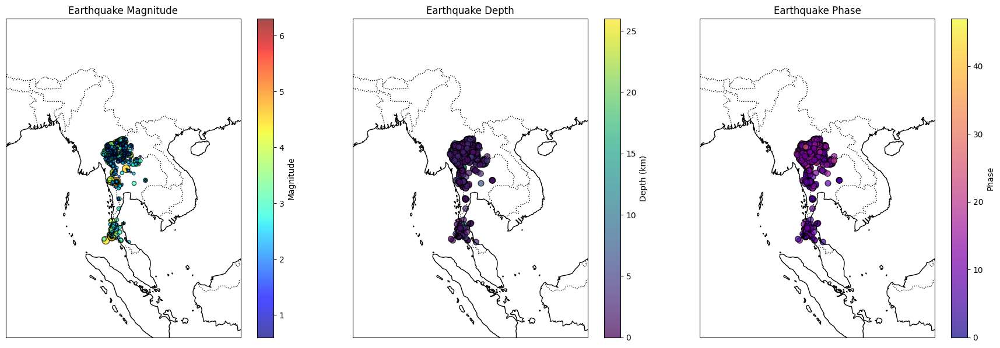

In [ ]:

# Plot Mag, Depth and Phase


# สมมติว่ามีคอลัมน์: Latitude, Longitude, Magnitude, Depth, Phase
lat = df["lat"]
lon = df["long"]
mag = df["mag"]
depth = df["depth"]
phase = df["phase"]


# กำหนดพื้นที่แผนที่ (ประเทศไทยและรอบๆ)
extent = [85, 115, -5, 35] #[90, 110, 5, 25]

# --- Plot ---
fig, axes = plt.subplots(1, 3, figsize=(18, 6),
                         subplot_kw={'projection': ccrs.PlateCarree()})

# Plot Depth and Phase
# ===== แผนที่ Magnitude =====
axes[0].add_feature(cfeature.COASTLINE)
axes[0].add_feature(cfeature.BORDERS, linestyle=":")
axes[0].set_extent(extent)
sc1 = axes[0].scatter(lon, lat, c=mag, s=mag**3,
                      cmap="jet", alpha=0.7, edgecolor="k",transform=ccrs.PlateCarree())
plt.colorbar(sc1, ax=axes[0], orientation="vertical", label="Magnitude")
axes[0].set_title("Earthquake Magnitude")

# ===== แผนที่ Depth =====
axes[1].add_feature(cfeature.COASTLINE)
axes[1].add_feature(cfeature.BORDERS, linestyle=":")
axes[1].set_extent(extent)
sc2 = axes[1].scatter(lon, lat, c=depth, s=50,
                      cmap="viridis", alpha=0.7, edgecolor="k")
plt.colorbar(sc2, ax=axes[1], orientation="vertical", label="Depth (km)")
axes[1].set_title("Earthquake Depth")

# ===== แผนที่ Phase =====
axes[2].add_feature(cfeature.COASTLINE)
axes[2].add_feature(cfeature.BORDERS, linestyle=":")
axes[2].set_extent(extent)
sc3 = axes[2].scatter(lon, lat, c=phase, s=50,
                      cmap="plasma", alpha=0.7, edgecolor="k")
plt.colorbar(sc3, ax=axes[2], orientation="vertical", label="Phase")
axes[2].set_title("Earthquake Phase")

plt.tight_layout()
plt.show()

In [ ]:

df_eq.index
df_eq.columns

df_region[['depth','phase','region']]

,depth,phase,region
3271,3.0,15,Northeastern
3807,7.0,8,Northeastern
4925,1.0,11,Northeastern
5745,5.0,36,Northeastern
5749,1.0,9,Northeastern
6203,2.0,15,Northeastern
6444,5.0,21,Northeastern
6519,3.0,13,Northeastern
6615,1.0,4,Northeastern
6827,1.0,5,Northeastern


Columns in df_eq: ['no', 'refid', 'dtutc', 'date', 'year', 'month', 'day', 'time', 'lat', 'long', 'mag', 'MAG_RANGE', 'MAG_RANGE_DES', 'depth', 'phase', 'region_th', 'subdistrict', 'district', 'province', 'country', 'region', 'REGION_NAME_ENG', 'DETAIL']


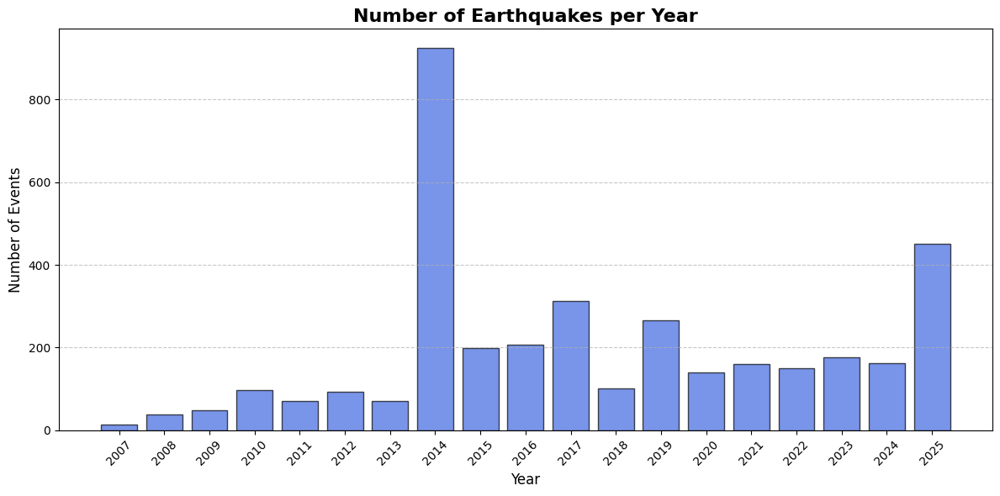

ช่วงปีที่มีข้อมูล: 2007 - 2025
จำนวนปีทั้งหมด: 19
ปีที่มีแผ่นดินไหวมากที่สุด: 2014 (924 เหตุการณ์)


In [ ]:
# ตรวจสอบชื่อคอลัมน์ทั้งหมด
print("Columns in df_eq:", df_eq.columns.tolist())

# Number of Earthquakes per Year "Bar Plot"

# แปลง YEAR เป็นตัวเลข แล้วกรองค่า missing
df_eq['year'] = pd.to_numeric(df_eq['year'], errors='coerce')  # แก้ไขเป็น df_eq
df_eq = df_eq.dropna(subset=['year'])

# นับจำนวนเหตุการณ์ต่อปี
year_counts = df_eq['year'].astype(int).value_counts().sort_index()

# แปลง index เป็น string เพื่อให้แกน x ไม่มี .0
years = year_counts.index.astype(str)
counts = year_counts.values

# พล็อตกราฟแท่ง
plt.figure(figsize=(12, 6))
plt.bar(years, counts, color='royalblue', edgecolor='black', alpha=0.7)
plt.title('Number of Earthquakes per Year', fontsize=16, fontweight='bold')
plt.xlabel('Year', fontsize=12)
plt.ylabel('Number of Events', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# แสดงข้อมูลสถิติ
print(f"ช่วงปีที่มีข้อมูล: {year_counts.index.min()} - {year_counts.index.max()}")
print(f"จำนวนปีทั้งหมด: {len(year_counts)}")
print(f"ปีที่มีแผ่นดินไหวมากที่สุด: {year_counts.idxmax()} ({year_counts.max()} เหตุการณ์)")




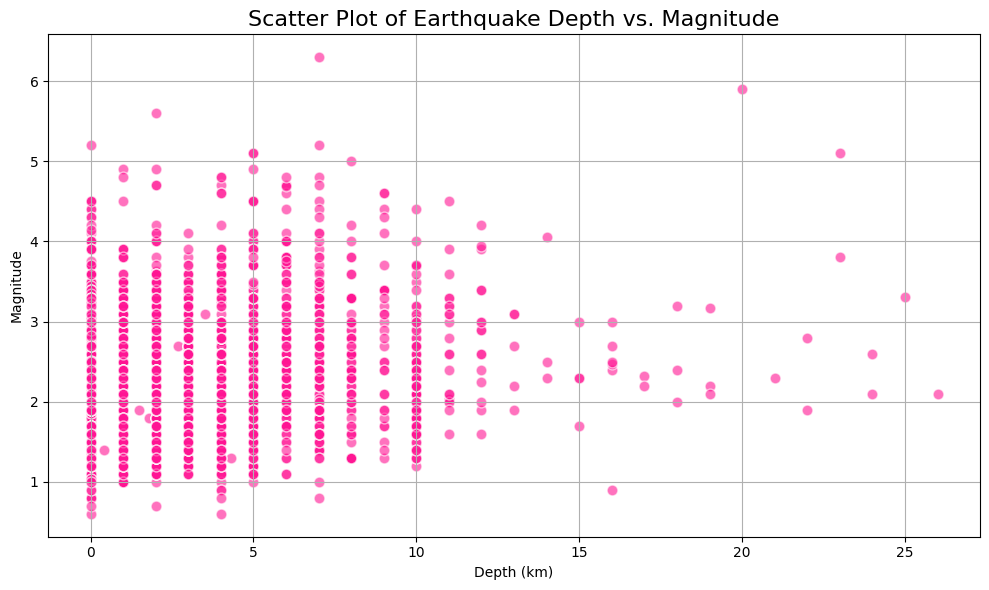

In [ ]:
# กรองเฉพาะข้อมูลที่มี DEPTH และ MAG
df = df.dropna(subset=['depth', 'mag'])
df['depth'] = pd.to_numeric(df['depth'], errors='coerce')
df['mag'] = pd.to_numeric(df['mag'], errors='coerce')
df = df.dropna(subset=['depth', 'mag'])

#scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(df['depth'], df['mag'], alpha=0.6, c='deeppink', edgecolors='w', s=60)
plt.title('Scatter Plot of Earthquake Depth vs. Magnitude', fontsize=16)
plt.xlabel('Depth (km)')
plt.ylabel('Magnitude')
plt.grid(True)
plt.tight_layout()
plt.show()


📋 Summary Statistics:
   - Time period: 2007-01-04 to 2025-08-30
   - Magnitude range: 0.6 - 8.6
   - Foreshock duration: 1924 days
   - Aftershock duration: 4889 days



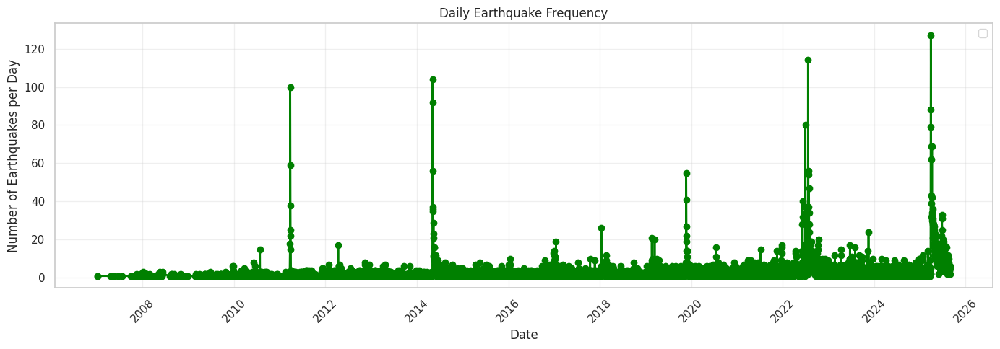

In [ ]:
# ใช้ DataFrame จาก df_eq
df = df_eq.copy()

# ✅ แก้ชื่อคอลัมน์ให้ตรง
df = df.rename(columns={
    'DATE_THAI': 'date',
    'MAG': 'mag'
})

# === 2) แปลงเวลา ===
df['date'] = pd.to_datetime(df['date'], errors='coerce')

# === 3) หา mainshock (ค่า magnitude สูงสุด) ===
mainshock_idx = df['mag'].idxmax()
mainshock_time = df.loc[mainshock_idx, 'date']
mainshock_mag = df.loc[mainshock_idx, 'mag']


# === 4) สร้าง column ประเภทแผ่นดินไหว ===
df['type'] = "aftershock"
df.loc[df['date'] < mainshock_time, 'type'] = "foreshock"
df.loc[df['date'] == mainshock_time, 'type'] = "mainshock"

# นับจำนวนแต่ละประเภท
type_counts = df['type'].value_counts()


# === 6) สรุปสถิติ ===
print(f"\n📋 Summary Statistics:")
print(f"   - Time period: {df['date'].min().strftime('%Y-%m-%d')} to {df['date'].max().strftime('%Y-%m-%d')}")
print(f"   - Magnitude range: {df['mag'].min():.1f} - {df['mag'].max():.1f}")

# คำนวณช่วงเวลา foreshock-aftershock
if len(df[df['type'] == 'foreshock']) > 0:
    foreshock_duration = mainshock_time - df[df['type'] == 'foreshock']['date'].min()
    print(f"   - Foreshock duration: {foreshock_duration.days} days")

if len(df[df['type'] == 'aftershock']) > 0:
    aftershock_duration = df[df['type'] == 'aftershock']['date'].max() - mainshock_time
    print(f"   - Aftershock duration: {aftershock_duration.days} days")

print ("")
# === 7) กราฟเสริม: จำนวนแผ่นดินไหวต่อวัน ===
plt.figure(figsize=(14, 5))

# นับจำนวนเหตุการณ์ต่อวัน
daily_counts = df.groupby(df['date'].dt.date).size()

plt.plot(daily_counts.index, daily_counts.values, marker='o', linewidth=2, color='green')


plt.xlabel("Date")
plt.ylabel("Number of Earthquakes per Day")
plt.title("Daily Earthquake Frequency")
plt.legend()
plt.xticks(rotation=45)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [ ]:


# ===============================
# Rename คอลัมน์
# ===============================
df_eq = df_eq.rename(columns={
    'No.':'no', 'REF. ID':'refid', 'DATE-TIME UTC':'dtutc','DATE_THAI':'date','YEAR':'year', 'MONTH' : 'month', 'DAY' : 'day',
    'TIME THAI':'time', 'LAT.':'lat', 'LONG.':'long','MAG.':'mag',
    'DEPTH.':'depth', 'PHASE.':'phase', 'REGION_NANE_THAI':'region_th','SUB_DISTINCT':'subdistrict',
    'DISTINCT':'district', 'PROVINCE':'province', 'COUNTRY':'country', 'REGION':'region'
})

# ===============================
# เตรียม datetime + magnitude
# ===============================
df_eq['dtutc'] = pd.to_datetime(df_eq['dtutc'], errors='coerce')
df_eq['mag'] = pd.to_numeric(df_eq['mag'], errors='coerce')
df_eq = df_eq.dropna(subset=['dtutc','mag']).copy()
df_eq['date_only'] = df_eq['dtutc'].dt.date

# ===============================
# หา mainshock / foreshock / aftershock
# ===============================
df_eq = df_eq.sort_values(['date_only','dtutc']).reset_index(drop=True)

mainshock_map = {}
for d, group in df_eq.groupby('date_only'):
    idxmax = group['mag'].idxmax()   # index ของ mainshock
    main_t = df_eq.loc[idxmax, 'dtutc']
    mainshock_map[d] = (idxmax, main_t)

def classify(row):
    d = row['date_only']
    if d not in mainshock_map:
        return 'other'
    idx, main_t = mainshock_map[d]
    if row.name == idx:
        return 'mainshock'
    elif row['dtutc'] < main_t:
        return 'foreshock'
    elif row['dtutc'] > main_t:
        return 'aftershock'
    else:
        return 'aftershock'

df_eq['event_type'] = df_eq.apply(classify, axis=1)

# ===============================
# เลือกวันเพื่อดูข้อมูล
# ===============================
date_selected = pd.to_datetime("2014-05-05").date()  # <<== เปลี่ยนวันได้ตามต้องการ
df_day = df_eq[df_eq['date_only'] == date_selected].copy()

print(f"=== Earthquake events on {date_selected} ===")
print(df_day[['dtutc','mag','depth','province','country','event_type']])

# ===============================
# ทำกราฟ Interactive
# ===============================
color_map = {'foreshock':'red','mainshock':'black','aftershock':'blue','other':'gray'}

fig = px.scatter(
    df_day,
    x="dtutc", y="mag",
    color="event_type",
    color_discrete_map=color_map,
    size="mag",
    hover_data=["province","country","depth","lat","long"]
)


# -------------------------------
# เพิ่มเส้น Mainshock
# -------------------------------
if date_selected in mainshock_map:
    idx_main, main_t = mainshock_map[date_selected]
    main_t = pd.to_datetime(main_t).to_pydatetime()

    fig.add_vline(
        x=main_t,
        line_width=2, line_dash="dash", line_color="black"
    )

    fig.add_annotation(
        x=main_t,
        y=df_day['mag'].max(),
        text="Mainshock",
        showarrow=True,
        arrowhead=2,
        ax=40,
        ay=-40,
        font=dict(color="black", size=12)
    )

fig.update_layout(
    title=f"Foreshock - Mainshock - Aftershock on {date_selected}",
    xaxis_title="Datetime (UTC)",
    yaxis_title="Magnitude (Mw)",
    legend_title="Event Type"
)

fig.show()


=== Earthquake events on 2014-05-05 ===
                   dtutc  mag  depth    province   country  event_type
1900 2014-05-05 11:08:42  6.3    7.0  Chiang Rai  Thailand   mainshock
1901 2014-05-05 11:19:37  5.1    5.0  Chiang Rai  Thailand  aftershock
1902 2014-05-05 11:22:18  4.6    6.0  Chiang Rai  Thailand  aftershock
1903 2014-05-05 11:37:12  3.2    7.0  Chiang Rai  Thailand  aftershock
1904 2014-05-05 11:38:03  3.6    2.0  Chiang Rai  Thailand  aftershock
...                  ...  ...    ...         ...       ...         ...
2054 2014-05-05 22:37:08  3.3    6.0  Chiang Rai  Thailand  aftershock
2055 2014-05-05 22:48:50  3.3    8.0  Chiang Rai  Thailand  aftershock
2056 2014-05-05 22:51:03  2.7    4.0  Chiang Rai  Thailand  aftershock
2057 2014-05-05 22:52:09  2.6    8.0  Chiang Rai  Thailand  aftershock
2058 2014-05-05 23:04:55  5.2    7.0  Chiang Rai  Thailand  aftershock

[159 rows x 6 columns]


In [ ]:
# Grouping data frame

df_eq.info()

df = df_eq
df[['mag','province']]

df['mag'].isna().count()   # This equals df['type2'].isnull()
df.count()
df['region']

# Prepare a groupby object to play around
grouped_country = df[['date','year','time','lat','long','mag','MAG_RANGE','depth','phase','subdistrict','district','province','country','region']].groupby('country')

# Focus : Max of Magnitude by country
grouped_country[['mag','country','date']].agg('max')
grouped_country[['mag','country','date']].agg('count')

result = df.groupby('country', as_index=False).agg({'mag': 'max', 'date': 'max'})
result = result.sort_values('date', ascending=False)
result


# ===============================================
# Need Plot ...
# ===============================================



<class 'pandas.core.frame.DataFrame'>
Index: 3678 entries, 0 to 14983
Data columns (total 23 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   no               3678 non-null   int64         
 1   refid            3678 non-null   object        
 2   dtutc            3678 non-null   object        
 3   date             3678 non-null   datetime64[ns]
 4   year             3678 non-null   int64         
 5   month            3678 non-null   int64         
 6   day              3678 non-null   int64         
 7   time             3678 non-null   object        
 8   lat              3678 non-null   float64       
 9   long             3678 non-null   float64       
 10  mag              3678 non-null   float64       
 11  MAG_RANGE        3678 non-null   object        
 12  MAG_RANGE_DES    3678 non-null   object        
 13  depth            3678 non-null   float64       
 14  phase            3678 non-null   int64      

,country,mag,date
0,Thailand,6.3,2025-08-30


In [ ]:
result

,country,mag,date
0,Thailand,6.3,2025-08-30


In [ ]:
df_eq['mag']

,mag
0,2.4
1,3.1
2,4.5
3,4.0
5,4.5
...,...
14960,1.2
14967,2.4
14968,1.5
14971,1.3


In [ ]:

df2 = df_eq
# สร้างคอลัมน์ boolean ตามเงื่อนไข
df2['mag_gt_0'] = df2['mag'] = 0
df2['mag_ge_5'] = df2['mag'] >= 5

# Group ตามที่ต้องการ เช่น THAI_REGION
counts = df2.groupby('region').agg(
    count_mag_gt_0=('mag_gt_0', 'sum'),
    count_mag_ge_5=('mag_ge_5', 'sum')
).reset_index()

# Group ตามที่ต้องการ เช่น PROVINCE
counts_province = df2.groupby('province').agg(
    count_mag_gt_0=('mag_gt_0', 'count'),
    count_mag_ge_5=('mag_ge_5', 'count')
).reset_index()

df2 = df2.merge(counts, on='region', how='left')
#df2.tail(5)

counts_province
df2[['mag','province','mag_gt_0']]

,mag,province,mag_gt_0
0,0,Chiang Mai,0
1,0,Chiang Mai,0
2,0,Chiang Rai,0
3,0,Chiang Mai,0
4,0,Chiang Mai,0
...,...,...,...
3673,0,Chiang Mai,0
3674,0,Mae Hong Son,0
3675,0,Chiang Rai,0
3676,0,Chiang Mai,0


In [ ]:
df2['mag_gt_0']
df2[['mag','province','mag_gt_0']]
df2[['mag','province','mag_ge_5']]

# Prepare a groupby object to play around
grouped_province = df[['date','year','time','lat','long','mag','MAG_RANGE','depth','phase','subdistrict','district','province','country','region']].groupby('province')

# Focus : Max of Magnitude by province
grouped_province[['mag','province','date']].agg('max')
grouped_province[['mag','province','date']].agg('count')

result = df2.groupby('province', as_index=False).agg({'mag': 'max', 'date': 'max'})
result = result.sort_values('date', ascending=False)
result

,province,mag,date
7,Lampang,0,2025-08-30
10,Mae Hong Son,0,2025-08-27
2,Chiang Rai,0,2025-08-27
1,Chiang Mai,0,2025-08-27
4,Kamphaeng Phet,0,2025-08-16
27,Sukhothai,0,2025-08-04
8,Lamphun,0,2025-07-28
22,Phrae,0,2025-07-22
30,Tak,0,2025-05-18
13,Nan,0,2025-05-08


In [ ]:
# normalize column names
df = df_eq
df.columns = [str(c).strip() for c in df.columns]

# detect key columns
country_col = next((c for c in df.columns if any(k in c.lower() for k in ['country','ประเทศ','land'])), None)
prov_col = next((c for c in df.columns if any(k in c.lower() for k in ['prov','province','จังหวัด','amphur','sub_district','district'])), None)
mag_col = next((c for c in df.columns if 'mag' in c.lower()), None)
year_col = next((c for c in df.columns if c.lower()=='year'), None)
date_col = next((c for c in df.columns if 'date' in c.lower() and 'thai' not in c.lower()), None)

# normalize and cast
if date_col:
    df[date_col] = pd.to_datetime(df[date_col], errors='coerce')
if mag_col:
    df[mag_col] = pd.to_numeric(df[mag_col], errors='coerce')
if prov_col:
    df[prov_col] = df[prov_col].astype(str).str.strip()
if country_col:
    df[country_col] = df[country_col].astype(str).str.strip()

# map Thai country names to English (if present)
country_map = {'ไทย':'Thailand','พม่า':'Myanmar','เมียนมา':'Myanmar','ลาว':'Laos',
               'กัมพูชา':'Cambodia','มาเลเซีย':'Malaysia','เวียดนาม':'Vietnam'}

if country_col:
    df['country_norm'] = df[country_col].map(country_map).fillna(df[country_col])

# filter Thailand
if 'country_norm' in df.columns:
    th_df = df[df['country_norm']=='Thailand'].copy()
else:
    th_df = df.copy()

In [ ]:
df_grouped_country = df2.groupby('country', as_index=False).agg({'mag': 'max', 'date': 'max'})
df_grouped_country

,country,mag,date
0,Thailand,0,2025-08-30


In [ ]:
# ปรับปรุงคอลัมน์ 'DATE THAI' ให้อยู่ในรูปแบบวันที่
df['date'] = pd.to_datetime(df['date'])

# 1. แผ่นดินไหวเกิดขึ้นบ่อยที่สุดในช่วงเดือนหรือฤดูกาลใด?
df['month'] = df['date'].dt.month
monthly_counts = df['month'].value_counts().sort_index()

print('----------------------------------------------------')
print('1. จำนวนแผ่นดินไหวในแต่ละเดือน:')
print(monthly_counts)
print('เดือนที่เกิดแผ่นดินไหวบ่อยที่สุด:', monthly_counts.idxmax())

# 2. มีแนวโน้มการเพิ่มขึ้นหรือลดลงของจำนวนแผ่นดินไหวในช่วง 10-20 ปีที่ผ่านมาหรือไม่?
df['year'] = df['date'].dt.year
yearly_counts = df['year'].value_counts().sort_index()

print('\n----------------------------------------------------')
print('2. จำนวนแผ่นดินไหวในแต่ละปี:')
print(yearly_counts)

# 3. จังหวัดหรือภูมิภาคใดของไทยที่มีแผ่นดินไหวเกิดขึ้นบ่อยที่สุด?
top_regions = df['region'].value_counts().head(10)

print('\n----------------------------------------------------')
print('3. 10 อันดับ จังหวัด/ภูมิภาค ที่เกิดแผ่นดินไหวบ่อยที่สุด:')
print(top_regions)

# 4. ค่าขนาดแผ่นดินไหว (Magnitude) เฉลี่ยในแต่ละภูมิภาคเป็นอย่างไร?
region_avg_magnitude = df.groupby('region')['mag'].mean().sort_values(ascending=False).head(10)

print('\n----------------------------------------------------')
print('4. ค่าเฉลี่ย Magnitude ในแต่ละภูมิภาค (10 อันดับแรก):')
print(region_avg_magnitude)

print('----------------------------------------------------')

In [ ]:
df_eq.columns
df_eq[['region','mag']]
df_eq['mag']

In [ ]:
df = df_eq.rename(columns={'MAG.':'mag','YEAR':'year','REGION':'region'}).copy()

# แปลงค่า
df['year'] = pd.to_numeric(df['year'], errors='coerce').astype('Int64')
df['mag'] = pd.to_numeric(df['mag'], errors='coerce').astype('Int64')

# Group by region และ year แล้วหา magnitude สูงสุด
df_grouped = df.groupby(['region','year'])['mag'].max().reset_index(name='max_mag')

print(df_grouped.head())

# Plot
fig, ax = plt.subplots(figsize=(12,6))
for region, data in df_grouped.groupby('region'):
    if pd.notna(region):
        ax.plot(data['year'], data['max_mag'], marker='o', linestyle='-', label=region)

ax.set_xlabel('Year', fontsize=12)
ax.set_ylabel('Max Magnitude', fontsize=12)
ax.set_title('Maximum Earthquake Magnitude by Region and Year', fontsize=14, fontweight='bold')
ax.legend(title='THAI_REGION')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


In [ ]:
#Equak Data : Lat,Long,Mag,Dep,Phase, Date, Time, Area (District,Province, Country)

# Original data
df_eq.info()

# Rename existing columns ID
df2 = df_eq.rename(columns={'No.':'no', 'REF. ID':'refid', 'DATE-TIME UTC':'dtutc','DATE THAI':'date','TIME THAI':'time', 'LAT.':'lat', 'LONG.':'long','MAG.':'mag', 'DEPTH.':'depth', 'PHASE.':'phase', 'REGION.':'region','REGION..1':'region1', 'DETAIL':'detail' }) # default: inplace=False
df2.info()




<class 'pandas.core.frame.DataFrame'>
Index: 3678 entries, 0 to 14983
Data columns (total 26 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   no               3678 non-null   int64         
 1   refid            3678 non-null   object        
 2   dtutc            3678 non-null   object        
 3   date             3678 non-null   datetime64[ns]
 4   year             3678 non-null   int32         
 5   month            3678 non-null   int32         
 6   day              3678 non-null   int64         
 7   time             3678 non-null   object        
 8   lat              3678 non-null   float64       
 9   long             3678 non-null   float64       
 10  mag              3678 non-null   int64         
 11  MAG_RANGE        3678 non-null   object        
 12  MAG_RANGE_DES    3678 non-null   object        
 13  depth            3678 non-null   float64       
 14  phase            3678 non-null   int64      

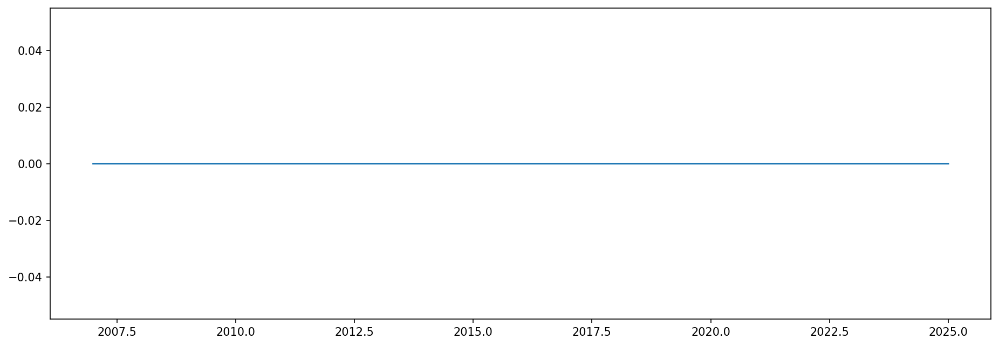

"\n\nplt.scatter(df['YEAR'], df['mag'], s=group['YEAR'],   # ขนาดวงกลมขึ้นกับ magnitude\n                color=colors[ttype], alpha=0.1)\n\n\nplt.scatter(group['YEAR'], group['MAG.'],\n                s=group['MAG.'],   # ขนาดวงกลมขึ้นกับ magnitude\n                color=colors[ttype], alpha=0.6, label=ttype)\n\n\n\nplt.show()      "

In [ ]:
#Plot Mag vs Year

df = df2
plt.figure(figsize=(15,5), dpi=150) # default
#ax = fig.gca()

#ax.plot(df['year'], df['mag'])
plt.plot(df['year'], df['mag'])
plt.show()
'''

plt.scatter(df['YEAR'], df['mag'], s=group['YEAR'],   # ขนาดวงกลมขึ้นกับ magnitude
                color=colors[ttype], alpha=0.1)


plt.scatter(group['YEAR'], group['MAG.'],
                s=group['MAG.'],   # ขนาดวงกลมขึ้นกับ magnitude
                color=colors[ttype], alpha=0.6, label=ttype)



plt.show()      '''


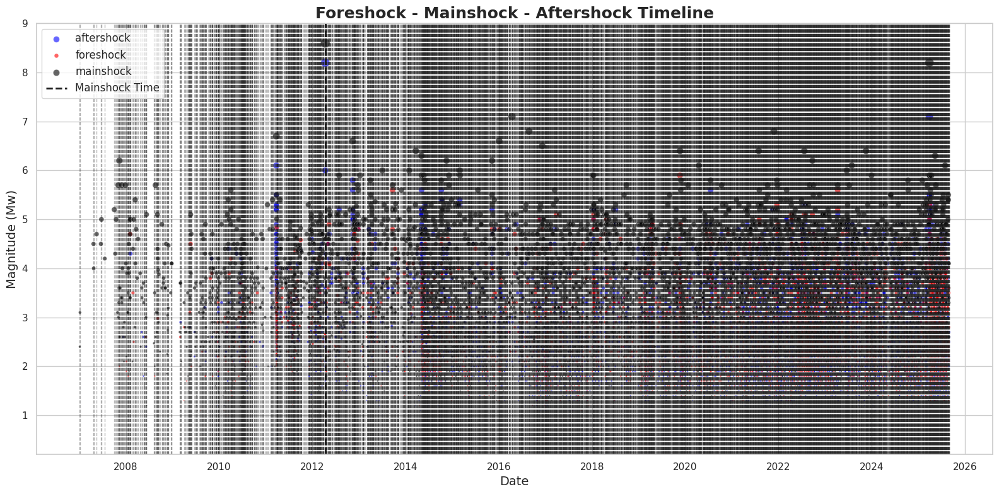

In [ ]:


# ===============================
# Rename columns
# ===============================
df_eq = df_eq.rename(columns={
    'No.':'no', 'REF. ID':'refid', 'DATE-TIME UTC':'dtutc','DATE_THAI':'date','YEAR':'year', 'MONTH' : 'month', 'DAY' : 'day',
    'TIME THAI':'time', 'LAT.':'lat', 'LONG.':'long','MAG.':'mag',
    'DEPTH.':'depth', 'PHASE.':'phase', 'REGION_NANE_THAI':'region_th','SUB_DISTINCT':'subdistrict',
    'DISTINCT':'district', 'PROVINCE':'province', 'COUNTRY':'country', 'REGION':'region'
})

# ===============================
# เตรียมข้อมูล datetime + magnitude
# ===============================
df_eq['dtutc'] = pd.to_datetime(df_eq['dtutc'], errors='coerce')
df_eq['mag'] = pd.to_numeric(df_eq['mag'], errors='coerce')
df_eq = df_eq.dropna(subset=['dtutc','mag']).copy()
df_eq['date_only'] = df_eq['dtutc'].dt.date

# ===============================
# หา mainshock/foreshock/aftershock
# ===============================
df_eq = df_eq.sort_values(['date_only','dtutc']).reset_index(drop=True)
mainshock_map = {}
for d, group in df_eq.groupby('date_only'):
    idxmax = group['mag'].idxmax()   # index ของ mainshock
    main_t = df_eq.loc[idxmax, 'dtutc']
    mainshock_map[d] = (idxmax, main_t)

def classify(row):
    d = row['date_only']
    if d not in mainshock_map:
        return 'other'
    idx, main_t = mainshock_map[d]
    if row.name == idx:
        return 'mainshock'
    elif row['dtutc'] < main_t:
        return 'foreshock'
    elif row['dtutc'] > main_t:
        return 'aftershock'
    else:
        return 'aftershock'

df_eq['event_type'] = df_eq.apply(classify, axis=1)

# ===============================
# Plot Timeline สวย ๆ
# ===============================
sns.set(style="whitegrid")

plt.figure(figsize=(16,8))

# กำหนดสี
colors = {'foreshock':'red', 'mainshock':'black', 'aftershock':'blue'}

for etype, group in df_eq.groupby('event_type'):
    plt.scatter(group['dtutc'], group['mag'],
                s=group['mag']**2.2,    # ขนาด bubble ∝ mag
                c=colors.get(etype,'gray'),
                alpha=0.6, edgecolors='w', linewidth=0.5, label=etype)

# เส้นแนวตั้ง Mainshock ของแต่ละวัน
for d,(idx,main_t) in mainshock_map.items():
    plt.axvline(main_t, color='k', linestyle='--', lw=1, alpha=0.3)

# Mainshock ใหญ่สุดของ dataset
biggest_idx = df_eq['mag'].idxmax()
biggest_t = df_eq.loc[biggest_idx,'dtutc']
plt.axvline(biggest_t, color='k', linestyle='--', lw=2, label='Mainshock Time')

# ตกแต่ง
plt.title("Foreshock - Mainshock - Aftershock Timeline", fontsize=18, weight='bold')
plt.xlabel("Date", fontsize=14)
plt.ylabel("Magnitude (Mw)", fontsize=14)
plt.legend(title="", fontsize=12)
plt.tight_layout()
plt.show()


🌍 Myanmar Earthquakes Filter:
   - Total earthquakes in Myanmar area: 12629
   - Date range: 2007-01-04 00:00:00 to 2025-08-30 00:00:00
📊 Mainshock Information (ใกล้เคียง 2025-03-28):
   - Actual Date/Time: 2025-03-28 00:00:00
   - Magnitude: 8.2
   - Days difference from target: 0 days
   - Total earthquakes in Myanmar: 12629

📈 Earthquake Types in Myanmar:
   - foreshock: 10360 events
   - aftershock: 2190 events
   - mainshock: 79 events


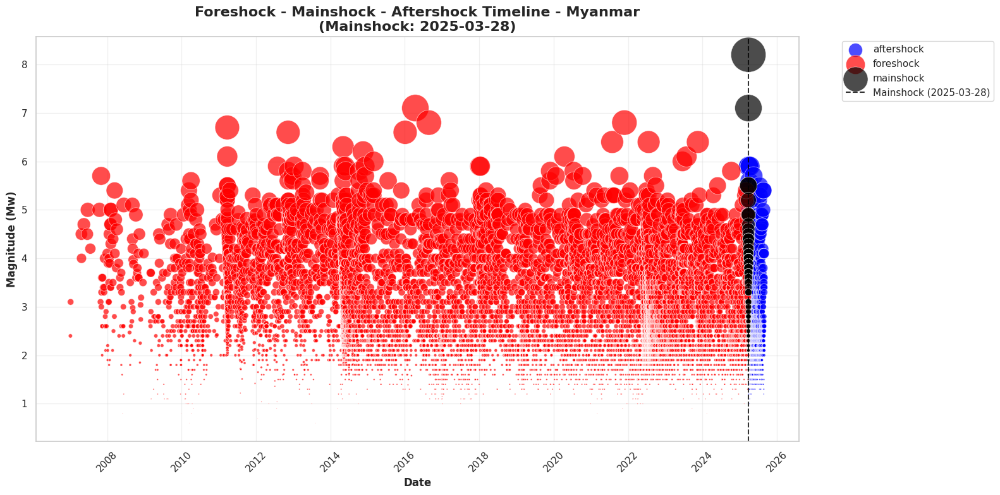


📋 Summary Statistics for Myanmar:
   - Time period: 2007-01-04 to 2025-08-30
   - Magnitude range: 0.6 - 8.2
   - Foreshock duration: 6658 days
   - Aftershock duration: 155 days


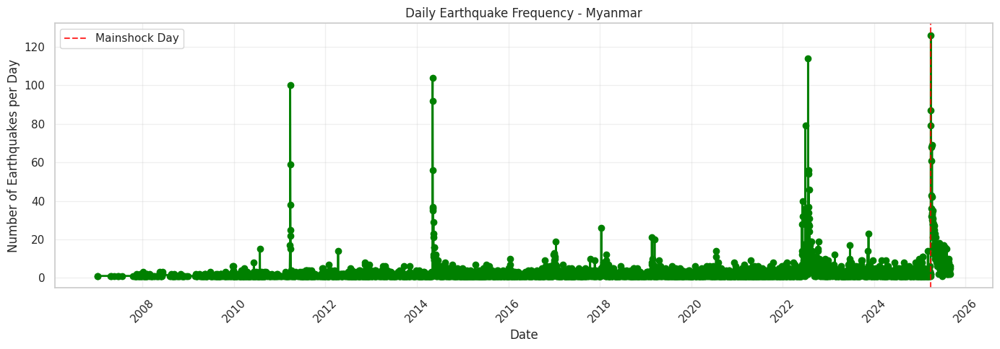


📊 Additional Myanmar Statistics:
   - Total earthquakes in Myanmar area: 12629
   - Earthquakes before 2025-03-28: 10360
   - Earthquakes after 2025-03-28: 2190
   - Earthquakes on 2025-03-28: 79
     Magnitudes: [8.2, 7.1, 5.5, 5.5, 5.2, 4.9, 4.9, 4.7, 4.1, 4.6, 4.5, 4.4, 4.4, 4.4, 4.3, 4.2, 3.3, 4.2, 4.1, 4.1, 3.1, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 3.9, 3.9, 3.1, 3.8, 3.8, 3.8, 3.7, 3.7, 3.7, 3.6, 3.6, 3.5, 3.5, 3.0, 3.4, 3.3, 3.3, 3.1, 3.1, 3.1, 3.0, 2.4, 2.9, 2.9, 2.8, 2.8, 2.8, 2.4, 2.8, 2.7, 2.2, 2.7, 2.6, 2.1, 2.6, 2.5, 2.5, 2.4, 2.4, 2.4, 2.4, 2.3, 1.9, 2.2, 2.1, 1.7, 1.6, 1.8, 1.6, 1.5, 1.7]


In [ ]:
# ใช้ DataFrame จาก df_eq
df = df_eq.copy()

# ✅ แก้ชื่อคอลัมน์ให้ตรง
df = df.rename(columns={
    'DATE_THAI': 'date',
    'MAG': 'mag',
    'LAT.': 'lat',
    'LONG.': 'long'
})

# === 1) กรองเฉพาะแผ่นดินไหวที่พม่า ===
# พม่า: ลองติจูดประมาณ 92-101, ละติจูดประมาณ 10-28
myanmar_bbox = {
    'min_lon': 92, 'max_lon': 101,
    'min_lat': 10, 'max_lat': 28
}

df_myanmar = df[
    (df['long'] >= myanmar_bbox['min_lon']) &
    (df['long'] <= myanmar_bbox['max_lon']) &
    (df['lat'] >= myanmar_bbox['min_lat']) &
    (df['lat'] <= myanmar_bbox['max_lat'])
].copy()

print(f"🌍 Myanmar Earthquakes Filter:")
print(f"   - Total earthquakes in Myanmar area: {len(df_myanmar)}")
print(f"   - Date range: {df_myanmar['date'].min()} to {df_myanmar['date'].max()}")

# === 2) แปลงเวลา ===
df_myanmar['date'] = pd.to_datetime(df_myanmar['date'], errors='coerce')

# === 3) กำหนด mainshock วันที่ 2025-03-28 ===
target_mainshock_date = pd.to_datetime('2025-03-28')

# หาแผ่นดินไหวที่ใกล้เคียงวันที่ 2025-03-28 มากที่สุด
time_diff = abs(df_myanmar['date'] - target_mainshock_date)
nearest_idx = time_diff.idxmin()
mainshock_time = df_myanmar.loc[nearest_idx, 'date']
mainshock_mag = df_myanmar.loc[nearest_idx, 'mag']

print(f"📊 Mainshock Information (ใกล้เคียง 2025-03-28):")
print(f"   - Actual Date/Time: {mainshock_time}")
print(f"   - Magnitude: {mainshock_mag}")
print(f"   - Days difference from target: {abs((mainshock_time - target_mainshock_date).days)} days")
print(f"   - Total earthquakes in Myanmar: {len(df_myanmar)}")

# === 4) สร้าง column ประเภทแผ่นดินไหว ===
df_myanmar['type'] = "aftershock"
df_myanmar.loc[df_myanmar['date'] < mainshock_time, 'type'] = "foreshock"
df_myanmar.loc[df_myanmar['date'] == mainshock_time, 'type'] = "mainshock"

# นับจำนวนแต่ละประเภท
type_counts = df_myanmar['type'].value_counts()
print(f"\n📈 Earthquake Types in Myanmar:")
for ttype, count in type_counts.items():
    print(f"   - {ttype}: {count} events")

# === 5) วาดกราฟ bubble chart ===
plt.figure(figsize=(16, 8))
colors = {"foreshock":"red", "mainshock":"black", "aftershock":"blue"}

for ttype, group in df_myanmar.groupby("type"):
    plt.scatter(group['date'], group['mag'],
                s=group['mag']**3.5,   # ขนาดวงกลมขึ้นกับ magnitude
                color=colors[ttype], alpha=0.7, label=ttype,
                edgecolors='white', linewidth=0.5)

# เส้นตั้งแสดง mainshock
plt.axvline(mainshock_time, color="black", linestyle="--", alpha=0.8, label=f"Mainshock ({mainshock_time.strftime('%Y-%m-%d')})")

plt.xlabel("Date", fontsize=12, fontweight='bold')
plt.ylabel("Magnitude (Mw)", fontsize=12, fontweight='bold')
plt.title(f"Foreshock - Mainshock - Aftershock Timeline - Myanmar\n(Mainshock: {mainshock_time.strftime('%Y-%m-%d')})", fontsize=16, fontweight='bold')

# ปรับแต่งกราฟ
plt.grid(True, alpha=0.3)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# หมุนป้ายวันที่เพื่อความอ่านง่าย
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# === 6) สรุปสถิติ ===
print(f"\n📋 Summary Statistics for Myanmar:")
print(f"   - Time period: {df_myanmar['date'].min().strftime('%Y-%m-%d')} to {df_myanmar['date'].max().strftime('%Y-%m-%d')}")
print(f"   - Magnitude range: {df_myanmar['mag'].min():.1f} - {df_myanmar['mag'].max():.1f}")

# คำนวณช่วงเวลา foreshock-aftershock
if len(df_myanmar[df_myanmar['type'] == 'foreshock']) > 0:
    foreshock_duration = mainshock_time - df_myanmar[df_myanmar['type'] == 'foreshock']['date'].min()
    print(f"   - Foreshock duration: {foreshock_duration.days} days")
else:
    print(f"   - No foreshocks detected")

if len(df_myanmar[df_myanmar['type'] == 'aftershock']) > 0:
    aftershock_duration = df_myanmar[df_myanmar['type'] == 'aftershock']['date'].max() - mainshock_time
    print(f"   - Aftershock duration: {aftershock_duration.days} days")
else:
    print(f"   - No aftershocks detected")

# === 7) กราฟเสริม: จำนวนแผ่นดินไหวต่อวัน ===
plt.figure(figsize=(14, 5))

# นับจำนวนเหตุการณ์ต่อวัน
daily_counts = df_myanmar.groupby(df_myanmar['date'].dt.date).size()

plt.plot(daily_counts.index, daily_counts.values, marker='o', linewidth=2, color='green')
plt.axvline(mainshock_time.date(), color="red", linestyle="--", alpha=0.8, label="Mainshock Day")

plt.xlabel("Date")
plt.ylabel("Number of Earthquakes per Day")
plt.title("Daily Earthquake Frequency - Myanmar")
plt.legend()
plt.xticks(rotation=45)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# === 8) สถิติเพิ่มเติมสำหรับพม่า ===
print(f"\n📊 Additional Myanmar Statistics:")
print(f"   - Total earthquakes in Myanmar area: {len(df_myanmar)}")
print(f"   - Earthquakes before 2025-03-28: {len(df_myanmar[df_myanmar['date'] < target_mainshock_date])}")
print(f"   - Earthquakes after 2025-03-28: {len(df_myanmar[df_myanmar['date'] > target_mainshock_date])}")

# ตรวจสอบว่ามีแผ่นดินไหวในวันที่ 2025-03-28 จริงหรือไม่
eq_on_target_date = df_myanmar[df_myanmar['date'].dt.date == target_mainshock_date.date()]
if len(eq_on_target_date) > 0:
    print(f"   - Earthquakes on 2025-03-28: {len(eq_on_target_date)}")
    print(f"     Magnitudes: {eq_on_target_date['mag'].tolist()}")
else:
    print(f"   - No earthquakes found exactly on 2025-03-28")
    print(f"   - Using nearest earthquake on {mainshock_time.strftime('%Y-%m-%d')}")

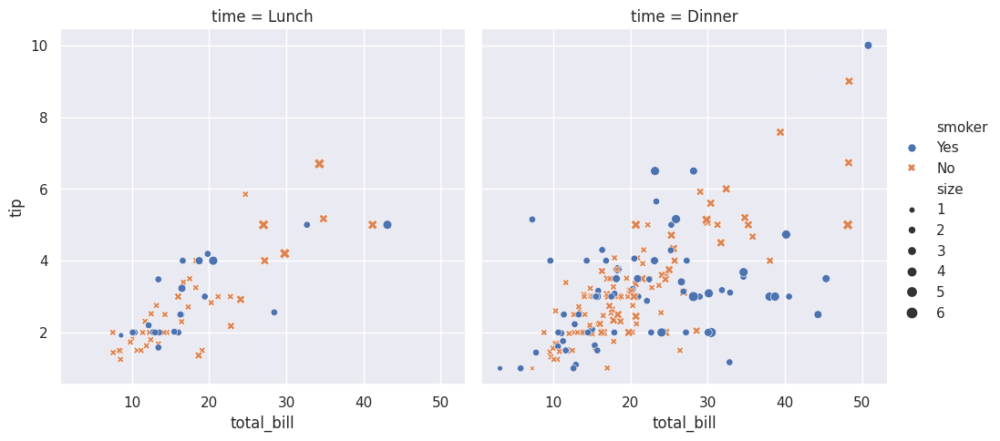

In [ ]:
# Example : Scatter plot with size

# Import seaborn
import seaborn as sns

# Apply the default theme
sns.set_theme()

# Load an example dataset
tips = sns.load_dataset("tips")

# Create a visualization
sns.relplot(
    data=tips,
    x="total_bill", y="tip", col="time",
    hue="smoker", style="smoker", size="size",
)

In [ ]:
# Subject : DADS5001 - Tools and Programing
# Project : Pandas/Numpy
# Topic : Study the factors to occur the eartquake

import pandas as pd
import numpy as np

# load data
from google.colab import drive
drive.mount('/content/drive')
df = pd.read_excel('/content/drive/MyDrive/Colab Notebooks/all-event.xlsx')

df.head()
#df.describe()
df.shape
df.info()

MessageError: Error: credential propagation was unsuccessful

In [ ]:
# Rename existing columns
df2 = df.rename(columns={'No.':'no', 'REF. ID':'refid', 'DATE-TIME UTC':'dtutc','DATE THAI':'date','TIME THAI':'time', 'LAT.':'lat', 'LONG.':'long','MAG.':'mag', 'DEPTH.':'depth', 'PHASE.':'phase', 'REGION.':'region','REGION..1':'region1', 'DETAIL':'detail' }) # default: inplace=False
df = df2
df2.info()

In [ ]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from scipy.interpolate import griddata

# โหลดข้อมูล
#file_path = "/mnt/data/all event .xlsx"
#df = pd.read_excel(file_path)

# แปลงคอลัมน์เวลา
df['time'] = pd.to_datetime(df['time'])
df['Month'] = df['time'].dt.to_period("M")

# เตรียม lat/lon grid
lons = df['long'].values
lats = df['lat'].values
lon_lin = np.linspace(min(lons), max(lons), 150)
lat_lin = np.linspace(min(lats), max(lats), 150)
lon_grid, lat_grid = np.meshgrid(lon_lin, lat_lin)

# เตรียมข้อมูลสำหรับแต่ละเดือน
frames = []
for month, group in df.groupby('Month'):
    if len(group) < 3:
        continue
    mags = group['mag'].values
    lons = group['long'].values
    lats = group['lat'].values

    # interpolate magnitude
    mag_grid = griddata((lons, lats), mags, (lon_grid, lat_grid), method='cubic')

    frames.append(go.Frame(
        data=[
            go.Heatmap(
                x=lon_lin, y=lat_lin, z=mag_grid,
                colorscale="RdYlBu_r", zmin=df['mag'].min(), zmax=df['mag'].max(),
                colorbar=dict(title="Magnitude")
            ),
            go.Scatter(
                x=lons, y=lats, mode="markers",
                marker=dict(size=mags*3, color=mags, colorscale="RdYlBu_r", line=dict(color="black", width=1)),
                name="Earthquakes"
            )
        ],
        name=str(month)
    ))

# กราฟเริ่มต้น (frame แรก)
fig = go.Figure(
    data=frames[0].data,
    layout=go.Layout(
        title="Earthquake Magnitude Heatmap (Monthly)",
        xaxis=dict(title="Longitude"),
        yaxis=dict(title="Latitude"),
        updatemenus=[{
            "type": "buttons",
            "buttons": [
                {"label": "Play", "method": "animate", "args": [None, {"frame": {"duration": 1000, "redraw": True}, "fromcurrent": True}]},
                {"label": "Pause", "method": "animate", "args": [[None], {"frame": {"duration": 0}, "mode": "immediate"}]}
            ]
        }]
    ),
    frames=frames
)

# เพิ่ม Slider
fig.update_layout(
    sliders=[{
        "steps": [
            {"args": [[f.name], {"frame": {"duration": 500, "redraw": True}, "mode": "immediate"}],
             "label": f.name, "method": "animate"}
            for f in frames
        ],
        "transition": {"duration": 300},
        "x": 0.1, "y": -0.1,
        "len": 0.9
    }]
)

fig.show()


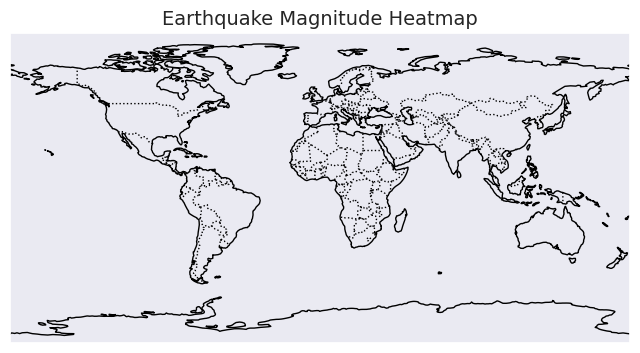

In [ ]:
# Animation

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from scipy.interpolate import griddata
from matplotlib.animation import FuncAnimation

# โหลดไฟล์ข้อมูล
#file_path = "/mnt/data/all event .xlsx"
#df = pd.read_excel(file_path)

# ตรวจสอบว่ามีคอลัมน์ Time หรือ DateTime
df['time'] = pd.to_datetime(df['time'])

# เรียงข้อมูลตามเวลา
df = df.sort_values('time')

# สร้างกรอบเวลา (เช่น รายวัน)
time_groups = df.groupby(df['time'].dt.date)

# เตรียม grid lat/lon
lons = df['long'].values
lats = df['lat'].values
lon_lin = np.linspace(min(lons), max(lons), 200)
lat_lin = np.linspace(min(lats), max(lats), 200)
lon_grid, lat_grid = np.meshgrid(lon_lin, lat_lin)

# ตั้งค่า plot
fig = plt.figure(figsize=(8,10))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.COASTLINE)
ax.set_title("Earthquake Magnitude Heatmap", fontsize=14)

# initial plot
contour = None
sc = None

def update(frame):
    global contour, sc
    if contour:  # ลบ contour เก่า
        for coll in contour.collections:
            coll.remove()
    if sc:
        sc.remove()

    date, group = frame
    lons = group['Longitude'].values
    lats = group['Latitude'].values
    mags = group['Magnitude'].values

    if len(group) < 3:
        return

    # interpolate magnitude
    mag_grid = griddata((lons, lats), mags, (lon_grid, lat_grid), method='cubic')

    # plot contour
    contour = ax.contourf(lon_grid, lat_grid, mag_grid, levels=20, cmap="RdYlBu_r", alpha=0.7,
                          transform=ccrs.PlateCarree())
    sc = ax.scatter(lons, lats, c=mags, cmap="RdYlBu_r", edgecolor="k", s=mags*10,
                    transform=ccrs.PlateCarree())
    ax.set_title(f"Earthquake Magnitude Heatmap\nDate: {date}", fontsize=14)

    return contour, sc

# สร้าง animation
ani = FuncAnimation(fig, update, frames=time_groups, repeat=False)

# บันทึกเป็นไฟล์ (เลือกอย่างใดอย่างหนึ่ง)
# ani.save("earthquake_heatmap.gif", writer="imagemagick", fps=2)
# ani.save("earthquake_heatmap.mp4", writer="ffmpeg", fps=2)

plt.show()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from scipy.interpolate import griddata

# โหลดไฟล์
#file_path = "/mnt/data/all event .xlsx"
#f = pd.read_excel(file_path)

# สมมติว่ามีคอลัมน์ Latitude, Longitude, Magnitude
lats = df['lat'].values
lons = df['long'].values
mags = df['mag'].values

# สร้าง grid (lat, lon)
lon_lin = np.linspace(min(lons), max(lons), 200)
lat_lin = np.linspace(min(lats), max(lats), 200)
lon_grid, lat_grid = np.meshgrid(lon_lin, lat_lin)

# Interpolate magnitude บน grid
mag_grid = griddata((lons, lats), mags, (lon_grid, lat_grid), method='cubic')

# เริ่ม plot แผนที่
fig = plt.figure(figsize=(8, 10))
ax = plt.axes(projection=ccrs.PlateCarree())

# ใส่แผนที่พื้นหลัง
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.COASTLINE)

# ระบายสี magnitude เป็น contour
contour = ax.contourf(lon_grid, lat_grid, mag_grid,
                      levels=20, cmap="RdYlBu_r", alpha=0.7,
                      transform=ccrs.PlateCarree())

# plot จุดจริงของแผ่นดินไหว
sc = ax.scatter(lons, lats, c=mags, cmap="RdYlBu_r", edgecolor="k",
                s=mags*10, transform=ccrs.PlateCarree())

# colorbar
cbar = plt.colorbar(contour, ax=ax, shrink=0.6, pad=0.05)
cbar.set_label("Magnitude")

ax.set_title("Earthquake Magnitude Heatmap", fontsize=14)
plt.show()


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# โหลดข้อมูล
#file_path = "/mnt/data/all event .xlsx"
#df = pd.read_excel(file_path)

# แปลงเวลาเป็น datetime
df["date"] = pd.to_datetime(df["date"])

# --- เตรียม bin สำหรับ magnitude ---
bins = [0,2,4,6,8]
df["Mag_bin"] = pd.cut(df["mag"], bins)

# สร้าง figure 2x2
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# ===== 1. Time vs Magnitude =====
axes[0,0].scatter(df["date"], df["mag"], alpha=0.7, c="blue")
axes[0,0].set_title("Time vs Magnitude")
axes[0,0].set_xlabel("Time")
axes[0,0].set_ylabel("Magnitude")

# ===== 2. Magnitude vs Region =====
sns.boxplot(x="region", y="mag", data=df, ax=axes[0,1])
axes[0,1].set_title("Magnitude Distribution by Region")
axes[0,1].tick_params(axis="x", rotation=45)

# ===== 3. Time vs Depth (colored by Phase) =====
sc = axes[1,0].scatter(df["time"], df["depth"], c=df["phase"],
                       cmap="viridis", alpha=0.7)
axes[1,0].set_title("Time vs Depth (colored by Phase)")
axes[1,0].set_xlabel("Time")
axes[1,0].set_ylabel("Depth (km)")
cbar = fig.colorbar(sc, ax=axes[1,0])
cbar.set_label("Phase")

'''
# ===== 4. Frequency of Magnitude Range by Region =====
sns.countplot(x="Mag_bin", hue="region", data=df, ax=axes[1,1])
axes[1,1].set_title("Frequency of Magnitude Range by Region")
axes[1,1].set_xlabel("Magnitude Range")
axes[1,1].set_ylabel("Count")
'''

plt.tight_layout()
plt.show()


In [ ]:
# Create DataFrame from a list of lists
# Use default indexing for both row and column
#df = pd.DataFrame( [ row0, row1, row2, row3, row4 ] )

# Inspect the data
print( f"type = {type(df)}" )
print( f"shape = {df.shape}" )
print( f"row index = {df.index}")
print( f"column index = {df.columns}" )
print( f"\ndtypes:\n{df.dtypes}\n" )


df.shape()
#df.head
#df.iloc(3,7)

type = <class 'pandas.core.frame.DataFrame'>
shape = (3678, 29)
row index = Index([  438,  4952,   876,  2269,  1647,  5166,  2172,  4271,   121,  7796,
       ...
        1983, 14812,  2914,  6571,  1325,  6380,  6411, 14208,  2443, 12251],
      dtype='int64', length=3678)
column index = Index(['no', 'refid', 'dtutc', 'date', 'year', 'month', 'day', 'time', 'lat',
       'long', 'mag', 'MAG_RANGE', 'MAG_RANGE_DES', 'depth', 'phase',
       'region_th', 'subdistrict', 'district', 'province', 'country', 'region',
       'REGION_NAME_ENG', 'DETAIL', 'mag_gt_0', 'mag_ge_5', 'country_norm',
       'type', 'Month', 'Mag_bin'],
      dtype='object')

dtypes:
no                          int64
refid                      object
dtutc                      object
date               datetime64[ns]
year                        int32
month                       int32
day                         int64
time               datetime64[ns]
lat                       float64
long                      float6

TypeError: 'tuple' object is not callable

In [ ]:
print(df.columns)
df

In [ ]:
# use actual data
'''
import pandas as pd
import matplotlib.pyplot as plt
'''

# โหลดข้อมูลจากไฟล์ Excel
#file_path = "/mnt/data/all event .xlsx"
#df = pd.read_excel(file_path)

# ตรวจสอบชื่อคอลัมน์
print(df.columns)

# สมมติว่ามี column: Time, Magnitude, Depth
# ถ้า Time เป็น string ต้องแปลงเป็น datetime
df["time"] = pd.to_datetime(df["time"])

# เรียงตามเวลา (กันพลาด)
df = df.sort_values("time")

# เริ่ม plot
fig, ax1 = plt.subplots(figsize=(12, 6))

# Plot Magnitude (แกนซ้าย)
ax1.plot(df["time"], df["mag"], color="tab:blue", marker="o", label="Magnitude")
ax1.set_xlabel("time")
ax1.set_ylabel("Magnitude", color="tab:blue")
ax1.tick_params(axis="y", labelcolor="tab:blue")

# สร้างแกนขวาสำหรับ Depth
ax2 = ax1.twinx()
ax2.plot(df["time"], df["depth"], color="tab:red", marker="x", label="Depth")
ax2.set_ylabel("Depth (km)", color="tab:red")
ax2.tick_params(axis="y", labelcolor="tab:red")

# รวม legend
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc="upper left")

plt.title("Earthquake Magnitude and Depth over Time")
plt.show()


== Tiger ==